In [1]:
#!/usr/bin/env python

#import pyfits, os, re, glob, sys
import  os, re, glob, sys
from scipy.optimize import leastsq
from numpy import *
from pylab import *
from scipy import *
from scipy import optimize
import numpy as N
import pylab as P

import numpy as np
from scipy.optimize import curve_fit

𝑦=𝑀(1−𝑒**−𝑎𝑥)

In [2]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import linear_model
from scipy.special import expit
from numpy import math
import pandas as pd

/home/imager/.local/lib/python2.7/site-packages/pandas/core/computation/__init__.py:18: UserWarning: The installed version of numexpr 2.4.3 is not supported in pandas and will be not be used
The minimum supported version is 2.4.6

  ver=ver, min_ver=_MIN_NUMEXPR_VERSION), UserWarning)


As a quick and dirty alternative to the perhaps more principled approach, here is something you could try. Ultimately, it could be merged with an direct estimation approach.
If you assume your responses are governed by two exponential processes characterizing the rise and decay of your calcium signal,
you could see a solution of this form:

2:20
y = K1*(1-e^(t/tau1)) - K2*(1-e(t/tau2))
If you plot this out, you'll see that the first term gives you a simple asymptotic rise to a plateau at K1 (according to time constant tau1), and the second term can account for a slow decay according to tau2.
2:22
Here is some simple characteristics of model:
If your muscle rises to a steady plateau, K2 is likely to be zero, the exception being if the rise time is not well fir by a single exponential, in which case you might have a situation where K1>K2.
If your muscle rises and then decays back to zero and steady state, then K1=K2.

In [3]:
yaw_left_df = pd.read_csv('yaw_left_df_nrm.csv')
yaw_right_df = pd.read_csv('yaw_right_df_nrm.csv')
pitch_up_df = pd.read_csv('pitch_up_df_nrm.csv')
pitch_down_df = pd.read_csv('pitch_down_df_nrm.csv')
roll_cw_df = pd.read_csv('roll_cw_df_nrm.csv')
roll_ccw_df = pd.read_csv('roll_ccw_df_nrm.csv')

In [5]:
yaw_left_df.head()

,mean,mean_er,mean_WBF,WBF_er,b1_l,b2_l,b3_l,i1_l,i2_l,iii1_l,...,b2_r,b3_r,i1_r,i2_r,iii1_r,iii3_r,hg1_r,hg2_r,hg3_r,hg4_r
0,-0.111219,0.237409,189.753086,23.631635,0.713727,0.147900,0.709205,0.322492,0.213129,0.279419,...,0.121877,0.747691,0.325043,0.144657,0.342212,0.693696,0.239365,0.315804,0.052088,0.109425
1,0.003628,0.214715,189.657407,23.295794,0.732946,0.145748,0.706551,0.270736,0.170597,0.264723,...,0.122329,0.733431,0.293944,0.144604,0.312577,0.689042,0.218624,0.298289,0.064887,0.121824
2,0.001301,0.194306,189.663580,23.292818,0.726914,0.143671,0.703217,0.270570,0.172469,0.262976,...,0.121539,0.730410,0.292975,0.147173,0.311252,0.688696,0.217225,0.297358,0.064228,0.121584
3,-0.005300,0.198833,189.663580,23.273277,0.720271,0.141691,0.696865,0.268966,0.171274,0.260429,...,0.120756,0.727895,0.291981,0.144961,0.309774,0.687073,0.216224,0.295540,0.063504,0.120777
4,-0.004466,0.198948,189.669753,23.263022,0.728512,0.143804,0.704527,0.270861,0.174551,0.261543,...,0.121360,0.729566,0.292494,0.144264,0.312545,0.690641,0.217038,0.297926,0.064307,0.122115


In [11]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')

In [12]:
stimuli_list = (yaw_left_df, yaw_right_df, pitch_up_df, pitch_down_df, roll_cw_df, roll_ccw_df)

def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = exponential_f(x, *parameterTuple)
    return numpy.sum((y - val) ** 2.0)


def generate_Initial_Parameters():
    # min and max used for bounds
    #maxK = max(100)
    #minK = min(-10)
    #maxtau = max(100)
    #mintau = min(-10)
    #maxXY = max(maxK, maxtau)
    maxXY = 50

    parameterBounds = []
    parameterBounds.append([-10, 10]) # seach bounds for k1
    parameterBounds.append([-10, 10]) # seach bounds for k2
    parameterBounds.append([-10, 10]) # seach bounds for tau1
    parameterBounds.append([-10, 10]) # seach bounds for tau2

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=0)
    return result.x

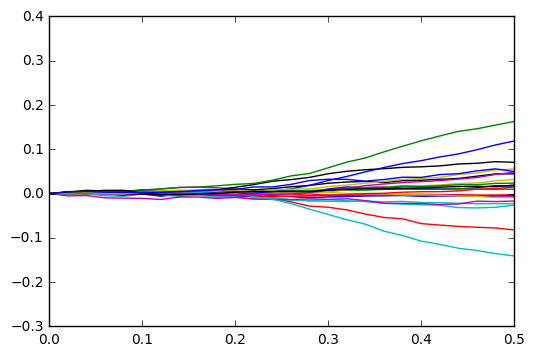

In [30]:
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df



for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        d_y = np.gradient(y)
        x1 = times[150:350]
        x=x1-x1[0]
        
        #plt.plot(x, d_y)
        plt.plot(x, y)
        plt.xlim(0, 0.5)
        
plt.show()

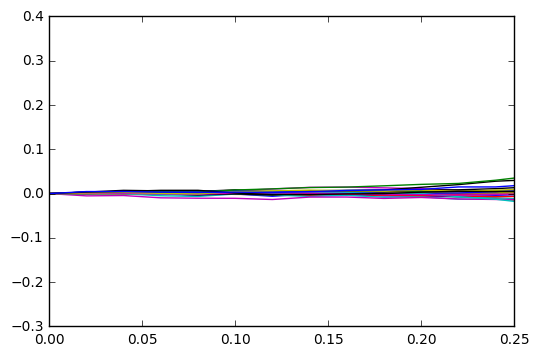

In [31]:
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df



for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        d_y = np.gradient(y)
        x1 = times[150:350]
        x=x1-x1[0]
        
        #plt.plot(x, d_y)
        plt.plot(x, y)
        plt.xlim(0, 0.25)
        
plt.show()

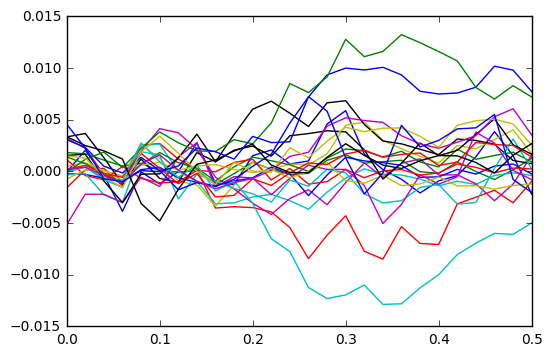

In [29]:
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df



for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        d_y = np.gradient(y)
        x1 = times[150:350]
        x=x1-x1[0]
        
        plt.plot(x, d_y)
        #plt.plot(x, y, '.')
        plt.xlim(0, 0.5)
        
plt.show()



In [13]:
### with delay term 
'''
def populate_S(func, thresh):
    y = func[0:50]
    d_y = np.gradient(y)
    y0 = y[0] 
    y20 = y[20]
    S= np.empty(200)
    for i in range(len(t)):
        if t[i] < thresh:
            S[i] = y0
        else:
             S[i] =1
    return S*z
'''    
S= np.empty(200)    

def exponential_f(t, K1, K2, tau1, tau2, theta): #, S, y0, thresh):
    z= K1*(1-math.e**(-(t-theta)/tau1)) + K2*(1-math.e**(-(t-theta)/tau2)) #+ or - k2
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    for i in range(len(t)):
        if t[i] < theta:
            S[i] = 0
        else:
             S[i] =1
    return S*z

def single_exponential_f(t, K1, tau1, theta): #, S, y0, thresh):
    z= K1*(1-math.e**(-(t-theta)/tau1)) #+ or - k2
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    for i in range(len(t)):
        if t[i] < theta:
            S[i] = 0
        else:
             S[i] =1
    return S*z
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-(t-theta)/tau1)) - K2*(1-math.e**(-(t-theta)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


# function for genetic algorithm to minimize (sum of squared error)
def sumOfSquaredError(parameterTuple):
    warnings.filterwarnings("ignore") # do not print warnings by genetic algorithm
    val = exponential_f(x, *parameterTuple)
    return numpy.sum((y - val) ** 2.0)


def generate_Initial_Parameters():
    # min and max used for bounds
    #maxK = max(100)
    #minK = min(-10)
    #maxtau = max(100)
    #mintau = min(-10)
    #maxXY = max(maxK, maxtau)
    maxXY = 50

    parameterBounds = []
    parameterBounds.append([-10, 10]) # seach bounds for k1
    parameterBounds.append([-10, 10]) # seach bounds for k2
    parameterBounds.append([-10, 10]) # seach bounds for tau1
    parameterBounds.append([-10, 10]) # seach bounds for tau2
    parameterBounds.append([-10, 10]) # seach bounds for theta

    # "seed" the numpy random number generator for repeatable results
    result = differential_evolution(sumOfSquaredError, parameterBounds, seed=0)
    return result.x





In [24]:
df_exponential_constants = pd.DataFrame()

In [161]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},

###with theta

#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_left_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('yaw_left_constants_theta.csv') 

In [14]:
df_1 = pd.DataFrame()

In [10]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df

In [11]:
means = yaw_right_df['mean']

('K1 =', 8.4222799933156161, '+/-', nan)
('k2 =', -8.4323017487944067, '+/-', nan)
('tau_1 =', 0.75368077530890787, '+/-', nan)
('tau_2 =', 0.76010799911070115, '+/-', nan)
('theta =', 0.21217894419842656, '+/-', nan)
muscle
b1_l


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:29: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:30: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:32: RuntimeWarning: invalid value encountered in double_scalars


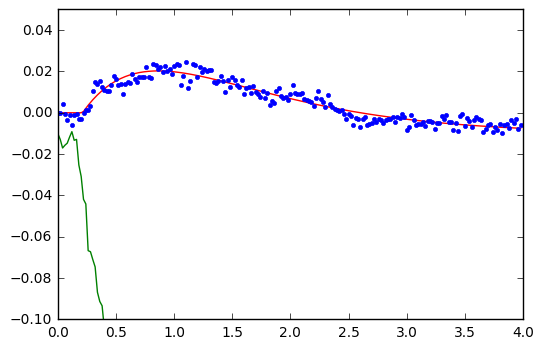

In [15]:
muscle = 'b1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,-20,0.25,0.9, 0.1]), maxfev=2000000)

tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')

plt.plot(x, mean[150:350])



plt.xlim(0, 4.0)
plt.ylim(-0.1, 0.05)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 8.4222799933156161, '+/-', nan)
('k2 =', -8.4323017487944067, '+/-', nan)
('tau_1 =', 0.75368077530890787, '+/-', nan)
('tau_2 =', 0.76010799911070115, '+/-', nan)
('theta =', 0.21217894419842656, '+/-', nan)
muscle
b1_l


/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:29: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:30: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in double_scalars
/home/imager/.local/lib/python2.7/site-packages/ipykernel/__main__.py:32: RuntimeWarning: invalid value encountered in double_scalars


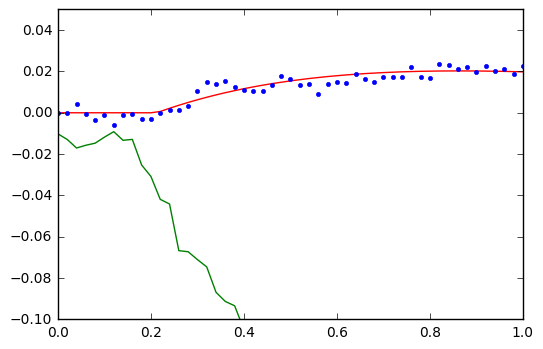

In [20]:
muscle = 'b1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,-20,0.25,0.9, 0.1]), maxfev=2000000)

tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')

plt.plot(x, mean[150:350])



plt.xlim(0, 1.0)
plt.ylim(-0.1, 0.05)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 60.648796983350572, '+/-', 132116.70328558004)
('k2 =', -60.785183979005517, '+/-', 132116.69212690619)
('tau_1 =', 2.7340483089518557, '+/-', 132116.70328558004)
('tau_2 =', 2.7530263901009988, '+/-', 132116.69212690619)
('theta =', 0.39900652829205269, '+/-', 132116.69212690619)
muscle
b2_l


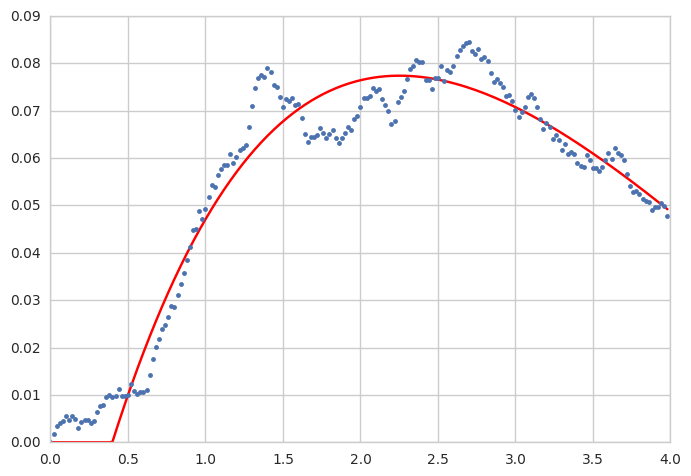

In [271]:
muscle = 'b2_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,-20,0.25,0.9, 0.1]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 47.97740428825778, '+/-', 57852.347117875266)
('k2 =', -48.010744775806657, '+/-', 57852.347174174218)
('tau_1 =', 0.35290763598062375, '+/-', 57852.347117875266)
('tau_2 =', 0.35173081567151782, '+/-', 57852.347174174218)
('theta =', 0.21648096786176357, '+/-', 57852.347174174218)
muscle
b3_l


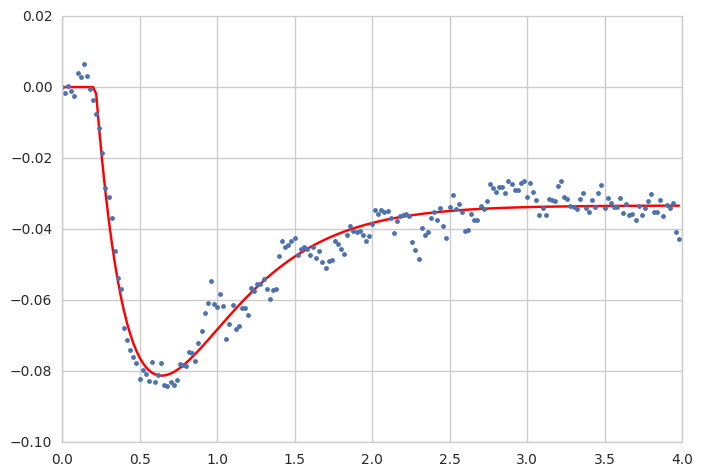

In [274]:
muscle = 'b3_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,-20,0.25,0.9, 0.1]), maxfev=2000000)

tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 61.139361666475615, '+/-', 227897.22896411645)
('k2 =', -61.142044373899203, '+/-', 227897.2316310326)
('tau_1 =', 1.4953510607658882, '+/-', 227897.22896411645)
('tau_2 =', 1.4962963781472762, '+/-', 227897.2316310326)
('theta =', 0.99999999999999989, '+/-', 227897.2316310326)
muscle
i1_l


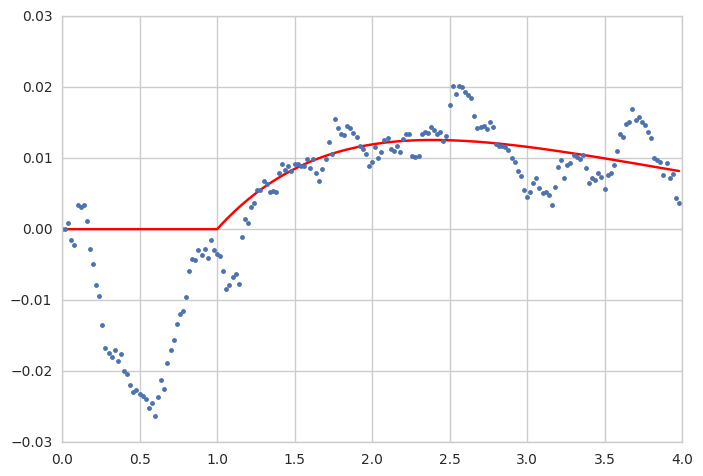

In [277]:
muscle = 'i1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,-20,0.25,0.9, 0.1]), maxfev=2000000)

tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 62.172129891722179, '+/-', 74399.882397883572)
('k2 =', -62.190950794175997, '+/-', 74399.882433706909)
('tau_1 =', 0.59088079302033203, '+/-', 74399.882397883572)
('tau_2 =', 0.59122016762850338, '+/-', 74399.882433706909)
('theta =', 0.99999999999999989, '+/-', 74399.882433706909)
muscle
i2_l


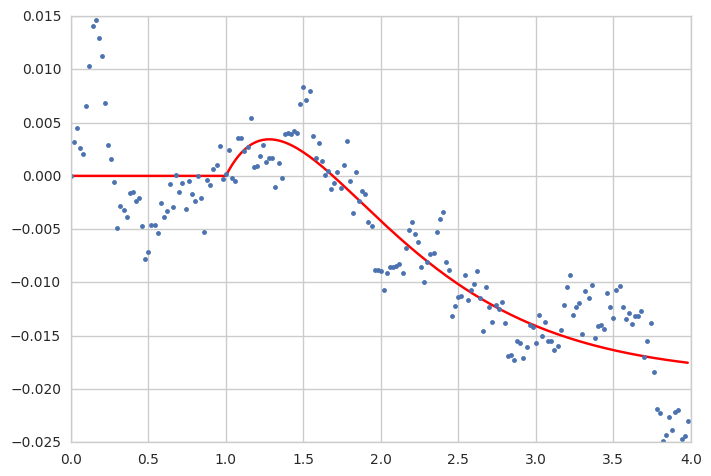

In [280]:
muscle = 'i2_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,-20,0.25,0.9, 0.1]), maxfev=2000000)

tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 0.15161669636892519, '+/-', 0.00073813977215027456)
('tau_1 =', 0.74111091414580976, '+/-', 0.00073813977215027456)
('theta =', 0.3307649569406062, '+/-', 0.017607412858992279)
muscle
iii1_l


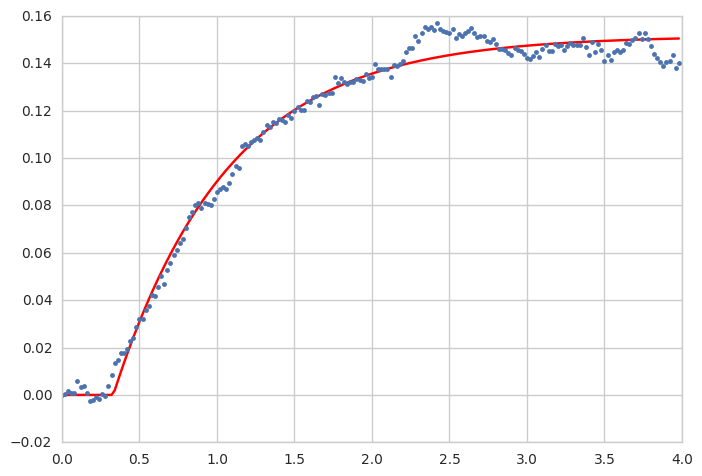

In [287]:
muscle = 'iii1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.1]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 4.8871104104977974, '+/-', 3167.4776515306462)
('k2 =', -4.8350791657569276, '+/-', 3167.2853167136072)
('tau_1 =', 2.1822296231126379, '+/-', 3167.4776515306462)
('tau_2 =', 2.3273003481934138, '+/-', 3167.2853167136072)
('theta =', 0.28174001822970918, '+/-', 3167.2853167136072)
muscle
iii1_l


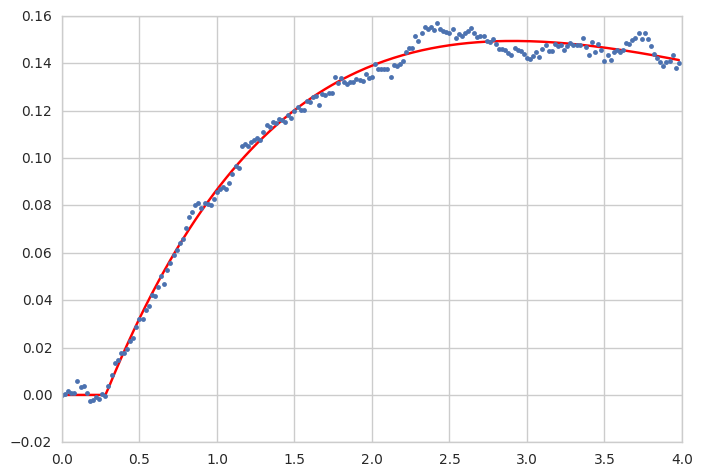

In [300]:
muscle = 'iii1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 0.13528938372671048, '+/-', 0.00038680199282765054)
('tau_1 =', 0.5651739394792209, '+/-', 0.00038680199282765054)
('theta =', 0.099769356340454779, '+/-', 0.0099520791874005334)
muscle
iii3_l


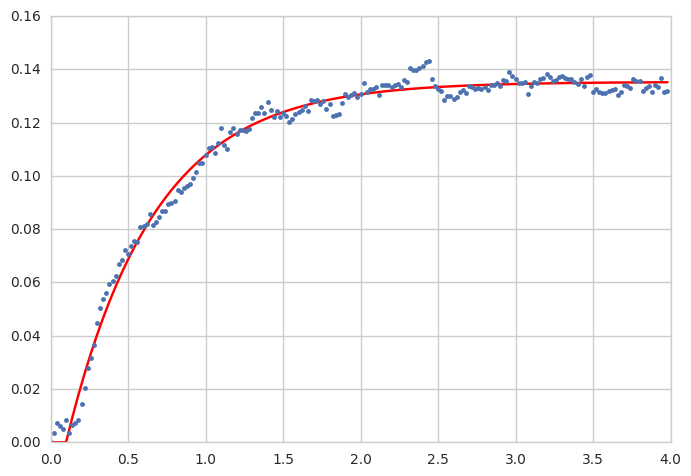

In [304]:
muscle = 'iii3_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.1]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 62.228577008063965, '+/-', 210445.26574673413)
('k2 =', -62.559116363268778, '+/-', 210445.13834027227)
('tau_1 =', 8.2163459683338225, '+/-', 210445.26574673413)
('tau_2 =', 8.2773738271601847, '+/-', 210445.13834027227)
('theta =', 0.53999935655652742, '+/-', 210445.13834027227)
muscle
hg1_l


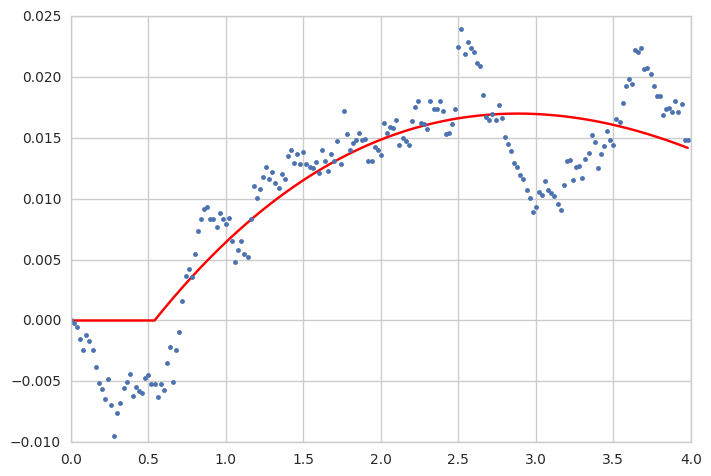

In [307]:
muscle = 'hg1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 61.293529645258999, '+/-', 32252.136368828411)
('k2 =', -61.262471311116343, '+/-', 32252.136255682792)
('tau_1 =', 2.1685444640676685, '+/-', 32252.136368828411)
('tau_2 =', 2.1739366354185838, '+/-', 32252.136255682792)
('theta =', 0.17657497000040828, '+/-', 32252.136255682792)
muscle
hg2_l


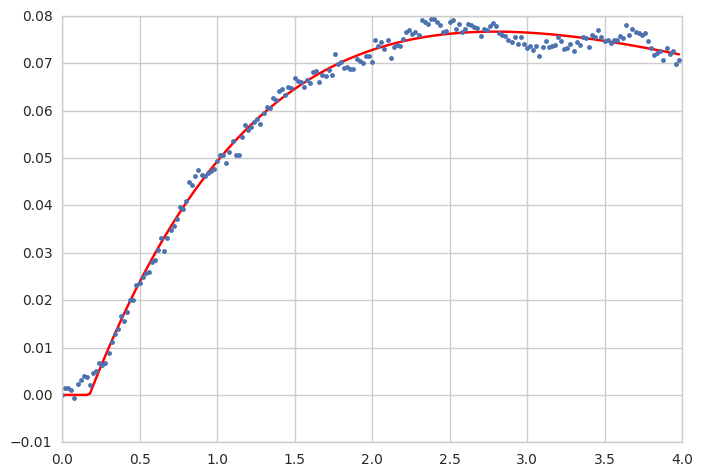

In [310]:
muscle = 'hg2_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', -0.012759217547493762, '+/-', 0.0003501385352617517)
('tau_1 =', 1.3053066818663961, '+/-', 0.0003501385352617517)
('theta =', -0.022982721102478992, '+/-', 0.11921088878835945)
muscle
hg3_l


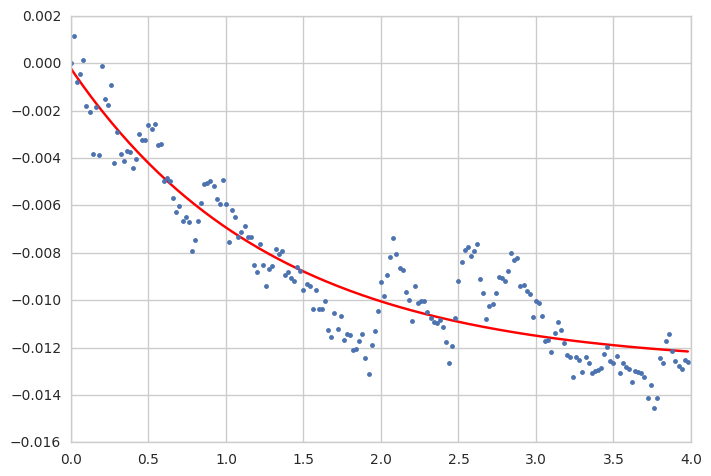

In [314]:
muscle = 'hg3_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.1]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', -0.055276718624539707, '+/-', 0.0011131942176368166)
('tau_1 =', 1.368720504451864, '+/-', 0.0011131942176368166)
('theta =', -0.17436234415073112, '+/-', 0.098476079433620425)
muscle
hg4_l


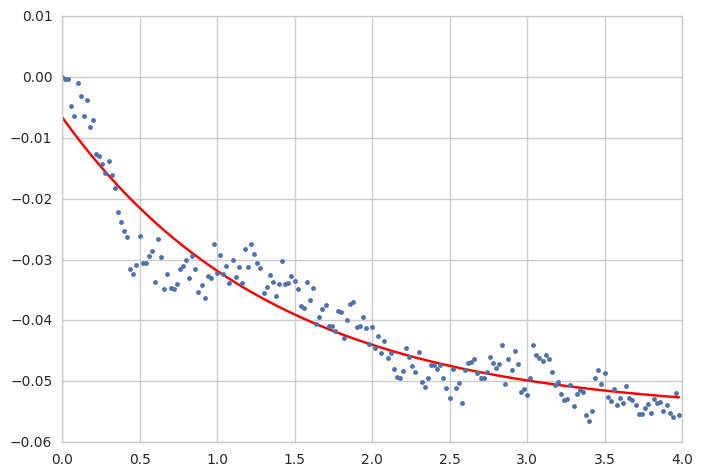

In [318]:
muscle = 'hg4_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.1]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 64.132262548034547, '+/-', 64589.60025494406)
('k2 =', -64.121386068842654, '+/-', 64589.600255663914)
('tau_1 =', 0.85670250012154392, '+/-', 64589.60025494406)
('tau_2 =', 0.85567201531457671, '+/-', 64589.600255663914)
('theta =', 1.7477714403883114e-19, '+/-', 64589.600255663914)
muscle
b1_r


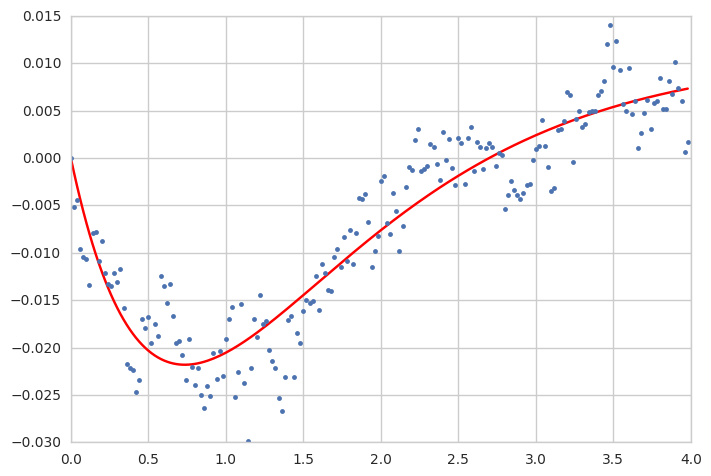

In [321]:
muscle = 'b1_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', -0.031419655782820369, '+/-', 0.00012495875097018539)
('tau_1 =', 0.40094186872043053, '+/-', 0.00012495875097018539)
('theta =', 0.3511417486526538, '+/-', 0.011972916709296127)
muscle
b2_r


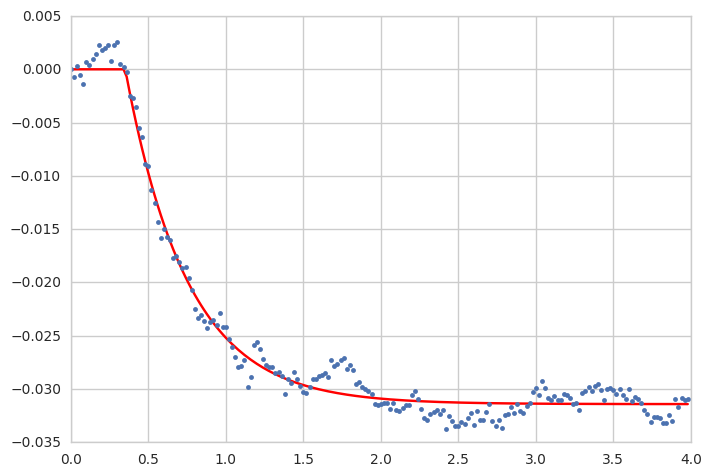

In [325]:
muscle = 'b2_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.1]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 70.633178281296779, '+/-', 46520.024441050249)
('k2 =', -70.578752881313036, '+/-', 46520.02463939166)
('tau_1 =', 1.2410156106237145, '+/-', 46520.024441050249)
('tau_2 =', 1.2432754905218875, '+/-', 46520.02463939166)
('theta =', 0.13473209074892628, '+/-', 46520.02463939166)
muscle
b3_r


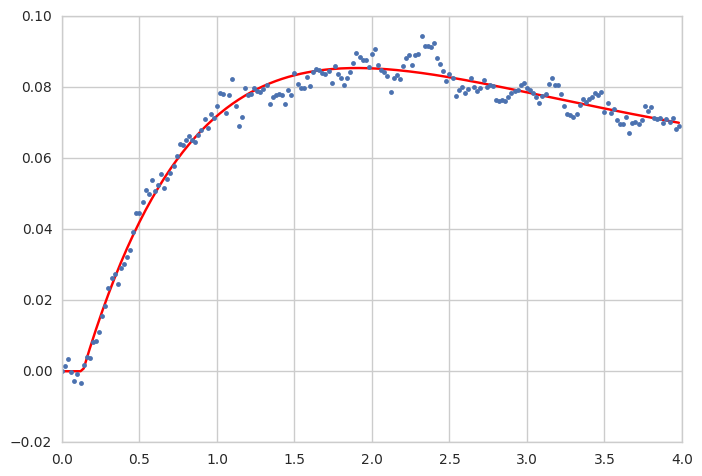

In [329]:
muscle = 'b3_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 0.59115621370525806, '+/-', 0.17444605499163676)
('k2 =', -0.37115582654205331, '+/-', 0.15700342489252428)
('tau_1 =', 0.76362746236184487, '+/-', 0.17444605499163676)
('tau_2 =', 1.887164323323286, '+/-', 0.15700342489252428)
('theta =', 0.25019482380645652, '+/-', 0.15700342489252428)
muscle
i1_r


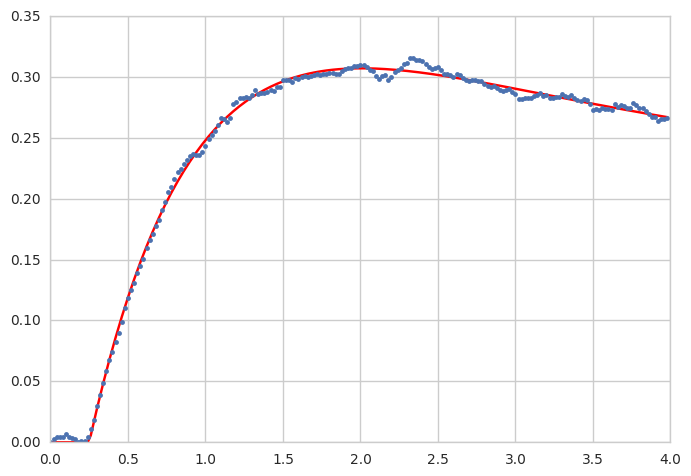

In [332]:
muscle = 'i1_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 32.363977171453158, '+/-', 90977.568982393044)
('k2 =', -32.075570606840792, '+/-', 90977.567902222407)
('tau_1 =', 0.63466173555355698, '+/-', 90977.568982393044)
('tau_2 =', 0.63876729755961625, '+/-', 90977.567902222407)
('theta =', 0.21247725316789956, '+/-', 90977.567902222407)
muscle
i2_r


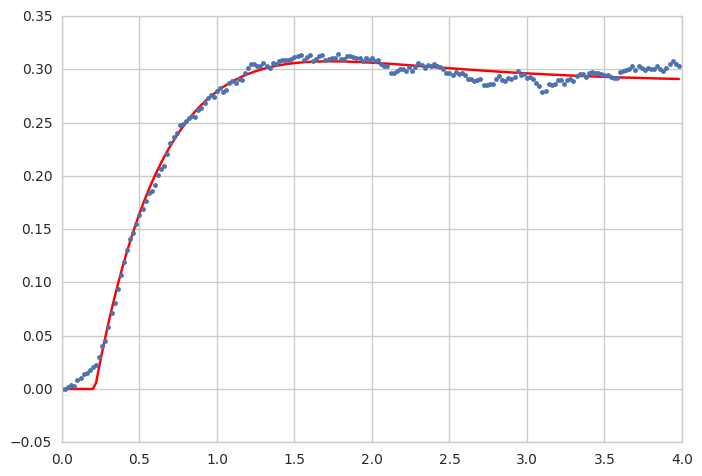

In [335]:
muscle = 'i2_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 148.61766837781275, '+/-', 100333.30470333563)
('k2 =', -0.25559417115228089, '+/-', 0.0076363233855048073)
('tau_1 =', 6621.5906612432655, '+/-', 100333.30470333563)
('tau_2 =', 0.34805778591316594, '+/-', 0.0076363233855048073)
('theta =', 0.21712372459368798, '+/-', 0.0076363233855048073)
muscle
iii3_r


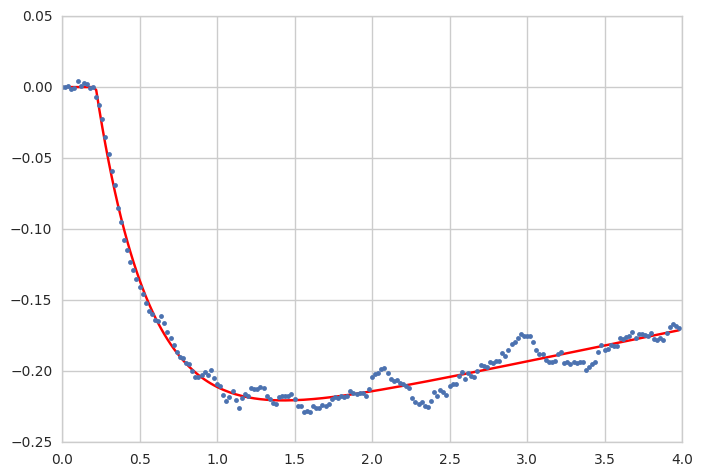

In [338]:
muscle = 'iii3_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 56.823057185157182, '+/-', 49076.033564504847)
('k2 =', -56.810313898481226, '+/-', 49076.033328455058)
('tau_1 =', 1.496400524965237, '+/-', 49076.033564504847)
('tau_2 =', 1.5006630260206988, '+/-', 49076.033328455058)
('theta =', 0.38923966167525043, '+/-', 49076.033328455058)
muscle
iii1_r


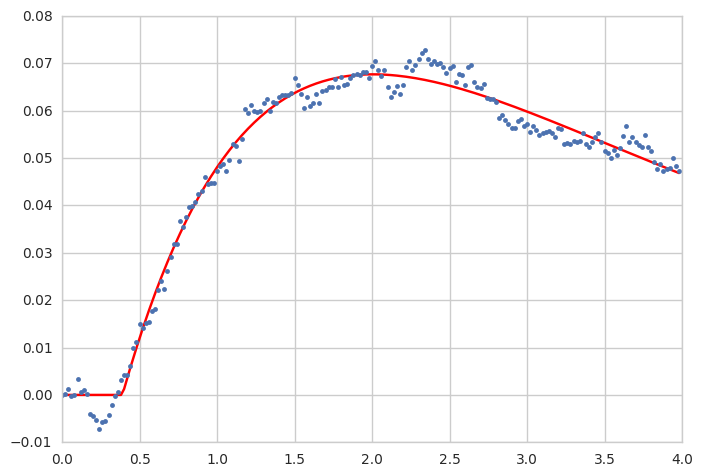

In [341]:
muscle = 'iii1_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 64.591110244889251, '+/-', 114439.73763402847)
('k2 =', -64.488960455161148, '+/-', 114439.73579833085)
('tau_1 =', 1.2545128696166992, '+/-', 114439.73763402847)
('tau_2 =', 1.2597028404357278, '+/-', 114439.73579833085)
('theta =', 0.3095618078630461, '+/-', 114439.73579833085)
muscle
hg1_r


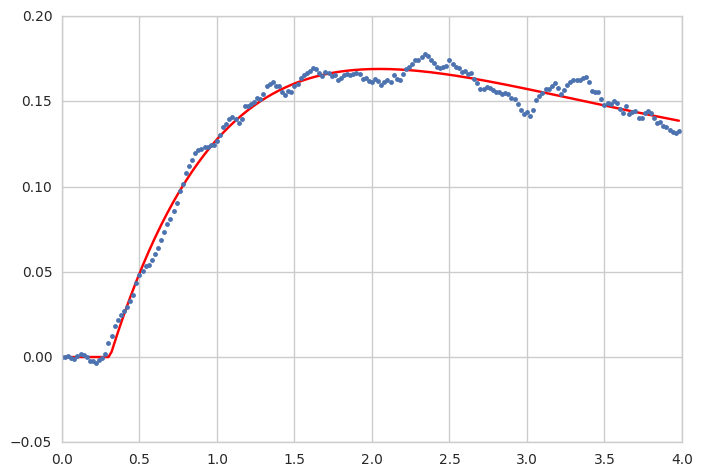

In [344]:
muscle = 'hg1_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 0.17007311818964371, '+/-', 0.00055560525627401409)
('tau_1 =', 0.65731348523490385, '+/-', 0.00055560525627401409)
('theta =', 0.23319016904398779, '+/-', 0.011689306044967578)
muscle
hg2_r


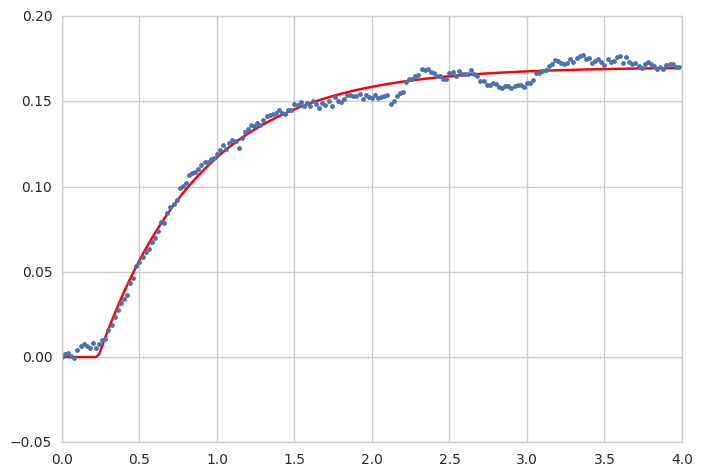

In [348]:
muscle = 'hg2_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.1]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 0.15498691296182177, '+/-', 0.0083938259470753649)
('tau_1 =', 4.3828269799188, '+/-', 0.0083938259470753649)
('theta =', 0.032335813372158351, '+/-', 0.36259505414779036)
muscle
hg3_r


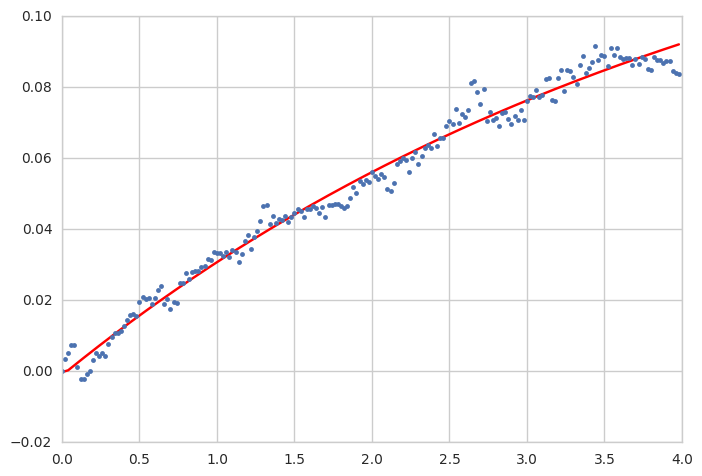

In [351]:
muscle = 'hg3_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.1]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 62.436645223661849, '+/-', 109317.9003515393)
('k2 =', -62.38178625160532, '+/-', 109317.90006858211)
('tau_1 =', 1.0369666690050787, '+/-', 109317.9003515393)
('tau_2 =', 1.0395021498720287, '+/-', 109317.90006858211)
('theta =', 0.13488069287828575, '+/-', 109317.90006858211)
muscle
hg4_r


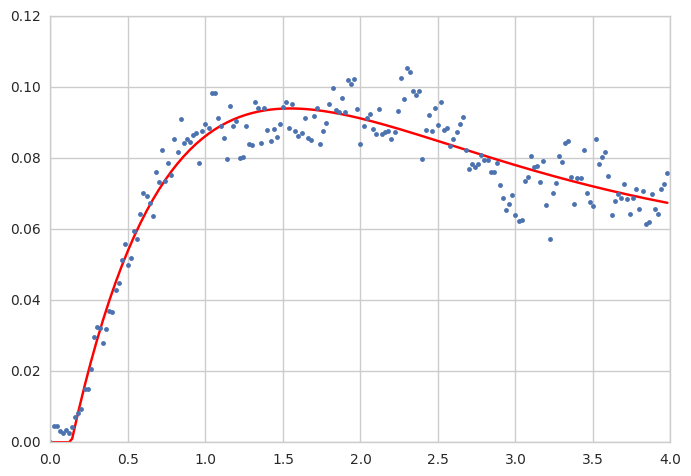

In [355]:
muscle = 'hg4_r'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.2]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [288]:
#large_df_try = large_df

In [289]:
#large_df_try = large_df_try.append(df)

In [290]:
#large_df_try

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,8.422280,-8.432302,b1_l,yaw_right,0.753681,0.760108,0.760108,0.753681,0.212179
0,60.648797,-60.785184,b2_l,yaw_right,2.734048,2.753026,2.753026,2.734048,0.399007
0,47.977404,-48.010745,b3_l,yaw_right,0.352908,0.351731,0.351731,0.352908,0.216481
0,61.139362,-61.142044,i1_l,yaw_right,1.495351,1.496296,1.496296,1.495351,1.000000
0,62.172130,-62.190951,i2_l,yaw_right,0.590881,0.591220,0.591220,0.590881,1.000000
0,0.151617,NaN,iii1_l,yaw_right,0.741111,NaN,0.741111,NaN,0.330765


In [356]:
large_df = large_df.append(df)

In [267]:
#large_df = df

In [357]:
large_df

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,8.422280,-8.432302,b1_l,yaw_right,0.753681,0.760108,0.760108,0.753681,2.121789e-01
0,60.648797,-60.785184,b2_l,yaw_right,2.734048,2.753026,2.753026,2.734048,3.990065e-01
0,47.977404,-48.010745,b3_l,yaw_right,0.352908,0.351731,0.351731,0.352908,2.164810e-01
0,61.139362,-61.142044,i1_l,yaw_right,1.495351,1.496296,1.496296,1.495351,1.000000e+00
0,62.172130,-62.190951,i2_l,yaw_right,0.590881,0.591220,0.591220,0.590881,1.000000e+00
0,4.887110,-4.835079,iii1_l,yaw_right,2.182230,2.327300,2.327300,2.182230,2.817400e-01
0,0.135289,NaN,iii3_l,yaw_right,0.565174,NaN,0.565174,NaN,9.976936e-02
0,62.228577,-62.559116,hg1_l,yaw_right,8.216346,8.277374,8.277374,8.216346,5.399994e-01
0,61.293530,-61.262471,hg2_l,yaw_right,2.168544,2.173937,2.173937,2.168544,1.765750e-01
0,-0.012759,NaN,hg3_l,yaw_right,1.305307,NaN,1.305307,NaN,-2.298272e-02


In [358]:
large_df.to_csv('yaw_right_complete_constants.csv') 

In [ ]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii3_r', 'iii1_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'R', 'B', 'B', 'R', 'R', 'R')


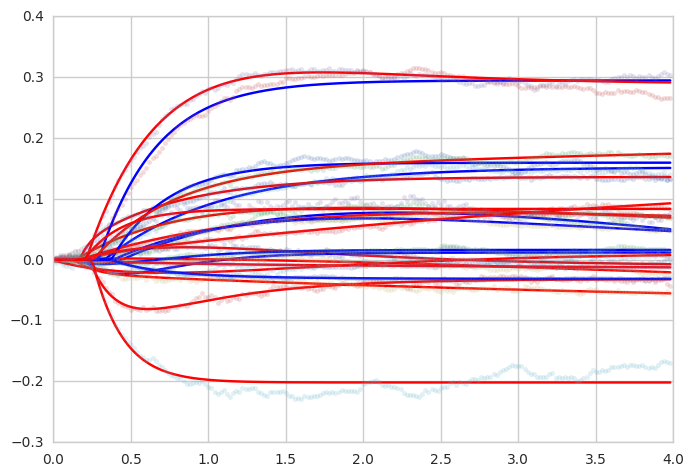

In [361]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 4.0)
plt.show()

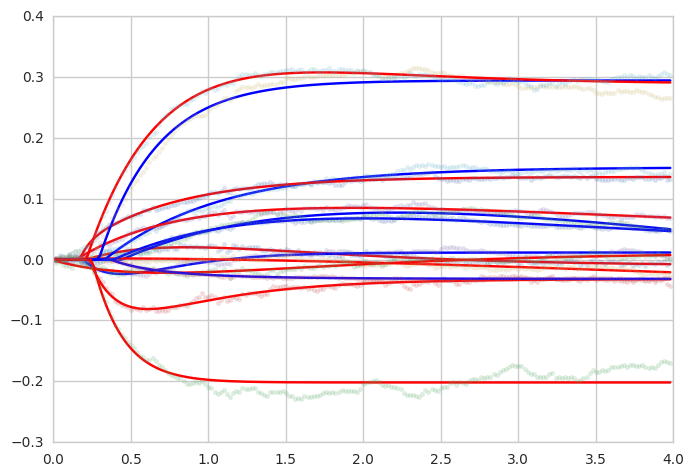

In [362]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 4.0)
plt.show()

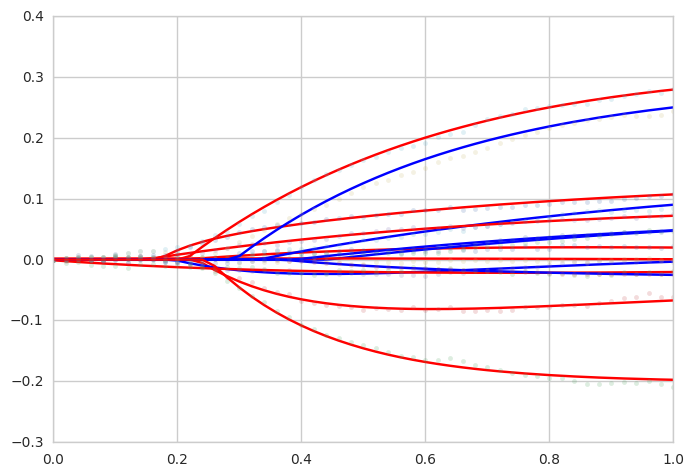

In [363]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 1.0)
plt.show()

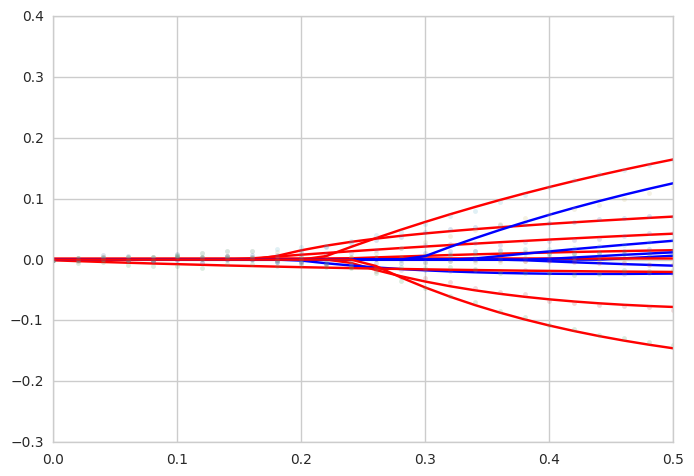

In [367]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 0.5)
plt.show()

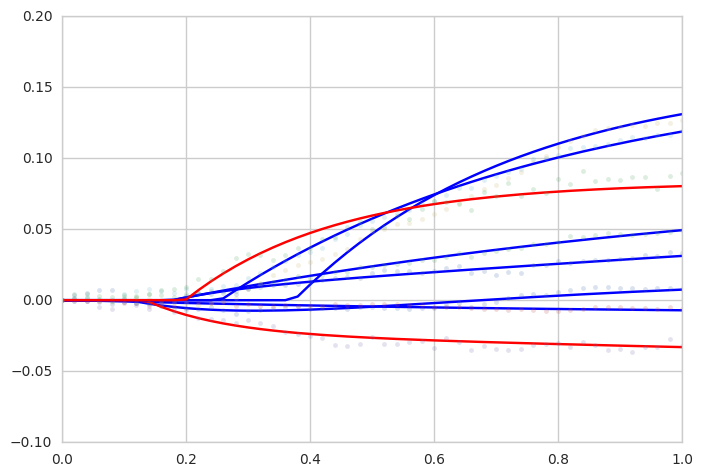

In [371]:
muscle_list = ('hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('B', 'B', 'B', 'R', 'B', 'B', 'B', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 1.0)
plt.show()

In [373]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii3_r', 'iii1_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'B', 'R', 'R', 'R', 'B')

In [375]:
large_df_trail_a['tonic_phasic']= muscle_assign 

In [376]:
large_df_trail_a

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta,tonic_phasic
0,8.422280,-8.432302,b1_l,yaw_right,0.753681,0.760108,0.760108,0.753681,2.121789e-01,R
0,60.648797,-60.785184,b2_l,yaw_right,2.734048,2.753026,2.753026,2.734048,3.990065e-01,B
0,47.977404,-48.010745,b3_l,yaw_right,0.352908,0.351731,0.351731,0.352908,2.164810e-01,R
0,61.139362,-61.142044,i1_l,yaw_right,1.495351,1.496296,1.496296,1.495351,1.000000e+00,B
0,62.172130,-62.190951,i2_l,yaw_right,0.590881,0.591220,0.591220,0.590881,1.000000e+00,R
0,4.887110,-4.835079,iii1_l,yaw_right,2.182230,2.327300,2.327300,2.182230,2.817400e-01,B
0,0.135289,NaN,iii3_l,yaw_right,0.565174,NaN,0.565174,NaN,9.976936e-02,R
0,62.228577,-62.559116,hg1_l,yaw_right,8.216346,8.277374,8.277374,8.216346,5.399994e-01,R
0,61.293530,-61.262471,hg2_l,yaw_right,2.168544,2.173937,2.173937,2.168544,1.765750e-01,R
0,-0.012759,NaN,hg3_l,yaw_right,1.305307,NaN,1.305307,NaN,-2.298272e-02,R


In [374]:
large_df_trail_a = large_df

In [384]:
a = large_df_trail_a.reset_index()

In [385]:
a

,index,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta,tonic_phasic
0,0,8.422280,-8.432302,b1_l,yaw_right,0.753681,0.760108,0.760108,0.753681,2.121789e-01,R
1,0,60.648797,-60.785184,b2_l,yaw_right,2.734048,2.753026,2.753026,2.734048,3.990065e-01,B
2,0,47.977404,-48.010745,b3_l,yaw_right,0.352908,0.351731,0.351731,0.352908,2.164810e-01,R
3,0,61.139362,-61.142044,i1_l,yaw_right,1.495351,1.496296,1.496296,1.495351,1.000000e+00,B
4,0,62.172130,-62.190951,i2_l,yaw_right,0.590881,0.591220,0.591220,0.590881,1.000000e+00,R
5,0,4.887110,-4.835079,iii1_l,yaw_right,2.182230,2.327300,2.327300,2.182230,2.817400e-01,B
6,0,0.135289,NaN,iii3_l,yaw_right,0.565174,NaN,0.565174,NaN,9.976936e-02,R
7,0,62.228577,-62.559116,hg1_l,yaw_right,8.216346,8.277374,8.277374,8.216346,5.399994e-01,R
8,0,61.293530,-61.262471,hg2_l,yaw_right,2.168544,2.173937,2.173937,2.168544,1.765750e-01,R
9,0,-0.012759,NaN,hg3_l,yaw_right,1.305307,NaN,1.305307,NaN,-2.298272e-02,R


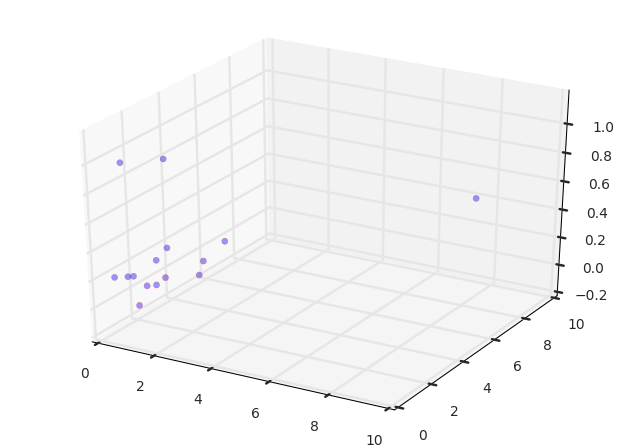

In [390]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = a['theta']
xdata = a['tau_a']
ydata = a['tau_i']
color_data =a['tonic_phasic']
   
  
ax.scatter3D(xdata, ydata, zdata, color=color_data, alpha = 0.4);
ax.set_xlim(0, 10); ax.set_ylim(0, 10); ax.set_zlim(-0.2, 1.2);
plt.show()

In [ ]:
Order most tonic to most phasic -- organize by sclerite group and by maneuver 

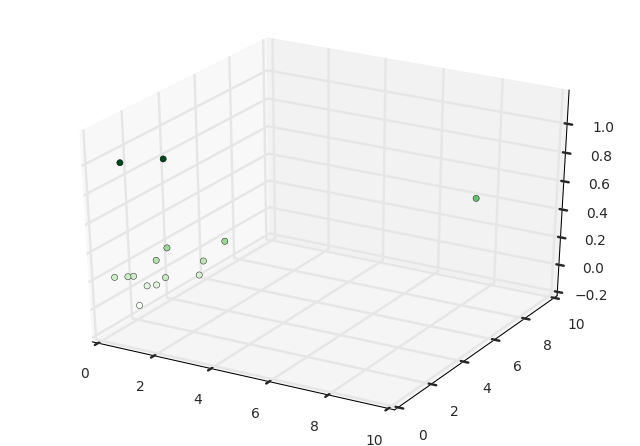

In [366]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = large_df['theta']
xdata = large_df['tau_a']
ydata = large_df['tau_i']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.set_xlim(0, 10); ax.set_ylim(0, 10); ax.set_zlim(-0.2, 1.2);
plt.show()

In [365]:
large_df

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,8.422280,-8.432302,b1_l,yaw_right,0.753681,0.760108,0.760108,0.753681,2.121789e-01
0,60.648797,-60.785184,b2_l,yaw_right,2.734048,2.753026,2.753026,2.734048,3.990065e-01
0,47.977404,-48.010745,b3_l,yaw_right,0.352908,0.351731,0.351731,0.352908,2.164810e-01
0,61.139362,-61.142044,i1_l,yaw_right,1.495351,1.496296,1.496296,1.495351,1.000000e+00
0,62.172130,-62.190951,i2_l,yaw_right,0.590881,0.591220,0.591220,0.590881,1.000000e+00
0,4.887110,-4.835079,iii1_l,yaw_right,2.182230,2.327300,2.327300,2.182230,2.817400e-01
0,0.135289,NaN,iii3_l,yaw_right,0.565174,NaN,0.565174,NaN,9.976936e-02
0,62.228577,-62.559116,hg1_l,yaw_right,8.216346,8.277374,8.277374,8.216346,5.399994e-01
0,61.293530,-61.262471,hg2_l,yaw_right,2.168544,2.173937,2.173937,2.168544,1.765750e-01
0,-0.012759,NaN,hg3_l,yaw_right,1.305307,NaN,1.305307,NaN,-2.298272e-02


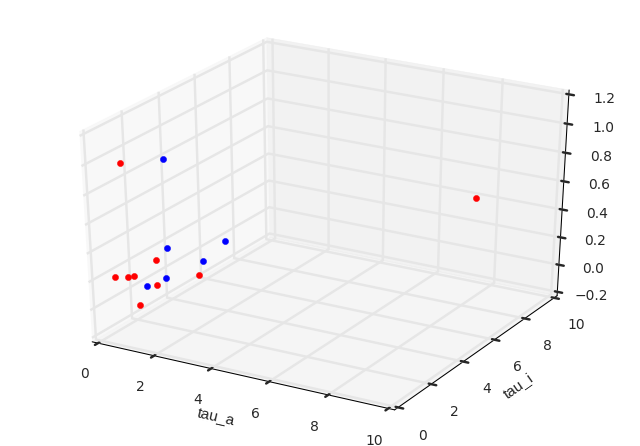

In [397]:
#muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
#muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
#fig = plt.figure()
ax = plt.axes(projection='3d')
 
counter = 0
    
for muscle in muscle_list:
    x =a.ix[counter]['tau_a']
    y = a.ix[counter]['tau_i']
    z = a.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0 

plt.xlim(0,10)
plt.ylim(0,10)
plt.xlabel('tau_a')
plt.ylabel('tau_i')
#plt.zlabel('theta')
    
plt.show()
 

In [15]:
### now yaw left
stimulus =yaw_left_df

('K1 =', 0.017954585757672639, '+/-', 0.00053725875806202741)
('tau_1 =', 0.7436799159118952, '+/-', 0.00053725875806202741)
('theta =', 0.63999993361934726, '+/-', 0.09989433371356847)
muscle
b1_l


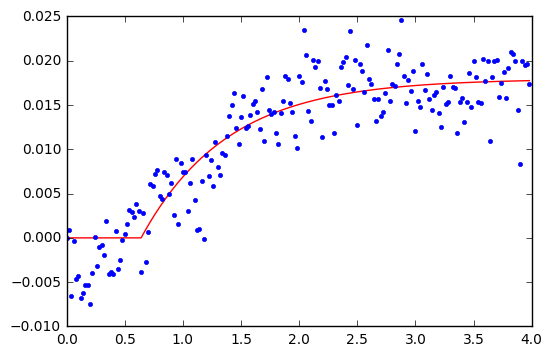

In [26]:
muscle = 'b1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 0.2)), max_nfev=2000000)
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.0]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

yaw_left_constants_df = df

In [28]:
yaw_left_constants_df = yaw_left_constants_df.append(df)


In [31]:
yaw_left_constants_df

,K1,muscle,stimulus,tau1,tau_a,theta
0,0.017955,b1_l,yaw_right,0.74368,0.74368,0.64


('K1 =', 62.27946250253617, '+/-', 28089.871163627795)
('k2 =', -62.25494449607347, '+/-', 28089.870922767321)
('tau_1 =', 2.4205384995601391, '+/-', 28089.871163627795)
('tau_2 =', 2.4167226315541668, '+/-', 28089.870922767321)
('theta =', 0.21822381214569303, '+/-', 28089.870922767321)
muscle
b2_l


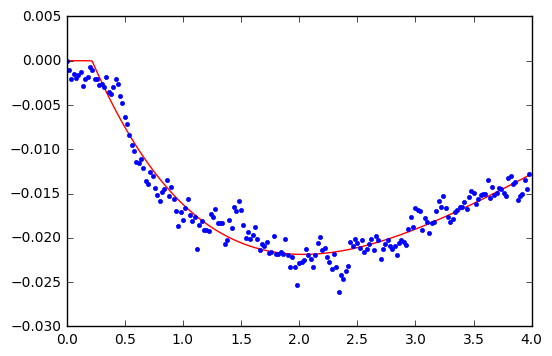

In [33]:
muscle = 'b2_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.01]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [34]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

In [35]:
yaw_left_constants_df

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,0.017955,NaN,b1_l,yaw_right,0.743680,NaN,0.743680,NaN,0.640000
0,62.279463,-62.254944,b2_l,yaw_right,2.420538,2.416723,2.416723,2.420538,0.218224


('K1 =', 63.891506474319371, '+/-', 74675.93536288834)
('k2 =', -63.849398090008947, '+/-', 74675.935460306529)
('tau_1 =', 0.99656824910983843, '+/-', 74675.93536288834)
('tau_2 =', 0.99768587527459951, '+/-', 74675.935460306529)
('theta =', 0.073568555671965796, '+/-', 74675.935460306529)
muscle
b3_l


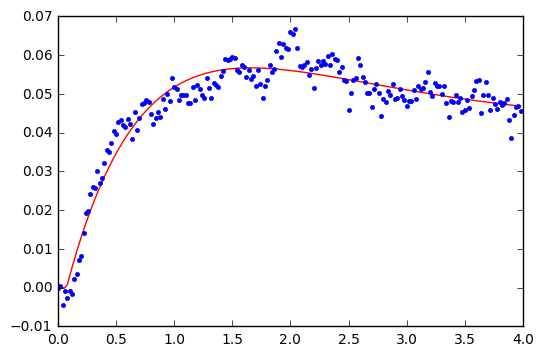

In [36]:
muscle = 'b3_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.01]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [37]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

In [38]:
yaw_left_constants_df

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,0.017955,NaN,b1_l,yaw_right,0.743680,NaN,0.743680,NaN,0.640000
0,62.279463,-62.254944,b2_l,yaw_right,2.420538,2.416723,2.416723,2.420538,0.218224
0,63.891506,-63.849398,b3_l,yaw_right,0.996568,0.997686,0.997686,0.996568,0.073569


('K1 =', 64.816546312751399, '+/-', 131937.16063629818)
('k2 =', -64.706999979839239, '+/-', 131937.14438753805)
('tau_1 =', 2.035541655928141, '+/-', 131937.16063629818)
('tau_2 =', 2.0529878174224732, '+/-', 131937.14438753805)
('theta =', 0.16604502041043398, '+/-', 131937.14438753805)
muscle
i1_l


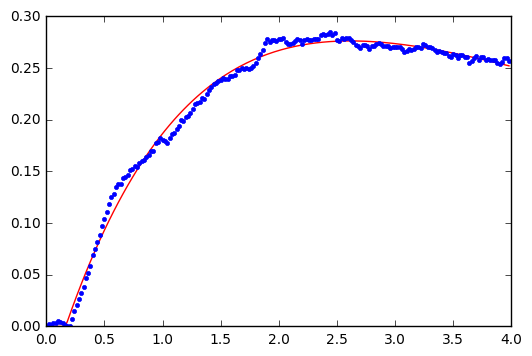

In [39]:
muscle = 'i1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.01]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [40]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

In [41]:
yaw_left_constants_df

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,0.017955,NaN,b1_l,yaw_right,0.743680,NaN,0.743680,NaN,0.640000
0,62.279463,-62.254944,b2_l,yaw_right,2.420538,2.416723,2.416723,2.420538,0.218224
0,63.891506,-63.849398,b3_l,yaw_right,0.996568,0.997686,0.997686,0.996568,0.073569
0,64.816546,-64.707000,i1_l,yaw_right,2.035542,2.052988,2.052988,2.035542,0.166045


('K1 =', 62.561475857446034, '+/-', 128274.4230775977)
('k2 =', -62.542846660556542, '+/-', 128274.38315827293)
('tau_1 =', 2.3550668827102257, '+/-', 128274.4230775977)
('tau_2 =', 2.3816456350803401, '+/-', 128274.38315827293)
('theta =', 0.084977962499579576, '+/-', 128274.38315827293)
muscle
i2_l


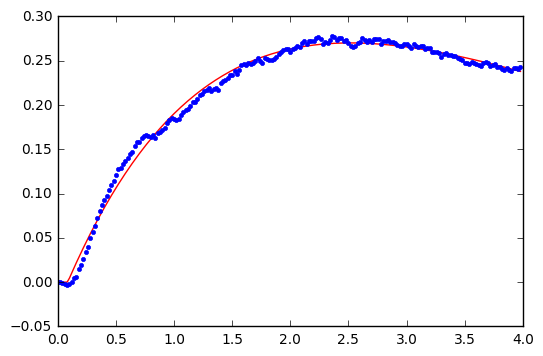

In [42]:
muscle = 'i2_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.01]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [43]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

In [44]:
yaw_left_constants_df

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,0.017955,NaN,b1_l,yaw_right,0.743680,NaN,0.743680,NaN,0.640000
0,62.279463,-62.254944,b2_l,yaw_right,2.420538,2.416723,2.416723,2.420538,0.218224
0,63.891506,-63.849398,b3_l,yaw_right,0.996568,0.997686,0.997686,0.996568,0.073569
0,64.816546,-64.707000,i1_l,yaw_right,2.035542,2.052988,2.052988,2.035542,0.166045
0,62.561476,-62.542847,i2_l,yaw_right,2.355067,2.381646,2.381646,2.355067,0.084978


('K1 =', 52.229395572541392, '+/-', 67617.475468597127)
('k2 =', -52.247832514951973, '+/-', 67617.472560628608)
('tau_1 =', 2.7641311646591586, '+/-', 67617.475468597127)
('tau_2 =', 2.7781651530260989, '+/-', 67617.472560628608)
('theta =', 0.22181759526148859, '+/-', 67617.472560628608)
muscle
iii1_l


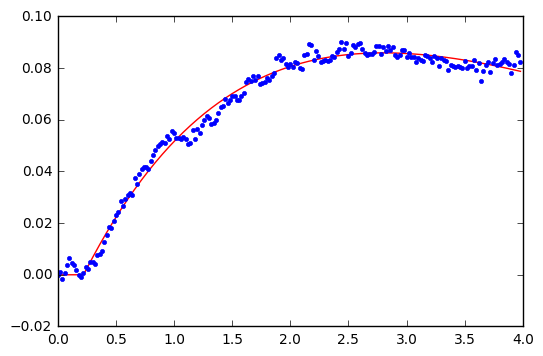

In [45]:
muscle = 'iii1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.01]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [46]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

('K1 =', 34.145745578877786, '+/-', 143159.62066198903)
('k2 =', -34.335926502247773, '+/-', 143159.62142724314)
('tau_1 =', 0.65311956901199419, '+/-', 143159.62066198903)
('tau_2 =', 0.6499657925136928, '+/-', 143159.62142724314)
('theta =', 0.10667731379441826, '+/-', 143159.62142724314)
muscle
iii3_l


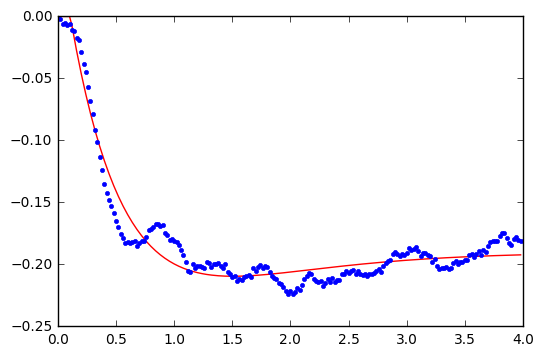

In [52]:
muscle = 'iii3_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.01]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [53]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

In [54]:
yaw_left_constants_df

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,0.017955,NaN,b1_l,yaw_right,0.743680,NaN,0.743680,NaN,0.640000
0,62.279463,-62.254944,b2_l,yaw_right,2.420538,2.416723,2.416723,2.420538,0.218224
0,63.891506,-63.849398,b3_l,yaw_right,0.996568,0.997686,0.997686,0.996568,0.073569
0,64.816546,-64.707000,i1_l,yaw_right,2.035542,2.052988,2.052988,2.035542,0.166045
0,62.561476,-62.542847,i2_l,yaw_right,2.355067,2.381646,2.381646,2.355067,0.084978
0,52.229396,-52.247833,iii1_l,yaw_right,2.764131,2.778165,2.778165,2.764131,0.221818
0,34.145746,-34.335927,iii3_l,yaw_right,0.653120,0.649966,0.649966,0.653120,0.106677


('K1 =', 0.12960843975762371, '+/-', 0.00063034337948421218)
('tau_1 =', 0.91617929461607961, '+/-', 0.00063034337948421218)
('theta =', 0.28167951947558456, '+/-', 0.018658979098288064)
muscle
hg1_l


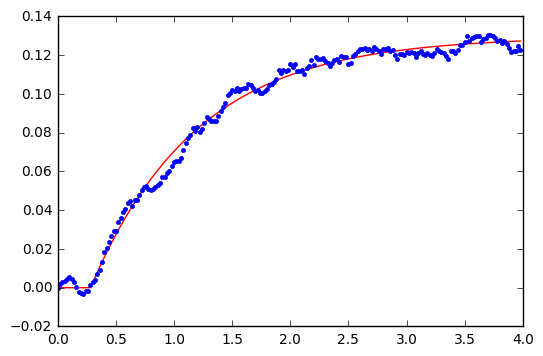

In [58]:
muscle = 'hg1_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 0.2)), max_nfev=2000000)
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.0]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [59]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

In [60]:
yaw_left_constants_df

,K1,K2,muscle,stimulus,tau1,tau2,tau_a,tau_i,theta
0,0.017955,NaN,b1_l,yaw_right,0.743680,NaN,0.743680,NaN,0.640000
0,62.279463,-62.254944,b2_l,yaw_right,2.420538,2.416723,2.416723,2.420538,0.218224
0,63.891506,-63.849398,b3_l,yaw_right,0.996568,0.997686,0.997686,0.996568,0.073569
0,64.816546,-64.707000,i1_l,yaw_right,2.035542,2.052988,2.052988,2.035542,0.166045
0,62.561476,-62.542847,i2_l,yaw_right,2.355067,2.381646,2.381646,2.355067,0.084978
0,52.229396,-52.247833,iii1_l,yaw_right,2.764131,2.778165,2.778165,2.764131,0.221818
0,34.145746,-34.335927,iii3_l,yaw_right,0.653120,0.649966,0.649966,0.653120,0.106677
0,0.129608,NaN,hg1_l,yaw_right,0.916179,NaN,0.916179,NaN,0.281680


('K1 =', 0.16027261252720715, '+/-', 0.0017974104854886904)
('tau_1 =', 2.3219599489659841, '+/-', 0.0017974104854886904)
('theta =', 0.13359469391447881, '+/-', 0.054255629389912192)
muscle
hg2_l


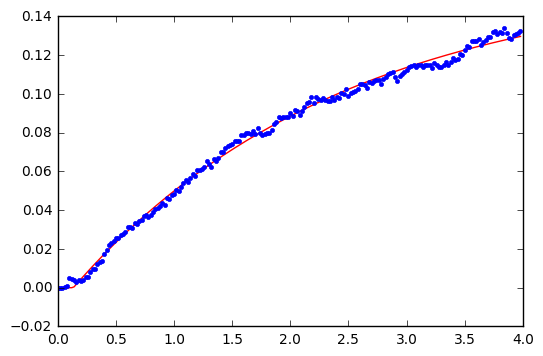

In [62]:
muscle = 'hg2_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 0.2)), max_nfev=2000000)
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.0]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [63]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

('K1 =', 1284.9322140252164, '+/-', 67179.283015296824)
('tau_1 =', 55254.652895617706, '+/-', 67179.283015296824)
('theta =', 0.23246807391603991, '+/-', 2888908.2447630516)
muscle
hg3_l


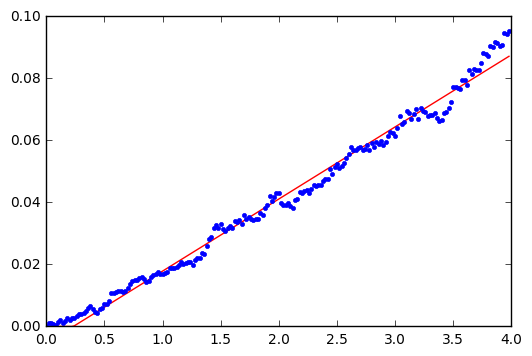

In [65]:
muscle = 'hg3_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 0.2)), max_nfev=2000000)
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.0]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [66]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

('K1 =', 3.1695293073381672, '+/-', 7922.434865136277)
('k2 =', -3.1683670286286265, '+/-', 7922.4290454610291)
('tau_1 =', 0.85742122542227717, '+/-', 7922.434865136277)
('tau_2 =', 0.87618022778331262, '+/-', 7922.4290454610291)
('theta =', 0.16748194887323867, '+/-', 7922.4290454610291)
muscle
hg4_l


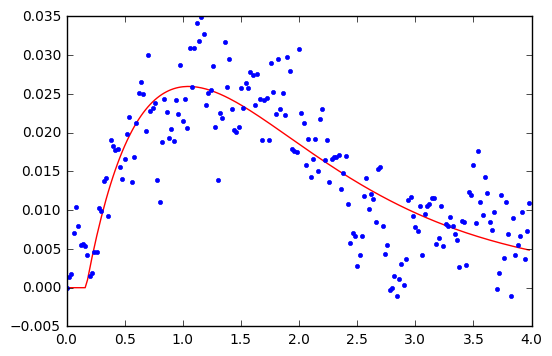

In [68]:
muscle = 'hg4_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)), max_nfev=2000000)
        
#popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([10.,-50,0.25,0.9, 0.01]), maxfev=2000000)
   
tau1 = popt[2]
tau2 = popt[3]

if tau1 > tau2:
    tau_i = tau1
    tau_a = tau2
if tau2 > tau1:
    tau_i = tau1
    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4], 'tau_a': tau_a, 'tau_i': tau_i }, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [69]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

('K1 =', -0.04844623822250519, '+/-', 0.010474744976325116)
('tau_1 =', 4.1530441861631839, '+/-', 0.010474744976325116)
('theta =', 0.53579759724858234, '+/-', 1.3286180502884202)
muscle
b1_r


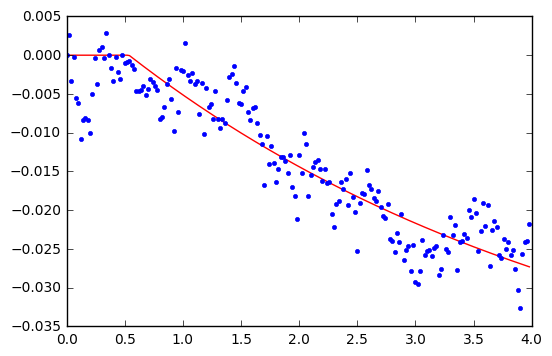

In [71]:
muscle = 'b1_r'


times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 0.2)), max_nfev=2000000)
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.0]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

In [73]:
yaw_left_constants_df = yaw_left_constants_df.append(df)

('K1 =', 1284.9322140252164, '+/-', 67179.283015296824)
('tau_1 =', 55254.652895617706, '+/-', 67179.283015296824)
('theta =', 0.23246807391603991, '+/-', 2888908.2447630516)
muscle
hg3_l


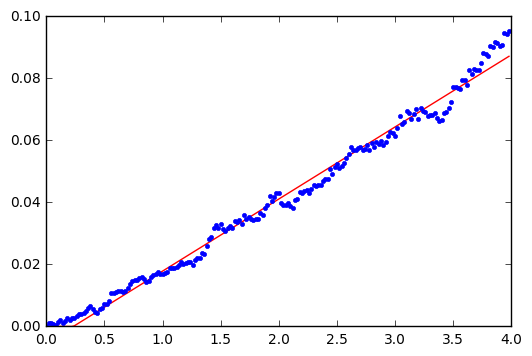

In [72]:
muscle = 'hg3_l'

times = np.arange(350)*0.02
colors = times[150:350]
x1 = times[150:350]
x=x1-x1[0]
muscle_choice = stimulus[muscle]
y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
#popt, pcov = curve_fit(exponential_f, x, y, bounds=((0, -150, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 0.2)), max_nfev=2000000)
        
popt, pcov = curve_fit(single_exponential_f, x, y, p0=np.asarray([0.1,0.25, 0.0]), maxfev=2000000)

tau1 = popt[1]
#tau2 = popt[3]

tau_a = tau1

#if tau1 > tau2:
#    tau_i = tau1
#    tau_a = tau2
#if tau2 > tau1:
#    tau_i = tau1
#    tau_a = tau2
        

df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0], 'tau1': popt[1], 'theta': popt[2], 'tau_a': tau_a}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
#df =pd.DataFrame({'stimulus': 'yaw_right','muscle': muscle,'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]}, index=[0])
#stimulus_df = stimulus_df.append(df)
        
print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
#print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
print("tau_1 =", popt[1], "+/-", pcov[0,0]**0.5)
#print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
print("theta =", popt[2], "+/-", pcov[1,1]**0.5)
print('muscle')
print(muscle)

#df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},index=[muscle])
#df =pd.DataFrame
    
plt.plot(x, single_exponential_f(x, popt[0], popt[1], popt[2]), 'r-')
plt.plot(x, y, '.')
plt.xlim(0, 4.0)
plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', 8.3937402839017246, '+/-', nan)
('k2 =', -8.4037620510487017, '+/-', nan)
('tau_1 =', 0.753670501891613, '+/-', nan)
('tau_2 =', 0.76011957202061142, '+/-', nan)
('theta =', 0.21217840802272567, '+/-', nan)
muscle
b1_l


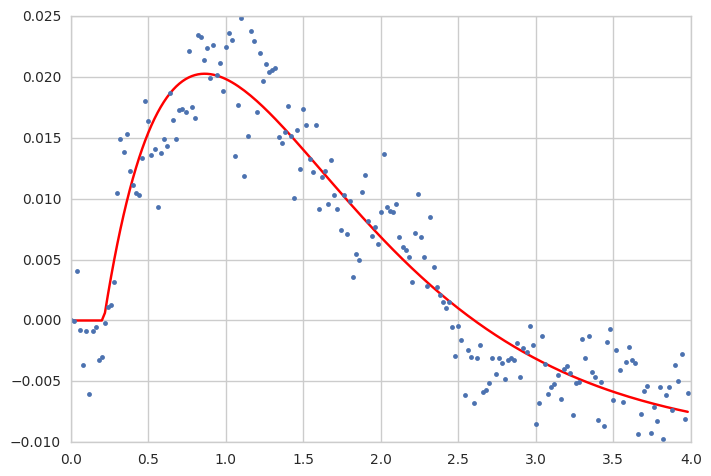

('K1 =', 0.17068196673987626, '+/-', 0.021324462295626706)
('k2 =', -368.8774623718345, '+/-', 129301.20788821501)
('tau_1 =', 1.158748245489003, '+/-', 0.021324462295626706)
('tau_2 =', 11568.767757194806, '+/-', 129301.20788821501)
('theta =', 0.44233735705525479, '+/-', 129301.20788821501)
muscle
b2_l


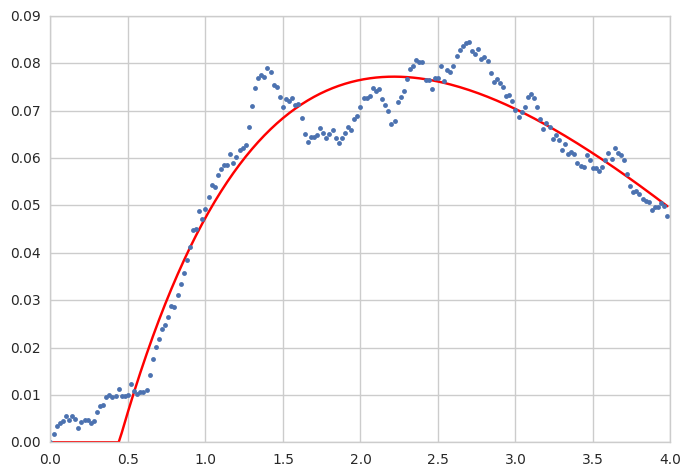

('K1 =', -0.16208037205787659, '+/-', 0.018240118387736079)
('k2 =', 0.1301329834082055, '+/-', 0.017818203714164333)
('tau_1 =', 0.18718212591970121, '+/-', 0.018240118387736079)
('tau_2 =', 0.62107139900212738, '+/-', 0.017818203714164333)
('theta =', 0.23155728726827021, '+/-', 0.017818203714164333)
muscle
b3_l


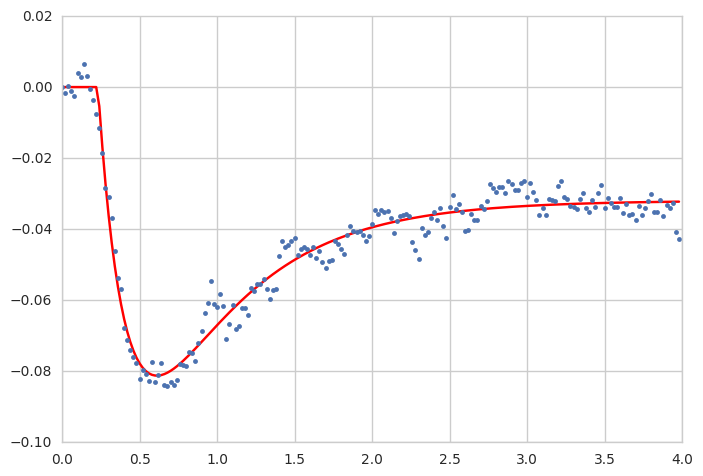

('K1 =', -12.996625470451047, '+/-', nan)
('k2 =', 13.008251221358554, '+/-', nan)
('tau_1 =', 0.2883482144954152, '+/-', nan)
('tau_2 =', 0.29019994109575498, '+/-', nan)
('theta =', 0.19323936425933841, '+/-', nan)
muscle
i1_l


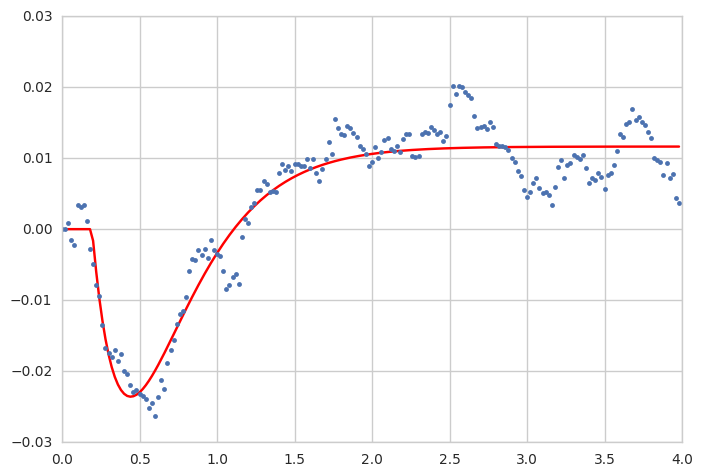

('K1 =', -1.6007619874975023, '+/-', 11937.353362661384)
('k2 =', 1.4917840866206036, '+/-', 11939.520406053467)
('tau_1 =', 4.600749640009842, '+/-', 11937.353362661384)
('tau_2 =', 4.2231171604877717, '+/-', 11939.520406053467)
('theta =', -0.50294873627758063, '+/-', 11939.520406053467)
muscle
i2_l


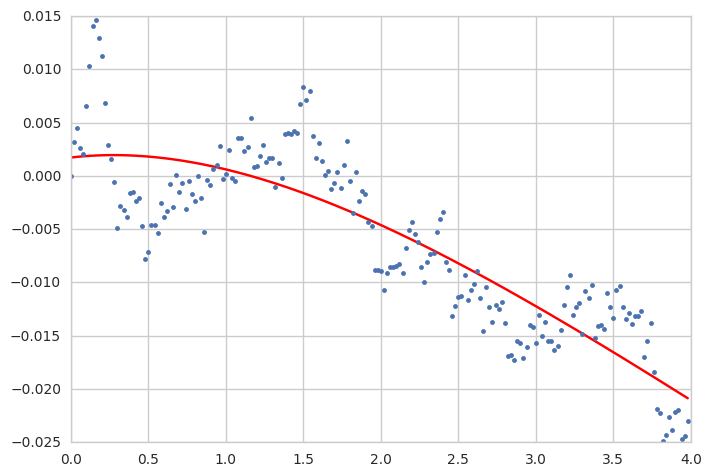

('K1 =', 0.078503762012372857, '+/-', 33749.566010584102)
('k2 =', 0.07311276188068333, '+/-', 33749.566202709939)
('tau_1 =', 0.74112180833612484, '+/-', 33749.566010584102)
('tau_2 =', 0.74108821989289031, '+/-', 33749.566202709939)
('theta =', 0.33076634509951658, '+/-', 33749.566202709939)
muscle
iii1_l


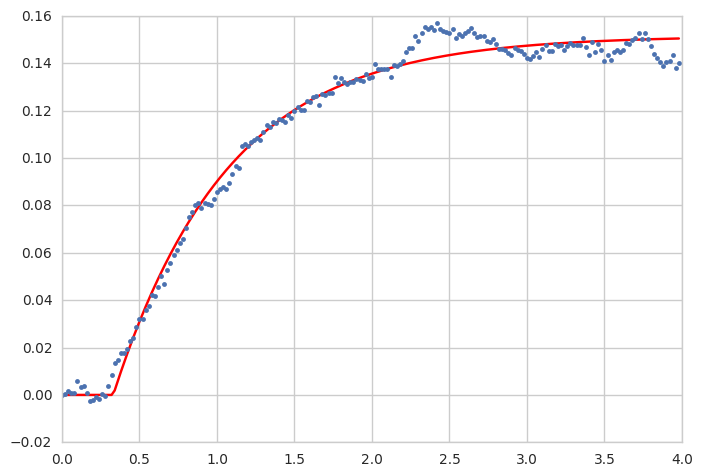

('K1 =', 0.11180905272729809, '+/-', 0.0025962321405768253)
('k2 =', 0.024023119430643884, '+/-', 0.0027485158188272235)
('tau_1 =', 0.61072769949486783, '+/-', 0.0025962321405768253)
('tau_2 =', 0.057691451499430273, '+/-', 0.0027485158188272235)
('theta =', 0.16957562964740075, '+/-', 0.0027485158188272235)
muscle
iii3_l


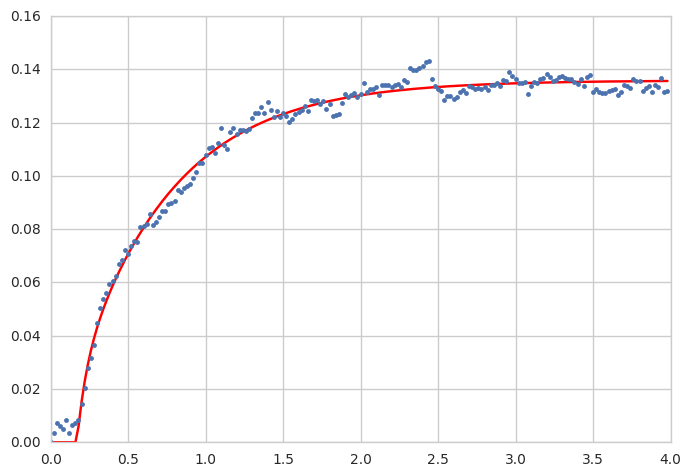

('K1 =', -2.1480305031732536, '+/-', 2274.5667007835445)
('k2 =', 2.1639204470249829, '+/-', 2274.5665096248595)
('tau_1 =', 0.31445572364611218, '+/-', 2274.5667007835445)
('tau_2 =', 0.32096345245018471, '+/-', 2274.5665096248595)
('theta =', 0.10833821322794163, '+/-', 2274.5665096248595)
muscle
hg1_l


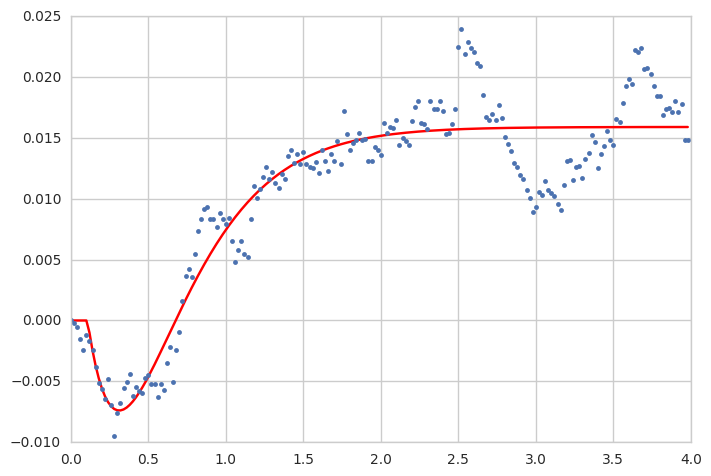

('K1 =', 6.1973728460814783, '+/-', 14188.888376852106)
('k2 =', -6.1663217890625042, '+/-', 14188.842328488681)
('tau_1 =', 2.1448614380317492, '+/-', 14188.888376852106)
('tau_2 =', 2.1983242906233711, '+/-', 14188.842328488681)
('theta =', 0.17657713474202796, '+/-', 14188.842328488681)
muscle
hg2_l


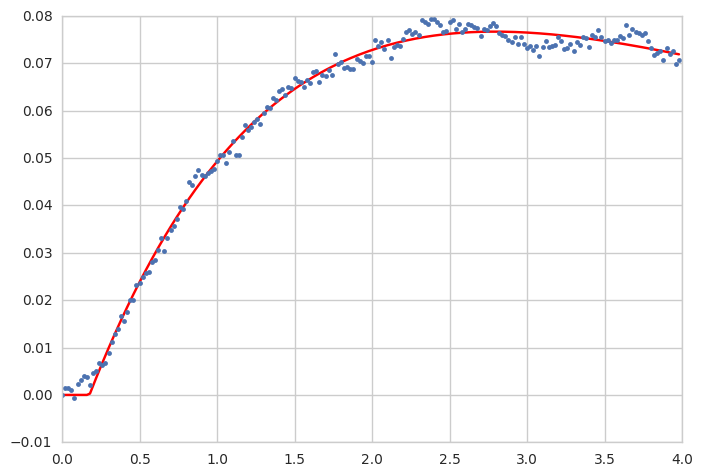

('K1 =', -0.0079027407088275992, '+/-', 0.0011611017356325955)
('k2 =', -38.103655965108246, '+/-', 29764.600946754304)
('tau_1 =', 0.71116880401645521, '+/-', 0.0011611017356325955)
('tau_2 =', 31318.723235874131, '+/-', 29764.600946754304)
('theta =', 0.021727428039319426, '+/-', 29764.600946754304)
muscle
hg3_l


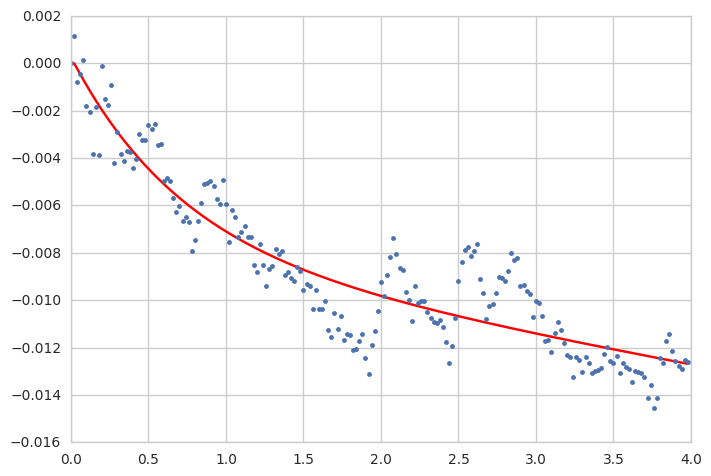

('K1 =', -0.023593206392898722, '+/-', 0.0014577230565685888)
('k2 =', -0.058491940083109553, '+/-', 0.012659162429602236)
('tau_1 =', 0.12655582748648034, '+/-', 0.0014577230565685888)
('tau_2 =', 4.909453047021211, '+/-', 0.012659162429602236)
('theta =', 0.13403646917759701, '+/-', 0.012659162429602236)
muscle
hg4_l


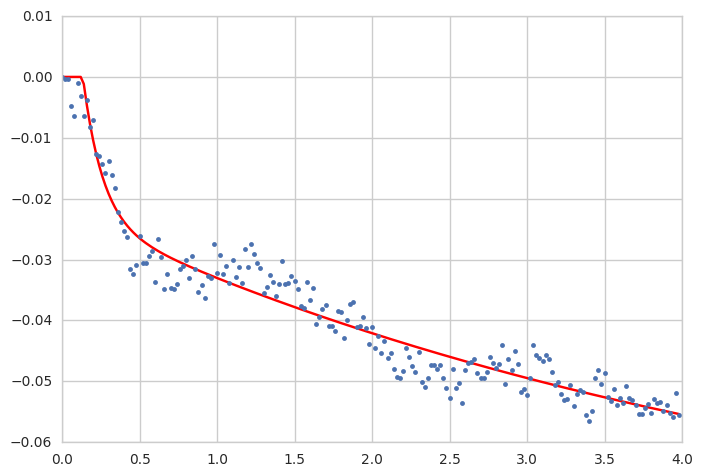

('K1 =', -8.6335841162418152, '+/-', 93420.212905435052)
('k2 =', 8.6447805046208046, '+/-', 93420.208656843693)
('tau_1 =', 0.86962233113227716, '+/-', 93420.212905435052)
('tau_2 =', 0.87743866214112931, '+/-', 93420.208656843693)
('theta =', -0.015138751821781817, '+/-', 93420.208656843693)
muscle
b1_r


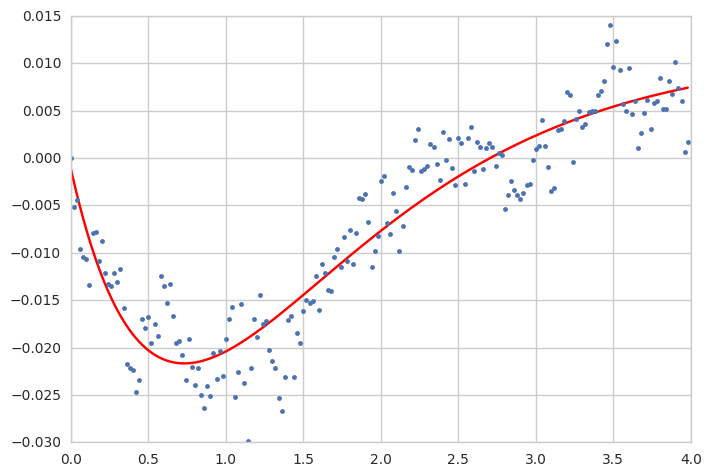

('K1 =', -0.019442046775248308, '+/-', 0.0106889977664377)
('k2 =', -0.012202448389915996, '+/-', 0.010814893017168807)
('tau_1 =', 0.5322720396333056, '+/-', 0.0106889977664377)
('tau_2 =', 0.2066326847659575, '+/-', 0.010814893017168807)
('theta =', 0.3688848096063983, '+/-', 0.010814893017168807)
muscle
b2_r


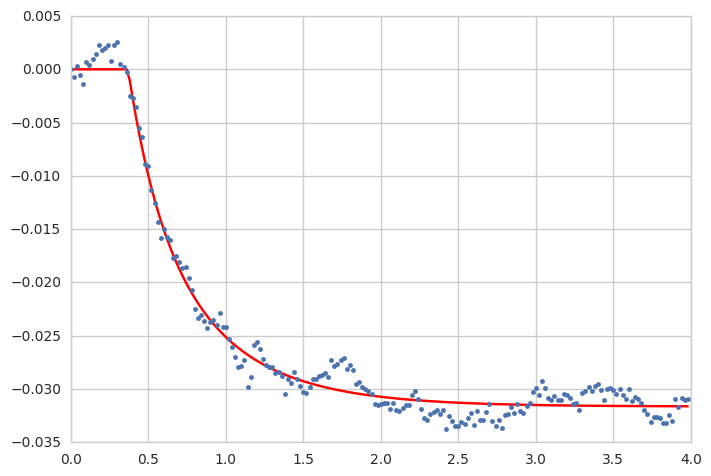

('K1 =', 0.11300974426795651, '+/-', 0.0086682737838054674)
('k2 =', -79.912180361516945, '+/-', 73367.343705968888)
('tau_1 =', 0.6633570815706229, '+/-', 0.0086682737838054674)
('tau_2 =', 7011.5425042379284, '+/-', 73367.343705968888)
('theta =', 0.14734059796676269, '+/-', 73367.343705968888)
muscle
b3_r


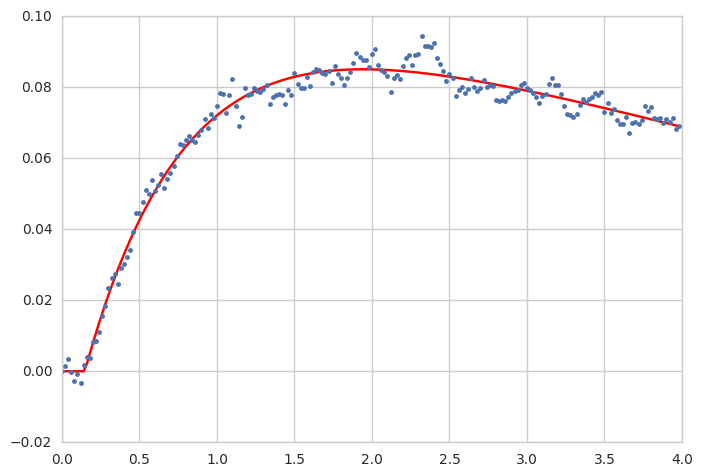

('K1 =', 0.14450281032510379, '+/-', 61020.95818322611)
('k2 =', 0.14970362788345731, '+/-', 61020.958317732897)
('tau_1 =', 0.37324161392334693, '+/-', 61020.95818322611)
('tau_2 =', 0.37322649056360552, '+/-', 61020.958317732897)
('theta =', 0.29256929871781545, '+/-', 61020.958317732897)
muscle
i1_r


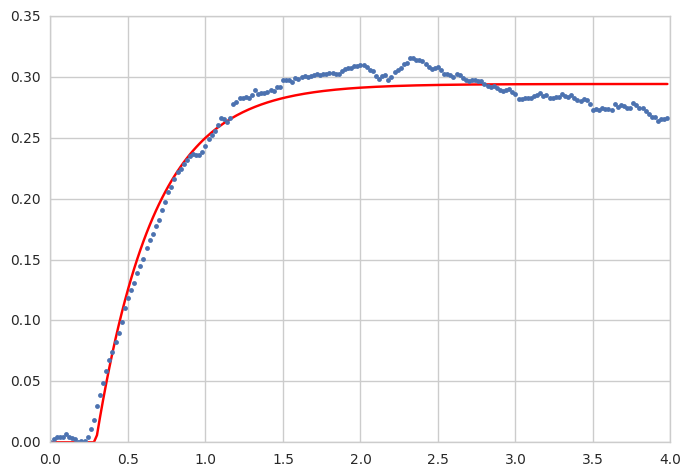

('K1 =', 37.235982324634442, '+/-', nan)
('k2 =', -36.94757574194989, '+/-', nan)
('tau_1 =', 0.63492970333027099, '+/-', nan)
('tau_2 =', 0.638495981702774, '+/-', nan)
('theta =', 0.21247718145777719, '+/-', nan)
muscle
i2_r


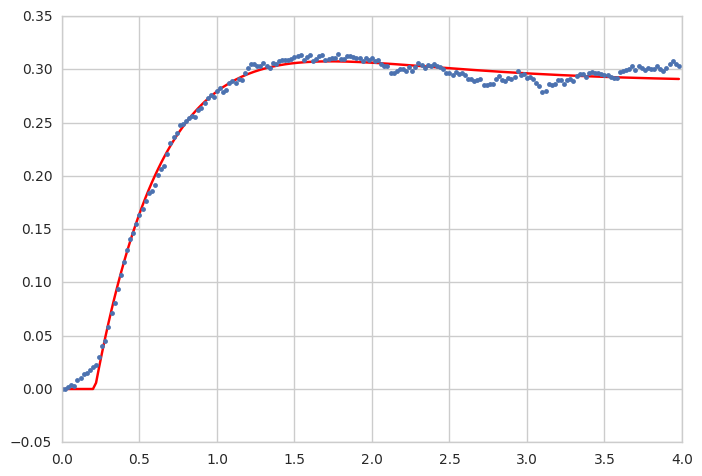

('K1 =', 8.4530900242863964, '+/-', 16109.443629499807)
('k2 =', -8.4403513600419675, '+/-', 16109.42532410027)
('tau_1 =', 1.4843312066496519, '+/-', 16109.443629499807)
('tau_2 =', 1.5130064398542837, '+/-', 16109.42532410027)
('theta =', 0.38924058100418707, '+/-', 16109.42532410027)
muscle
iii1_r


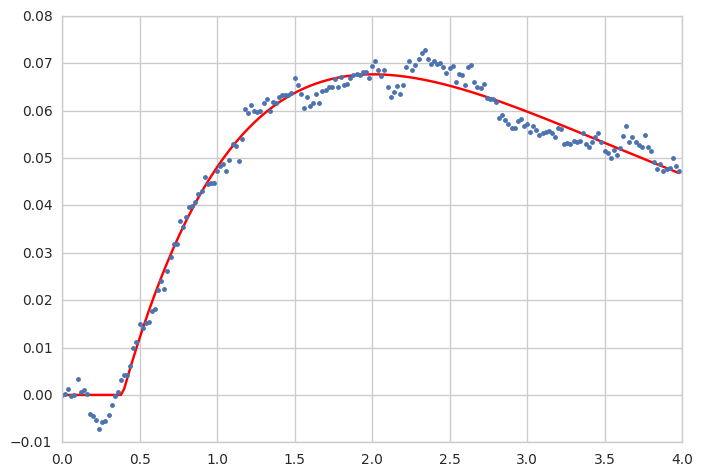

('K1 =', -0.16189999155609261, '+/-', 92911.691397051676)
('k2 =', -0.039867257726698205, '+/-', 92911.691117866256)
('tau_1 =', 0.19552232636992622, '+/-', 92911.691397051676)
('tau_2 =', 0.19555335036669075, '+/-', 92911.691117866256)
('theta =', 0.24962115279276206, '+/-', 92911.691117866256)
muscle
iii3_r


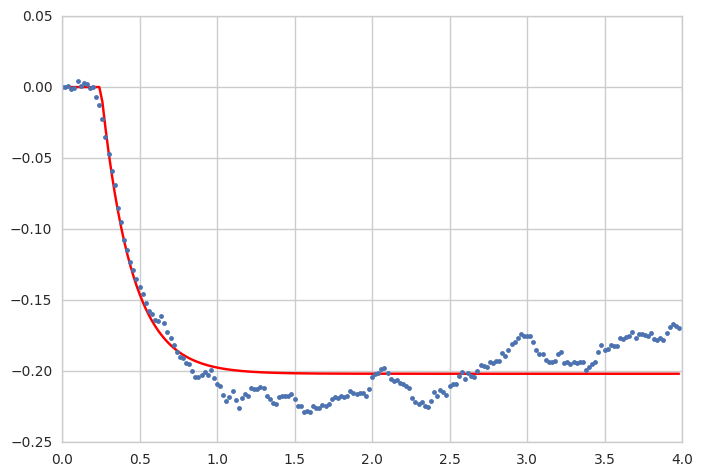

('K1 =', 0.082335532433121347, '+/-', 116265.06108366066)
('k2 =', 0.076823442996979657, '+/-', 116265.06007943508)
('tau_1 =', 0.36175775788836789, '+/-', 116265.06108366066)
('tau_2 =', 0.3617496032131271, '+/-', 116265.06007943508)
('theta =', 0.37407668657198467, '+/-', 116265.06007943508)
muscle
hg1_r


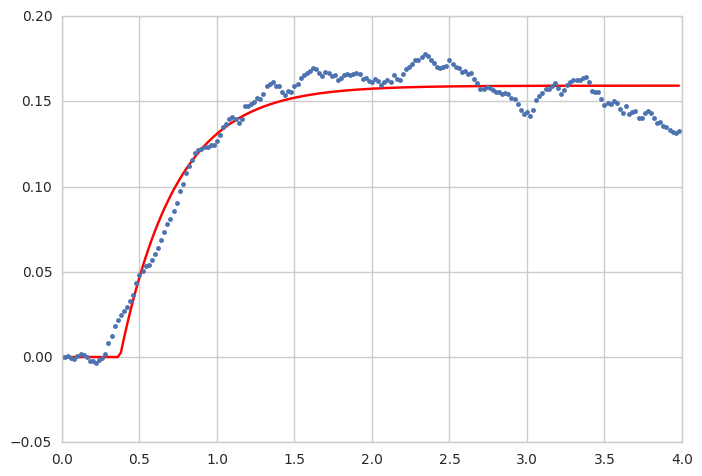

('K1 =', 0.15128262585453833, '+/-', 0.0059962339663359029)
('k2 =', 48.047075722162326, '+/-', 80732.786514692154)
('tau_1 =', 0.5298674140687436, '+/-', 0.0059962339663359029)
('tau_2 =', 7883.0209183929528, '+/-', 80732.786514692154)
('theta =', 0.25558512679295364, '+/-', 80732.786514692154)
muscle
hg2_r


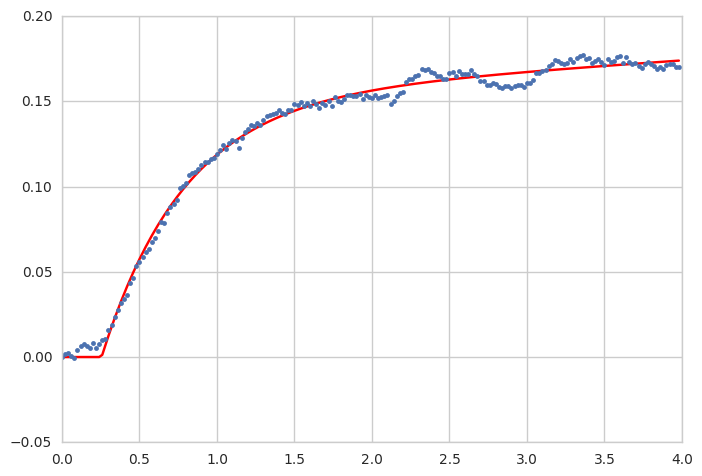

('K1 =', 0.0069572635435210259, '+/-', 0.001530318826349755)
('k2 =', 0.16216894923480438, '+/-', 0.014982465078237351)
('tau_1 =', 0.10585183450398446, '+/-', 0.001530318826349755)
('tau_2 =', 5.0774228946930133, '+/-', 0.014982465078237351)
('theta =', 0.17880744071878923, '+/-', 0.014982465078237351)
muscle
hg3_r


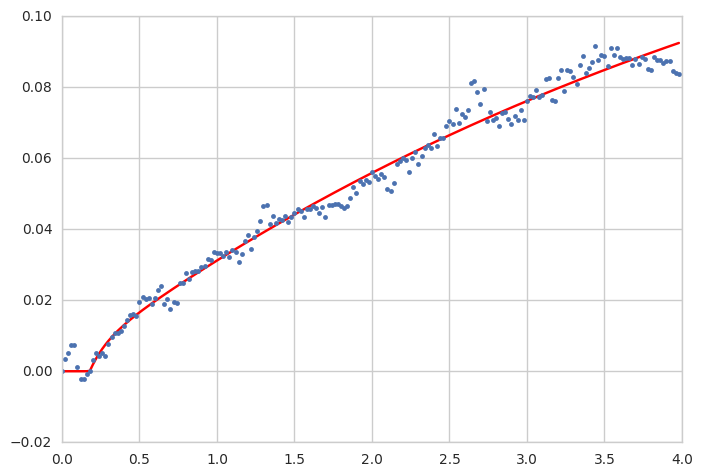

('K1 =', 0.074509709127995039, '+/-', 17294.622188460206)
('k2 =', 0.0087130120787416165, '+/-', 17294.622205088253)
('tau_1 =', 0.2398062950720507, '+/-', 17294.622188460206)
('tau_2 =', 0.23981441219238486, '+/-', 17294.622205088253)
('theta =', 0.19857217739640298, '+/-', 17294.622205088253)
muscle
hg4_r


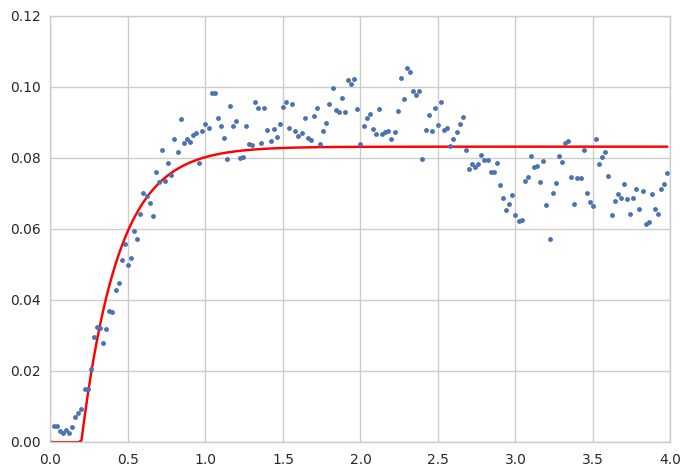

In [222]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
       
        
        #popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), bounds=((0, -np.inf, -np.inf, -np.inf, 0), (np.inf, 0, np.inf, np.inf, 1)))#, maxfev=2000000)
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
#stimulus_df.to_csv('yaw_right_constants_theta.csv') 

b1_l
b2_l
b3_l
i1_l
i2_l
iii1_l
iii3_l
hg1_l
hg2_l
hg3_l
hg4_l
b1_r
b2_r
b3_r
i1_r
i2_r
iii1_r
iii3_r
hg1_r
hg2_r
hg3_r
hg4_r


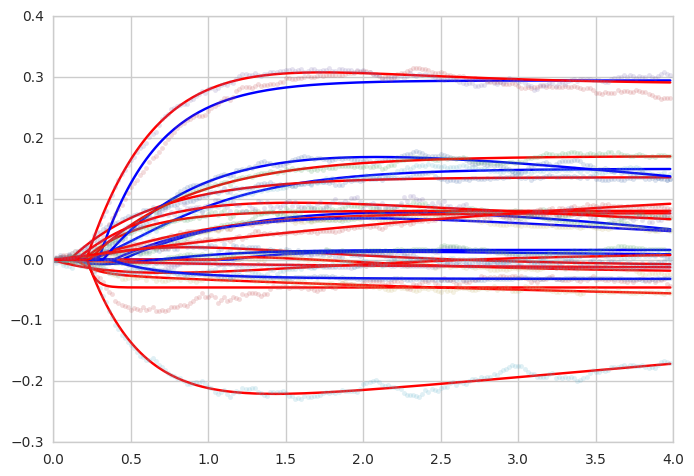

In [175]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 4.0)
plt.show()

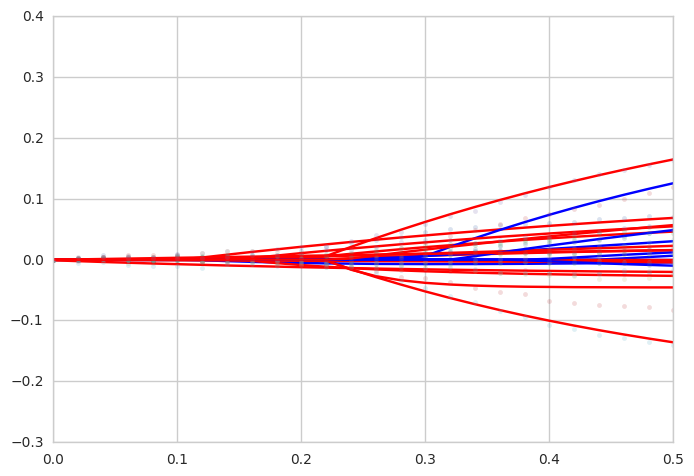

In [176]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 0.5)
plt.show()



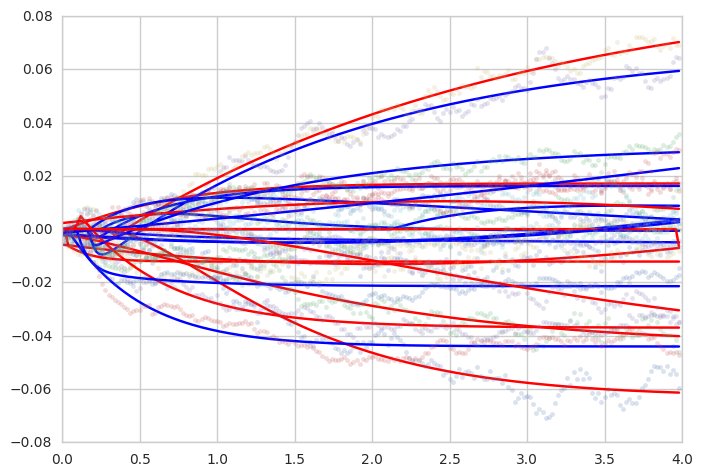

In [191]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
#muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = roll_ccw_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter])
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 4.0)
plt.show()

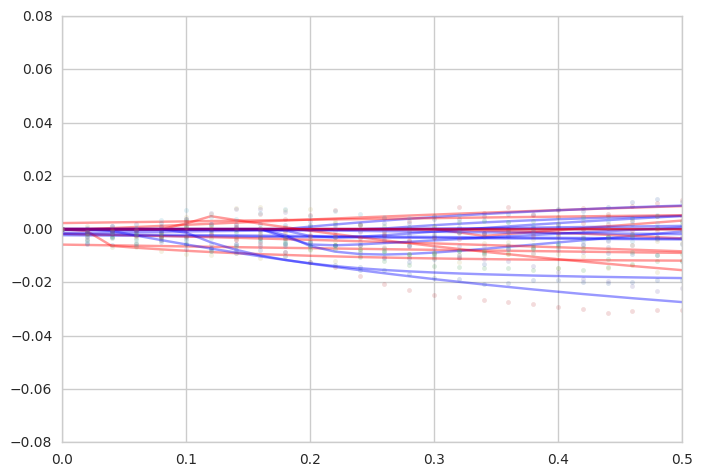

In [192]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R')


#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = roll_ccw_df
counter = 0
for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        


        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), color = muscle_assign[counter], alpha = 0.4)
        plt.plot(x, y, '.', alpha = 0.2)
        counter = counter + 1
        
        
plt.xlim(0, 0.5)
plt.show()



In [ ]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_right_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_ = stimulus_df.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df.to_csv('yaw_right_constants_theta.csv') 

('K1 =', -3.0773145330734111, '+/-', 13078.39631356819)
('k2 =', -3.0950395748068655, '+/-', 13078.395843952143)
('tau_1 =', 0.49805089623186083, '+/-', 13078.39631356819)
('tau_2 =', 0.5037332803651452, '+/-', 13078.395843952143)
('theta =', -0.078544340810191779, '+/-', 13078.395843952143)
muscle
b1_l


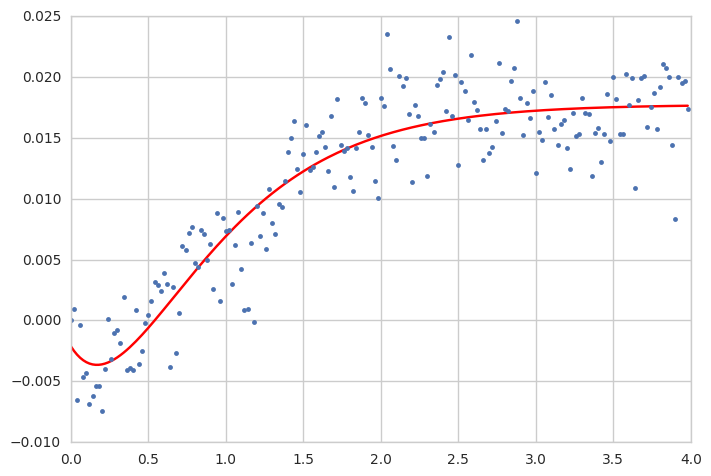

('K1 =', -0.049572692761615189, '+/-', 0.040059100890859227)
('k2 =', -20.704688529262572, '+/-', 19020.374288814324)
('tau_1 =', 1.2089716156942996, '+/-', 0.040059100890859227)
('tau_2 =', 2247.7938558262831, '+/-', 19020.374288814324)
('theta =', 0.22856163682269176, '+/-', 19020.374288814324)
muscle
b2_l


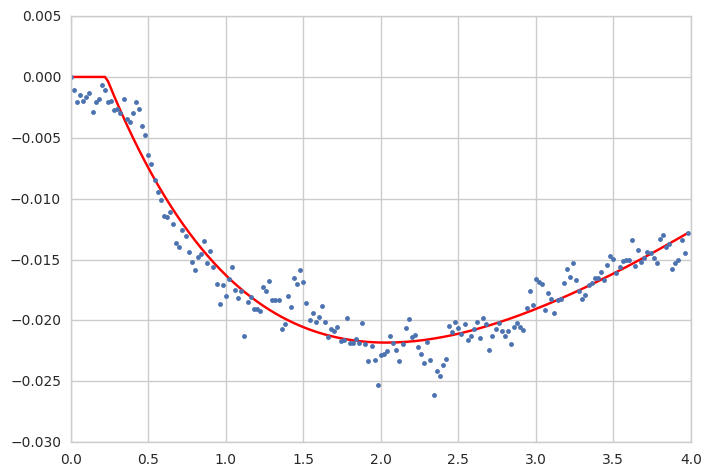

('K1 =', 0.068075883288386291, '+/-', 0.0032261335036049906)
('k2 =', 65.779084741295165, '+/-', 82447.990162247865)
('tau_1 =', 0.50205488375435914, '+/-', 0.0032261335036049906)
('tau_2 =', 11631.013638950906, '+/-', 82447.990162247865)
('theta =', 0.091428246714770331, '+/-', 82447.990162247865)
muscle
b3_l


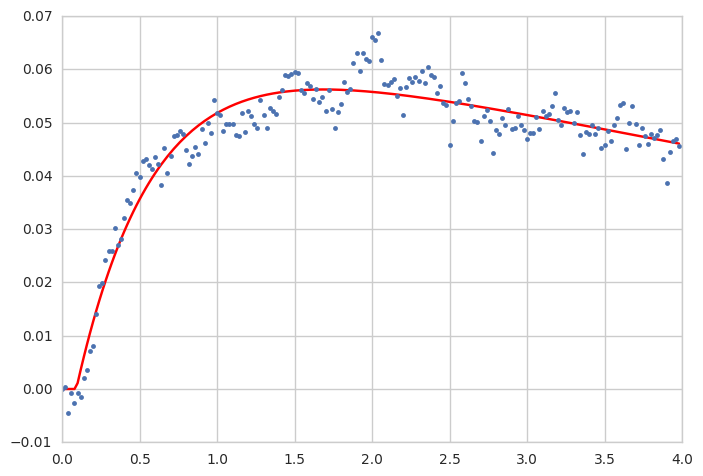

('K1 =', 0.44653163357226677, '+/-', 0.17268392377396044)
('k2 =', 33.783091049302385, '+/-', 8718.2458665130725)
('tau_1 =', 1.1778508395353997, '+/-', 0.17268392377396044)
('tau_2 =', 722.63168368434015, '+/-', 8718.2458665130725)
('theta =', 0.1704889538588332, '+/-', 8718.2458665130725)
muscle
i1_l


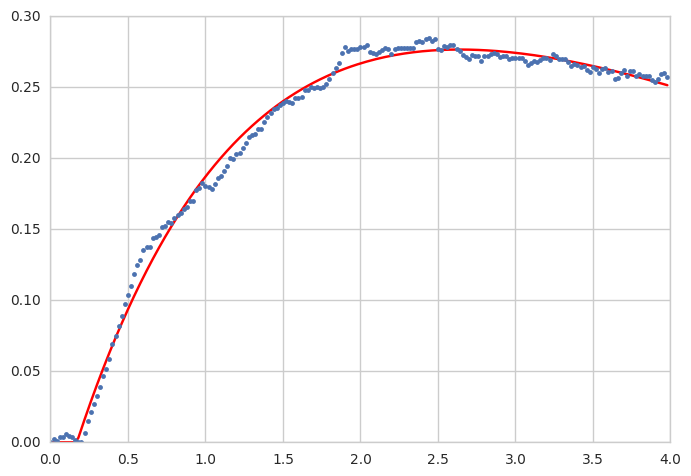

('K1 =', 0.48400175703692105, '+/-', 0.03847788535991653)
('k2 =', 430.68876595427537, '+/-', 156213.20955693536)
('tau_1 =', 1.3063662331829726, '+/-', 0.03847788535991653)
('tau_2 =', 7544.21984527938, '+/-', 156213.20955693536)
('theta =', 0.09108264549358569, '+/-', 156213.20955693536)
muscle
i2_l


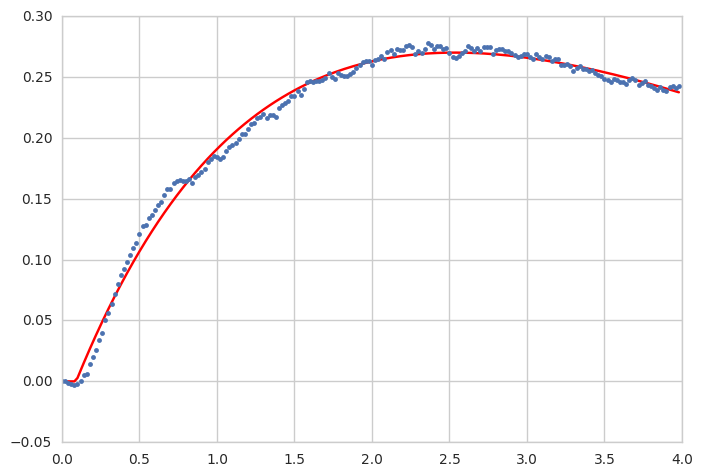

('K1 =', -8.8320634372715077, '+/-', nan)
('k2 =', -8.9172655936598506, '+/-', nan)
('tau_1 =', 0.465406207900882, '+/-', nan)
('tau_2 =', 0.46816626409507583, '+/-', nan)
('theta =', 0.21431242469193829, '+/-', nan)
muscle
iii1_l


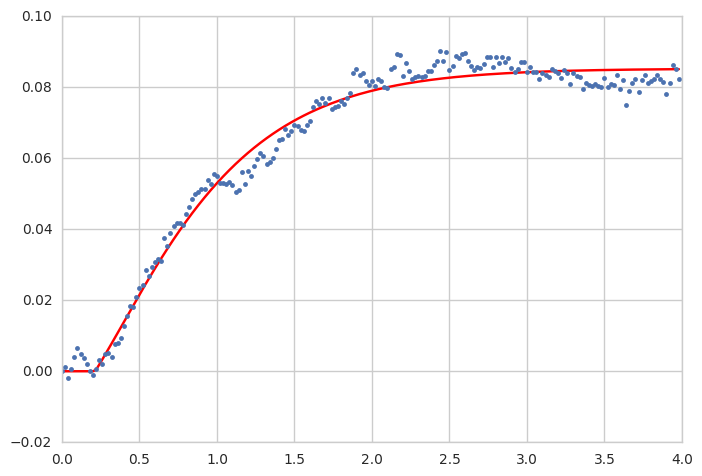

('K1 =', 0.0017843889555713777, '+/-', 2044.2460171057126)
('k2 =', 0.20211135299841618, '+/-', 2044.2460796871565)
('tau_1 =', 0.22586659487391536, '+/-', 2044.2460171057126)
('tau_2 =', 0.22579799190059124, '+/-', 2044.2460796871565)
('theta =', 0.16912020494437549, '+/-', 2044.2460796871565)
muscle
iii3_l


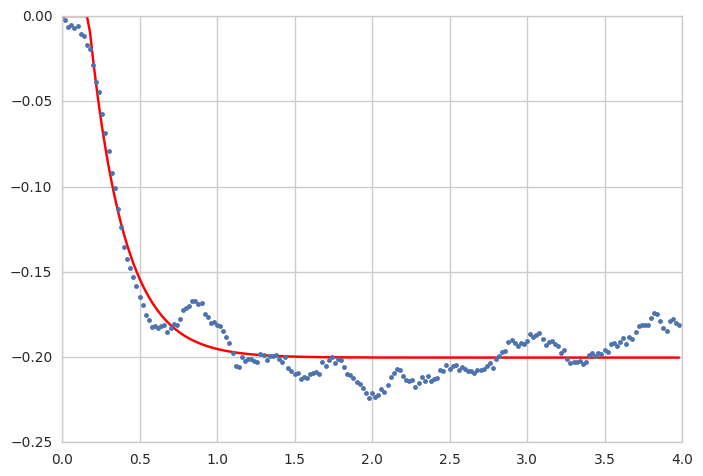

('K1 =', -0.044971864002936041, '+/-', 0.019831682647170033)
('k2 =', -0.17316822025638418, '+/-', 0.019504487431907962)
('tau_1 =', 0.17960710918417572, '+/-', 0.019831682647170033)
('tau_2 =', 0.83259234671967508, '+/-', 0.019504487431907962)
('theta =', 0.10000022709421376, '+/-', 0.019504487431907962)
muscle
hg1_l


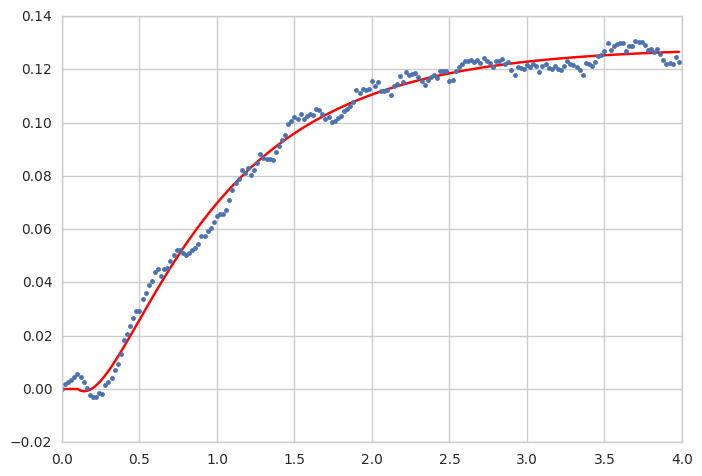

('K1 =', 181.94257502556241, '+/-', 52720.615097265116)
('k2 =', -0.079491610027041096, '+/-', 0.0075407774480216903)
('tau_1 =', 12412.808322127086, '+/-', 52720.615097265116)
('tau_2 =', 1.2340335822416058, '+/-', 0.0075407774480216903)
('theta =', 0.17331631445307946, '+/-', 0.0075407774480216903)
muscle
hg2_l


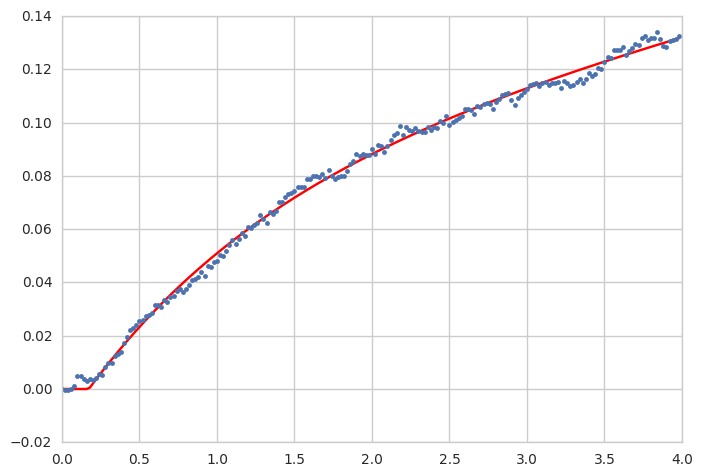

('K1 =', 222.39245802840023, '+/-', 11534.112527082572)
('k2 =', 65.657282852681277, '+/-', 19345.364839142123)
('tau_1 =', 397.04501305252722, '+/-', 11534.112527082572)
('tau_2 =', 120.87407882972168, '+/-', 19345.364839142123)
('theta =', 0.028239186458716245, '+/-', 19345.364839142123)
muscle
hg3_l


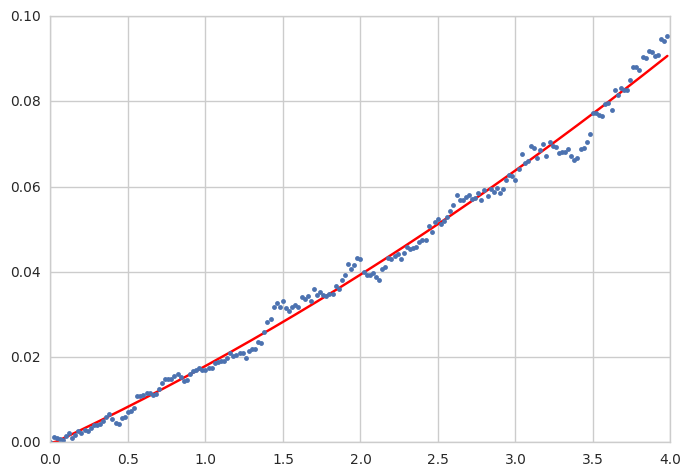

('K1 =', 7.3220601339314424, '+/-', 191921.83540600937)
('k2 =', 7.3211613538907505, '+/-', 191921.82306505539)
('tau_1 =', 0.87789183432289597, '+/-', 191921.83540600937)
('tau_2 =', 0.88617271204660697, '+/-', 191921.82306505539)
('theta =', 0.15657367330239788, '+/-', 191921.82306505539)
muscle
hg4_l


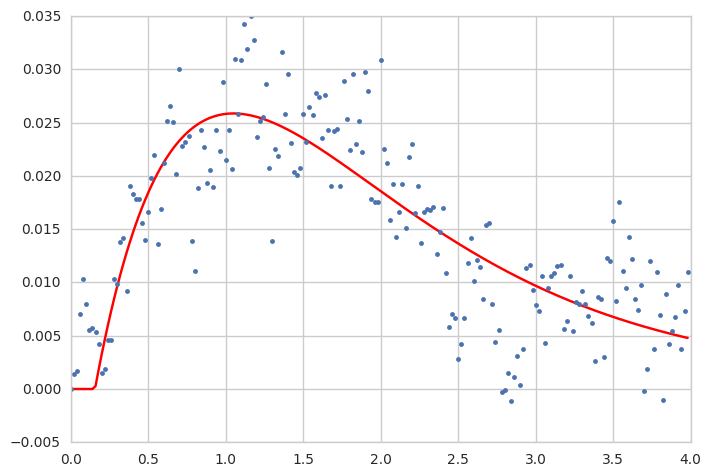

('K1 =', 0.20813711496920567, '+/-', 30.95138230921717)
('k2 =', 0.23940677130642776, '+/-', 30.940978247057171)
('tau_1 =', 1.0206464453120603, '+/-', 30.95138230921717)
('tau_2 =', 1.1738595865502655, '+/-', 30.940978247057171)
('theta =', 0.28616577493043432, '+/-', 30.940978247057171)
muscle
b1_r


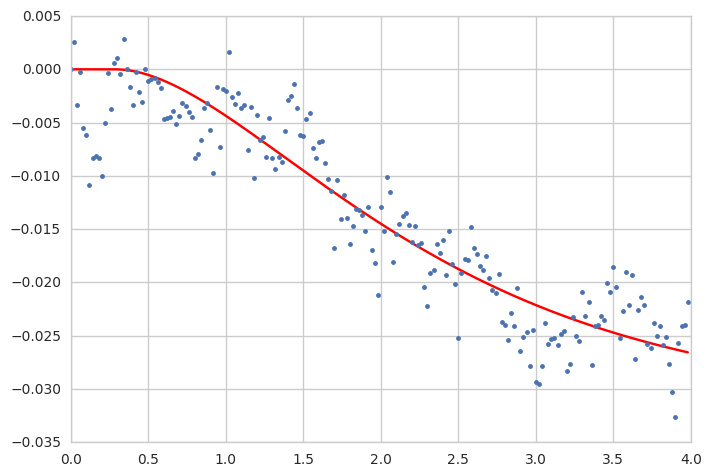

('K1 =', 6.3423706165592266, '+/-', 17424.183618190844)
('k2 =', 6.3271184364544428, '+/-', 17424.17215122679)
('tau_1 =', 1.342962490042626, '+/-', 17424.183618190844)
('tau_2 =', 1.3652989036053029, '+/-', 17424.17215122679)
('theta =', 0.40009689492375444, '+/-', 17424.17215122679)
muscle
b2_r


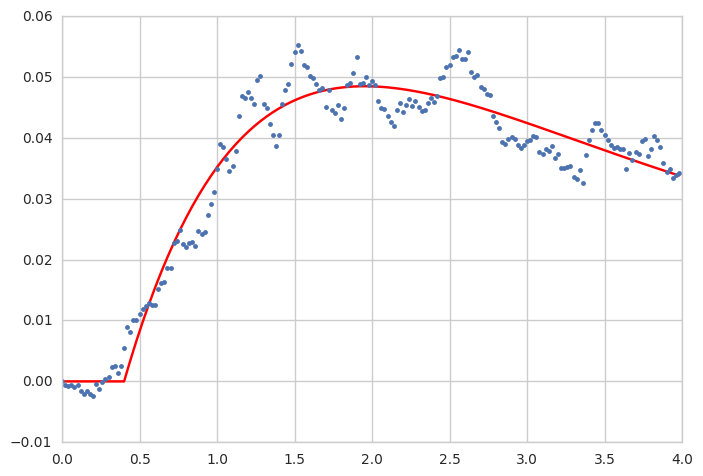

('K1 =', 0.078170776325817037, '+/-', 0.0068574595069969399)
('k2 =', 0.068191516869889335, '+/-', 0.0020559470848203793)
('tau_1 =', 3.3880028373214301, '+/-', 0.0068574595069969399)
('tau_2 =', 0.12537869960088024, '+/-', 0.0020559470848203793)
('theta =', 0.17340502860338872, '+/-', 0.0020559470848203793)
muscle
b3_r


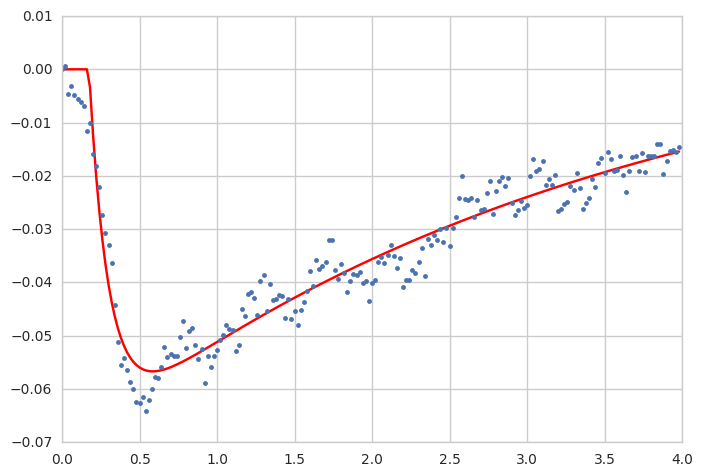

('K1 =', -0.018818835938754639, '+/-', 29532.419371996864)
('k2 =', -0.054709015958237989, '+/-', 29532.419269808353)
('tau_1 =', 0.00055924050631735861, '+/-', 29532.419371996864)
('tau_2 =', 1.2954059344853794, '+/-', 29532.419269808353)
('theta =', 0.39692931389540392, '+/-', 29532.419269808353)
muscle
i1_r


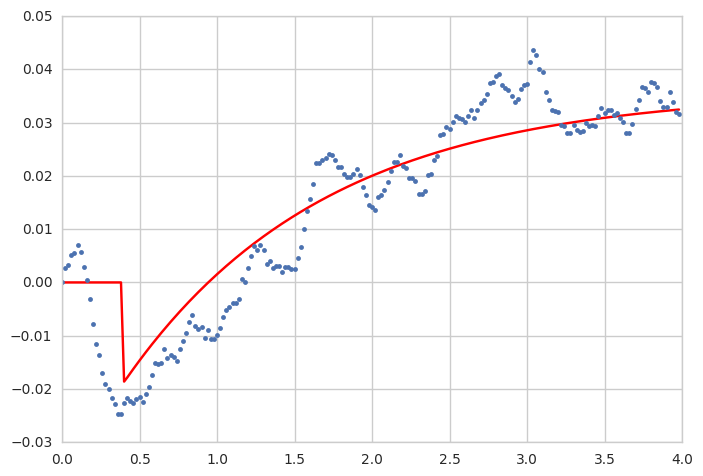

('K1 =', -14.271741561559969, '+/-', 21071.260745870946)
('k2 =', -14.384530932674613, '+/-', 21071.260530679505)
('tau_1 =', 0.58877403051874122, '+/-', 21071.260745870946)
('tau_2 =', 0.592514978617804, '+/-', 21071.260530679505)
('theta =', 0.28118221829218781, '+/-', 21071.260530679505)
muscle
i2_r


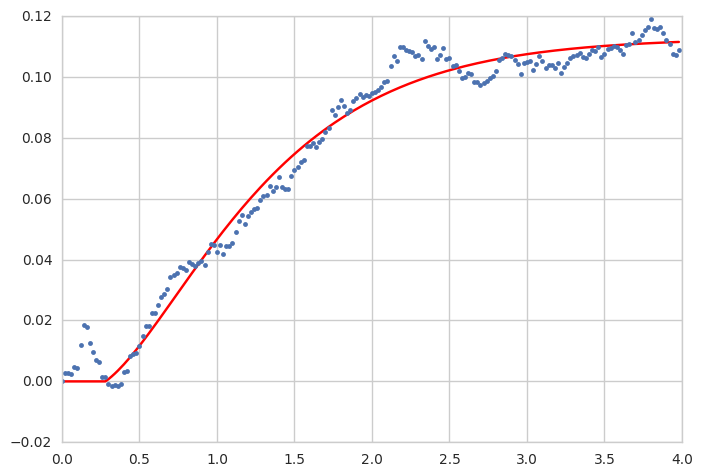

('K1 =', 0.076268917197894998, '+/-', 25528.241786789004)
('k2 =', -0.026038378900830807, '+/-', 25528.241630060911)
('tau_1 =', 1.1662816151389854, '+/-', 25528.241786789004)
('tau_2 =', 1.1662721258718005, '+/-', 25528.241630060911)
('theta =', 0.2995907804095635, '+/-', 25528.241630060911)
muscle
iii1_r


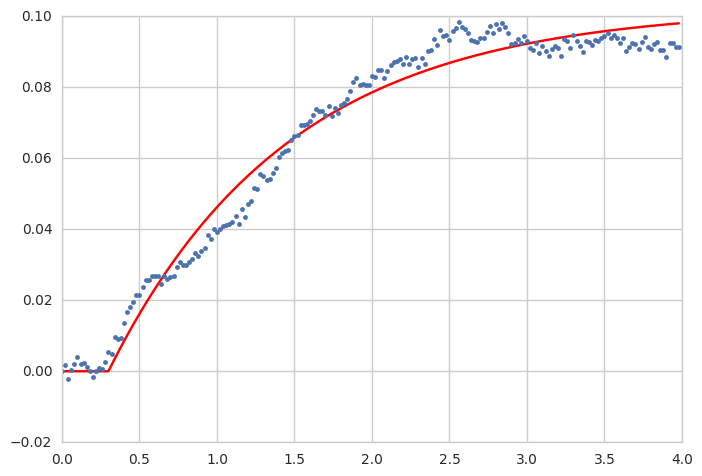

('K1 =', 0.038797097456065285, '+/-', 0.001426111960807955)
('k2 =', -0.054870843190895566, '+/-', 0.0010346082103830359)
('tau_1 =', 0.075742660394223962, '+/-', 0.001426111960807955)
('tau_2 =', 1.3835440747949013, '+/-', 0.0010346082103830359)
('theta =', 0.17371834528584021, '+/-', 0.0010346082103830359)
muscle
iii3_r


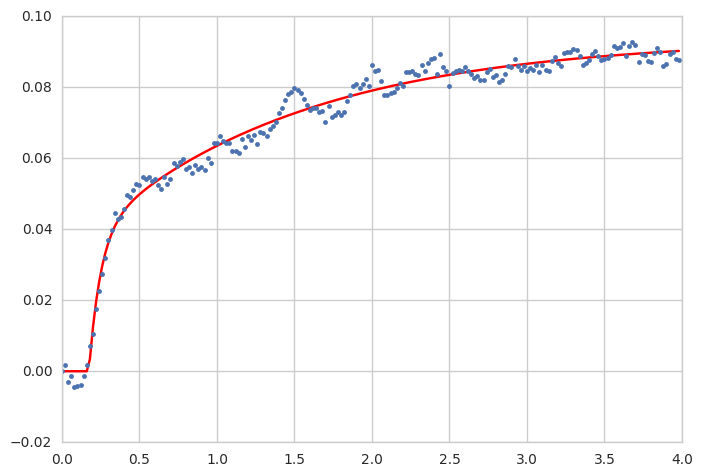

('K1 =', -0.026739281199793932, '+/-', 0.0058589453387145746)
('k2 =', -0.075377540532318668, '+/-', 0.0049009670293613857)
('tau_1 =', 0.20388193101489088, '+/-', 0.0058589453387145746)
('tau_2 =', 1.3006058594912451, '+/-', 0.0049009670293613857)
('theta =', 0.14000025256739432, '+/-', 0.0049009670293613857)
muscle
hg1_r


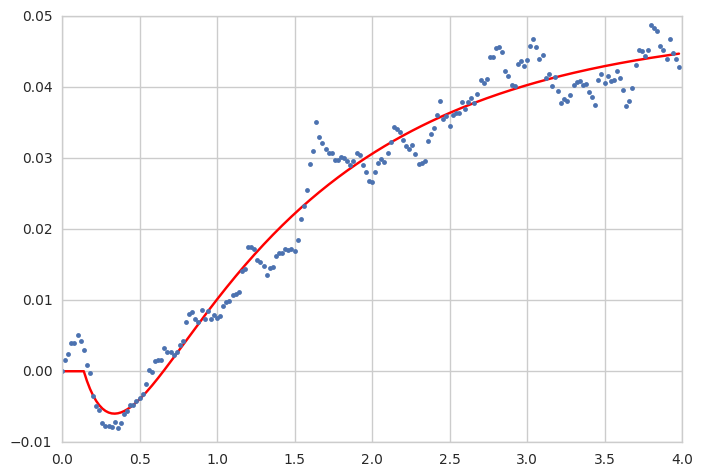

('K1 =', 23.15301578637802, '+/-', 34402.78704810061)
('k2 =', 45.973558019156769, '+/-', 25833.312981143972)
('tau_1 =', 23.014856062703444, '+/-', 34402.78704810061)
('tau_2 =', 48.924160510485358, '+/-', 25833.312981143972)
('theta =', 0.29051728689673323, '+/-', 25833.312981143972)
muscle
hg2_r


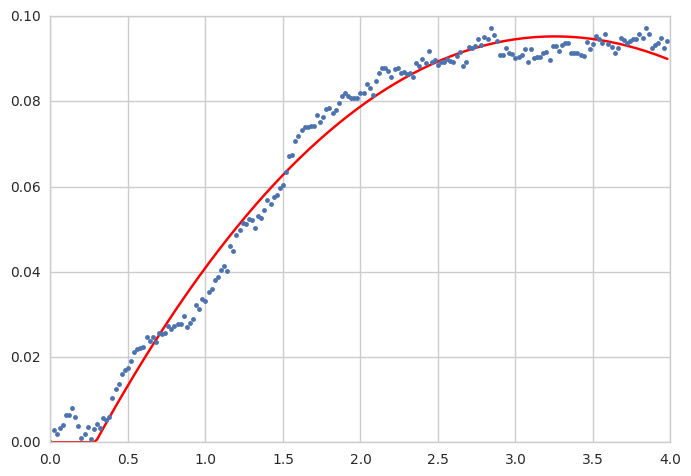

('K1 =', -0.0048486149738530097, '+/-', 0.0017441678228441307)
('k2 =', 0.010631962001096036, '+/-', 0.00094775114764195751)
('tau_1 =', 0.22824333294391841, '+/-', 0.0017441678228441307)
('tau_2 =', 1.7873199923792411, '+/-', 0.00094775114764195751)
('theta =', 0.13391184987396071, '+/-', 0.00094775114764195751)
muscle
hg3_r


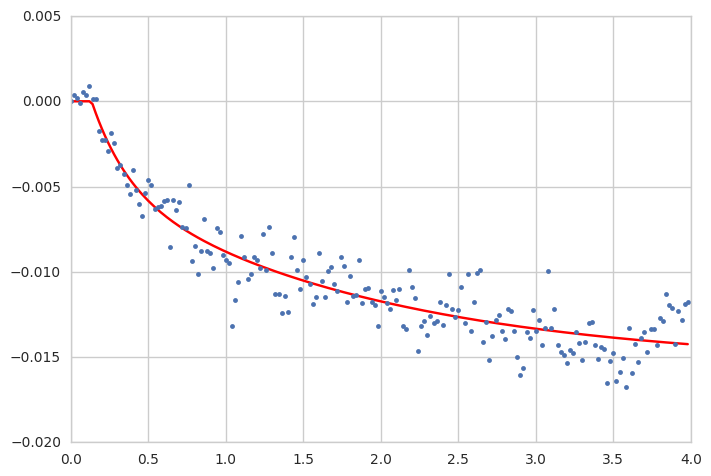

('K1 =', -0.026528054739176653, '+/-', 0.00035947260893897986)
('k2 =', 530.57908348324372, '+/-', 46827.607258720083)
('tau_1 =', 0.077421827457545361, '+/-', 0.00035947260893897986)
('tau_2 =', 42006.929193434524, '+/-', 46827.607258720083)
('theta =', 0.1972214701896548, '+/-', 46827.607258720083)
muscle
hg4_r


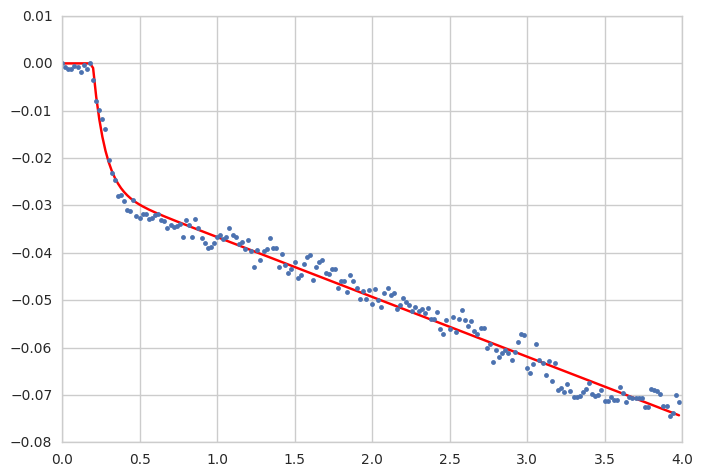

In [163]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_yl = pd.DataFrame()
stimulus = yaw_left_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_yl = stimulus_df_yl.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_yl.to_csv('yaw_left_constants_theta.csv') 

In [200]:
stimulus_df_yl

,K1,K2,tau1,tau2,theta
b1_l,-3.077315,-3.095040,0.498051,0.503733,-0.078544
b2_l,-0.049573,-20.704689,1.208972,2247.793856,0.228562
b3_l,0.068076,65.779085,0.502055,11631.013639,0.091428
i1_l,0.446532,33.783091,1.177851,722.631684,0.170489
i2_l,0.484002,430.688766,1.306366,7544.219845,0.091083
iii1_l,-8.832063,-8.917266,0.465406,0.468166,0.214312
iii3_l,0.001784,0.202111,0.225867,0.225798,0.169120
hg1_l,-0.044972,-0.173168,0.179607,0.832592,0.100000
hg2_l,181.942575,-0.079492,12412.808322,1.234034,0.173316
hg3_l,222.392458,65.657283,397.045013,120.874079,0.028239


In [199]:
stimulus_df

,K1,K2,tau1,tau2,theta
b1_l,8.424806,8.434828,0.753682,0.760107,0.212179
b2_l,0.170711,160.826793,1.158846,5041.718268,0.442338
b3_l,-0.026696,0.019087,0.044556,0.044546,0.219965
i1_l,0.566275,0.559610,0.776558,0.808586,1.146668
i2_l,0.014516,0.036724,0.210813,1.320813,1.055320
iii1_l,-0.485640,-0.634675,0.401932,0.489585,0.240000
iii3_l,-0.002948,-0.138132,0.558165,0.558111,0.105494
hg1_l,-1.910955,-1.926845,0.314055,0.321367,0.108340
hg2_l,-0.652496,-0.728606,0.404092,0.451044,0.036135
hg3_l,-0.006678,0.010464,0.668915,4.802201,0.020000


In [195]:
stimulus_df_pu

,K1,K2,tau1,tau2,theta
b1_l,0.424308,0.404592,0.233699,0.253110,0.173951
b2_l,1.054751,0.764656,1.852424,1.343210,1.286080
b3_l,0.206993,0.247497,0.153561,0.182902,0.184051
i1_l,0.207337,0.133497,2.084879,0.460664,0.146573
i2_l,1.054843,0.940477,0.455006,0.405856,0.620510
iii1_l,0.180375,0.047160,11.876753,1.068110,0.079996
iii3_l,11.873495,4.655783,206.460419,80.959236,-6.884669
hg1_l,346.977709,0.041208,24945.163625,0.250923,0.133616
hg2_l,0.101903,0.002806,3.061600,0.091037,0.328985
hg3_l,-0.009725,-0.026862,0.174796,2.737080,-0.020392


In [196]:
stimulus_df_pd

,K1,K2,tau1,tau2,theta
b1_l,5.060809,5.002644,2.299089,2.237496,0.058026
b2_l,12.003161,4.817870,220.777556,88.618179,-5.755229
b3_l,1.101267,1.062428,3.301886,3.074006,0.627064
i1_l,0.009555,0.052191,0.146163,0.146251,0.157471
i2_l,0.207781,0.105809,4.655735,1.804708,0.220000
iii1_l,0.087751,0.102967,0.614947,0.614974,0.827489
iii3_l,0.163672,0.167558,0.334648,0.709582,0.107023
hg1_l,0.014170,0.045350,12.288919,0.224406,0.120000
hg2_l,1.031423,1.023278,0.651119,0.659487,0.442285
hg3_l,0.016375,0.003467,19.322196,0.043734,0.007448


In [198]:
stimulus_df_rcc

,K1,K2,tau1,tau2,theta
b1_l,64.605636,20.091000,209.799922,63.280485,-0.697130
b2_l,2.416217,2.416877,0.460903,0.464131,0.252436
b3_l,-0.018511,-0.035662,0.342953,0.478090,0.020015
i1_l,0.084048,0.015402,1.725561,0.039914,0.172650
i2_l,0.097204,0.003311,2.590880,0.000451,0.319790
iii1_l,319.145842,97.114300,526.131657,158.739038,-0.502936
iii3_l,0.310743,0.373675,0.605669,0.727997,0.252759
hg1_l,0.032176,0.025759,0.821440,1.232553,2.127900
hg2_l,0.022315,0.006080,0.474391,0.024904,0.177260
hg3_l,-0.003445,4.755605,0.526412,12222.954031,0.134948


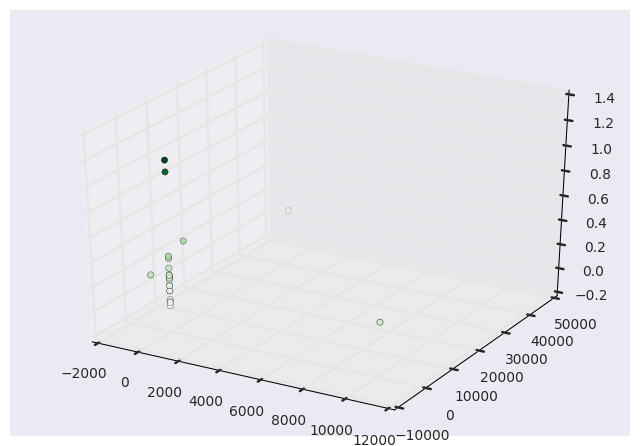

In [81]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df_yl['theta']
xdata = stimulus_df_yl['tau1']
ydata = stimulus_df_yl['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
#ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

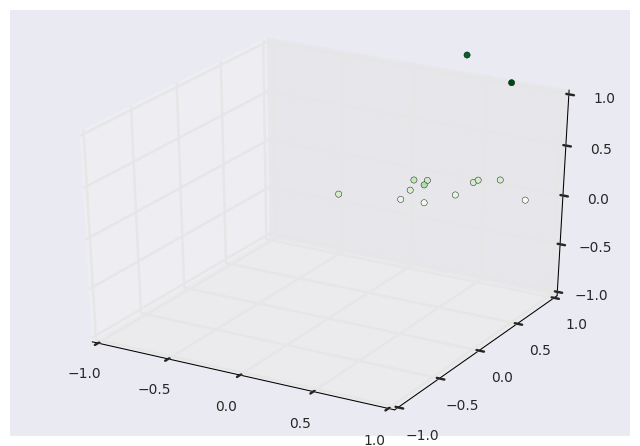

In [82]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df_yl['theta']
xdata = stimulus_df_yl['tau1']
ydata = stimulus_df_yl['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

('K1 =', 0.42430769219573577, '+/-', 154.87556283238001)
('k2 =', 0.40459214343550476, '+/-', 154.87504965100806)
('tau_1 =', 0.23369935300730107, '+/-', 154.87556283238001)
('tau_2 =', 0.25310970570125529, '+/-', 154.87504965100806)
('theta =', 0.17395108286243635, '+/-', 154.87504965100806)
muscle
b1_l


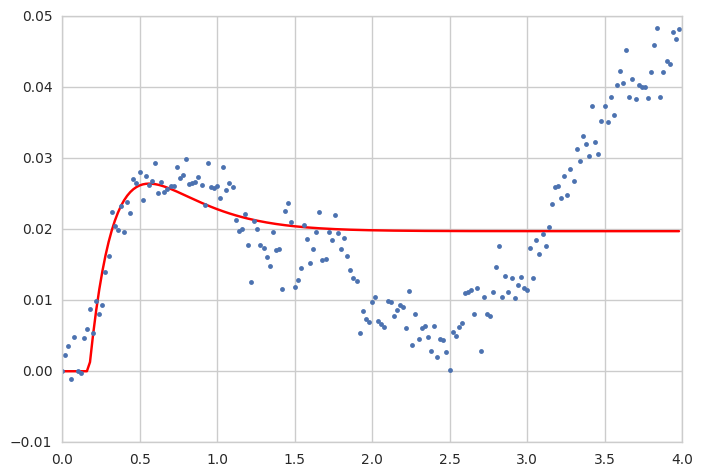

('K1 =', 1.0547505762195697, '+/-', 34.929580069320437)
('k2 =', 0.7646561161896992, '+/-', 35.231373097934195)
('tau_1 =', 1.8524239716520059, '+/-', 34.929580069320437)
('tau_2 =', 1.3432099806525508, '+/-', 35.231373097934195)
('theta =', 1.2860803982935536, '+/-', 35.231373097934195)
muscle
b2_l


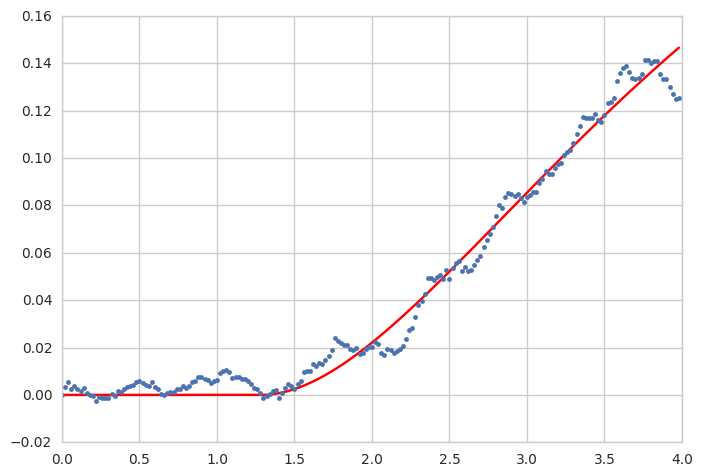

('K1 =', 0.20699299344516139, '+/-', 13.266507028677077)
('k2 =', 0.24749739631360576, '+/-', 13.266216409262281)
('tau_1 =', 0.15356087535352939, '+/-', 13.266507028677077)
('tau_2 =', 0.18290240520945056, '+/-', 13.266216409262281)
('theta =', 0.18405056626058494, '+/-', 13.266216409262281)
muscle
b3_l


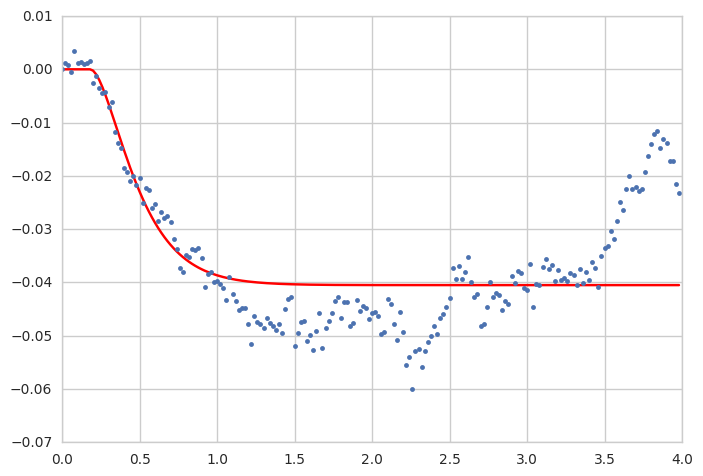

('K1 =', 0.20733706997390061, '+/-', 0.028246262654991694)
('k2 =', 0.13349710977371745, '+/-', 0.044308457664574676)
('tau_1 =', 2.0848786474807661, '+/-', 0.028246262654991694)
('tau_2 =', 0.46066405442491348, '+/-', 0.044308457664574676)
('theta =', 0.14657323286773641, '+/-', 0.044308457664574676)
muscle
i1_l


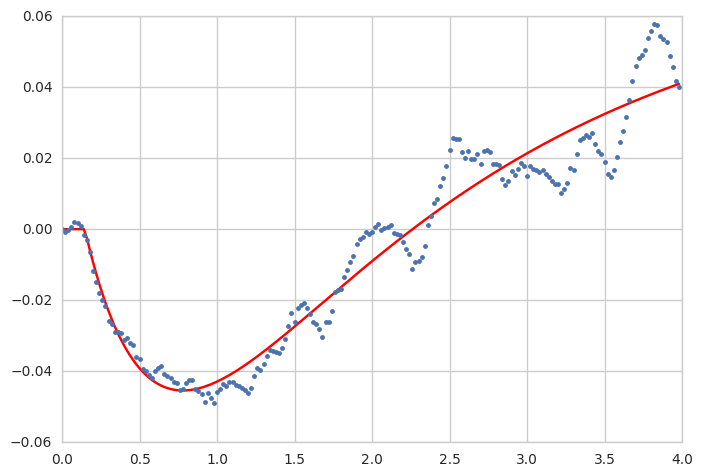

('K1 =', 1.0548426404183842, '+/-', 30.833516746962385)
('k2 =', 0.94047651604609661, '+/-', 30.834790665767354)
('tau_1 =', 0.45500592059405792, '+/-', 30.833516746962385)
('tau_2 =', 0.40585590424329288, '+/-', 30.834790665767354)
('theta =', 0.62051026935376441, '+/-', 30.834790665767354)
muscle
i2_l


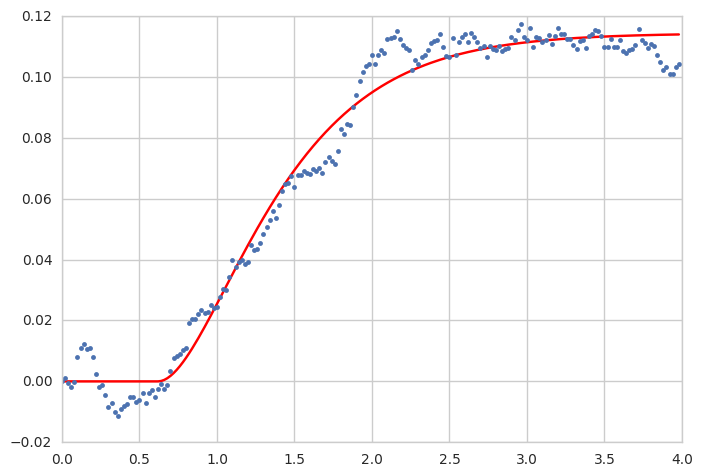

('K1 =', 0.18037505454351904, '+/-', 0.86226945018789336)
('k2 =', 0.047159907515296619, '+/-', 0.084371949948283967)
('tau_1 =', 11.876753078545137, '+/-', 0.86226945018789336)
('tau_2 =', 1.0681103500693461, '+/-', 0.084371949948283967)
('theta =', 0.079995687562055398, '+/-', 0.084371949948283967)
muscle
iii1_l


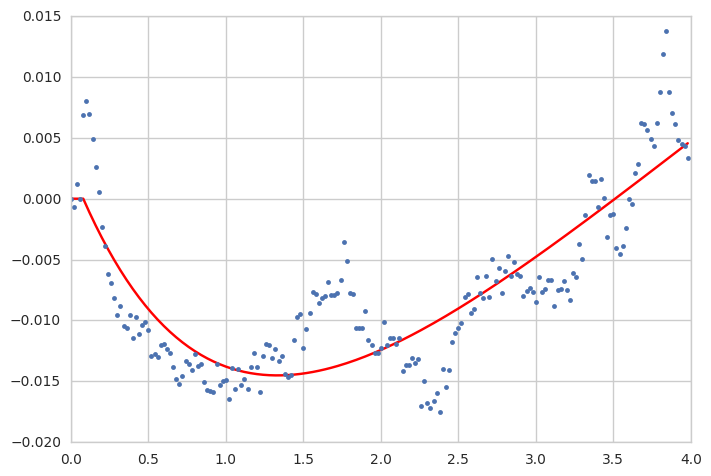

('K1 =', 11.873494770025964, '+/-', 43808.563289467027)
('k2 =', 4.655783214515151, '+/-', 91540.265114555397)
('tau_1 =', 206.46041932562673, '+/-', 43808.563289467027)
('tau_2 =', 80.959235793418117, '+/-', 91540.265114555397)
('theta =', -6.8846691831863431, '+/-', 91540.265114555397)
muscle
iii3_l


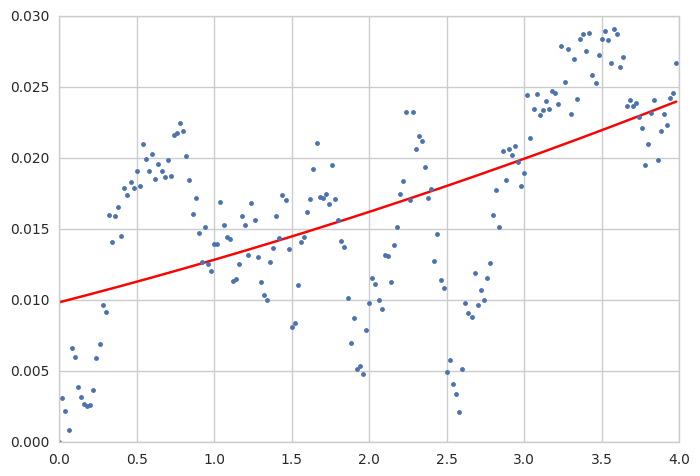

('K1 =', 346.97770912364507, '+/-', 131799.91490367145)
('k2 =', 0.041207605927154001, '+/-', 0.0016368669317905077)
('tau_1 =', 24945.163624512912, '+/-', 131799.91490367145)
('tau_2 =', 0.25092256400737711, '+/-', 0.0016368669317905077)
('theta =', 0.13361579705248219, '+/-', 0.0016368669317905077)
muscle
hg1_l


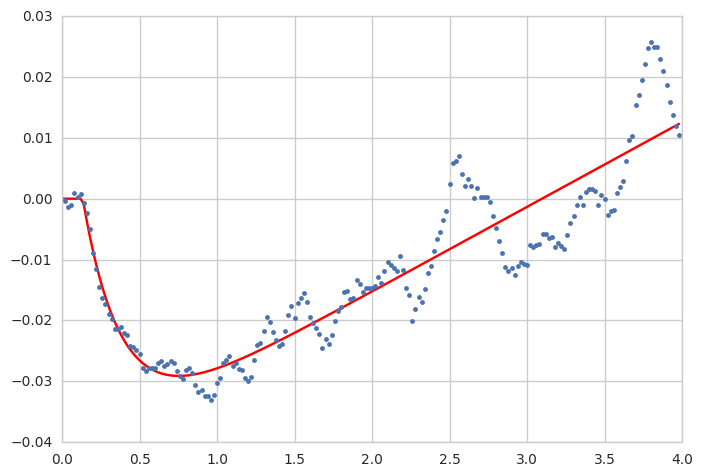

('K1 =', 0.10190282221649004, '+/-', 0.038669435632758146)
('k2 =', 0.0028061233592841994, '+/-', 0.037480476570247633)
('tau_1 =', 3.0616001739156227, '+/-', 0.038669435632758146)
('tau_2 =', 0.091037479843108268, '+/-', 0.037480476570247633)
('theta =', 0.32898487719649883, '+/-', 0.037480476570247633)
muscle
hg2_l


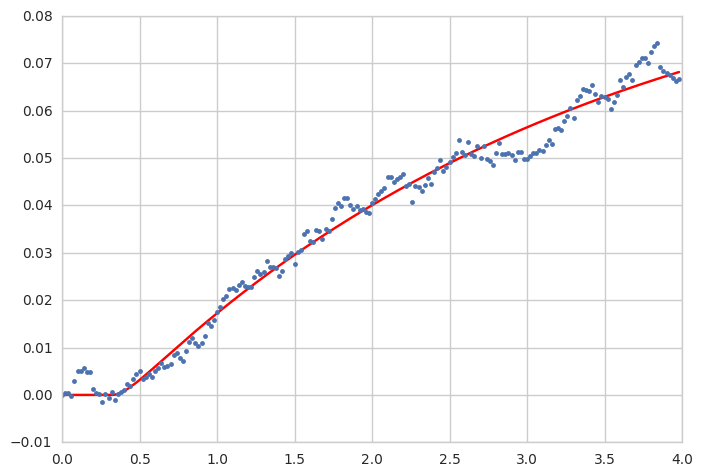

('K1 =', -0.0097250322093509201, '+/-', 0.0014795937342701876)
('k2 =', -0.02686205522945348, '+/-', 0.001635220511803897)
('tau_1 =', 0.17479648529468012, '+/-', 0.0014795937342701876)
('tau_2 =', 2.7370796136895024, '+/-', 0.001635220511803897)
('theta =', -0.020391980991672928, '+/-', 0.001635220511803897)
muscle
hg3_l


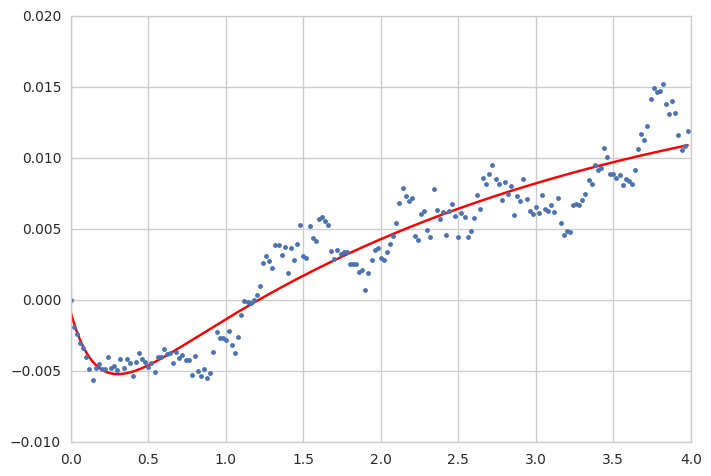

('K1 =', 1.7104782470949176, '+/-', 21969.225219655189)
('k2 =', 1.7209442206513861, '+/-', 21969.357586705886)
('tau_1 =', 2.427606767359106, '+/-', 21969.225219655189)
('tau_2 =', 2.3552345139647826, '+/-', 21969.357586705886)
('theta =', -0.1177855406112268, '+/-', 21969.357586705886)
muscle
hg4_l


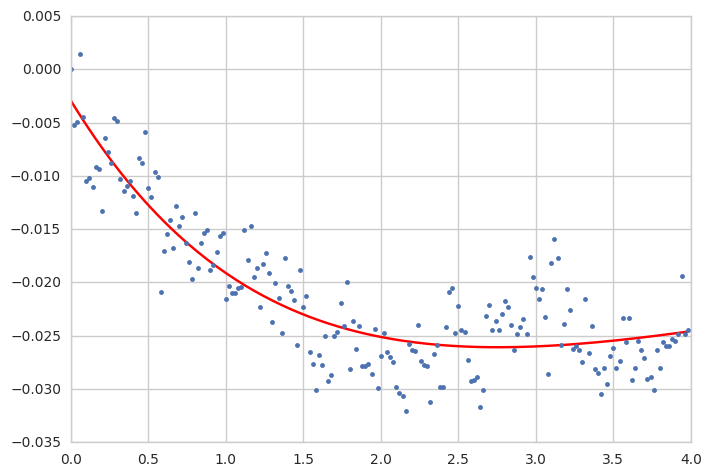

('K1 =', 6.0890986702888803, '+/-', 13262.985616401085)
('k2 =', 6.1205800464136857, '+/-', 13262.984835667243)
('tau_1 =', 0.28387533466262088, '+/-', 13262.985616401085)
('tau_2 =', 0.28916168925675756, '+/-', 13262.984835667243)
('theta =', 0.29335953744462961, '+/-', 13262.984835667243)
muscle
b1_r


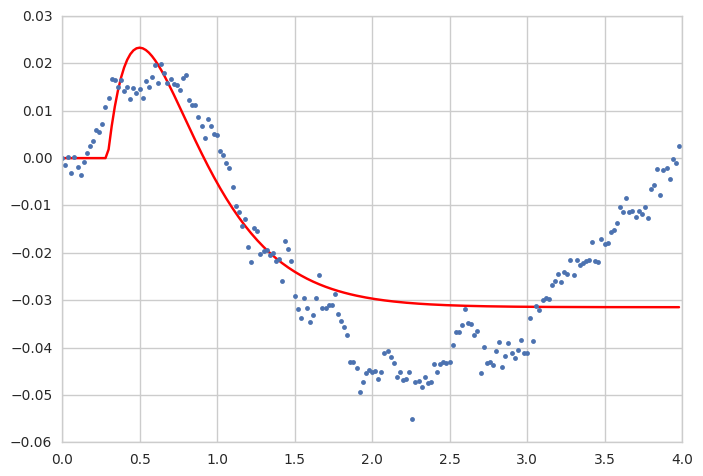

('K1 =', 65.178505212803003, '+/-', 30033.072959606656)
('k2 =', 32.880975422577414, '+/-', 37671.5557839299)
('tau_1 =', 35.507900355837471, '+/-', 30033.072959606656)
('tau_2 =', 17.443802348646198, '+/-', 37671.5557839299)
('theta =', 0.8867129689782004, '+/-', 37671.5557839299)
muscle
b2_r


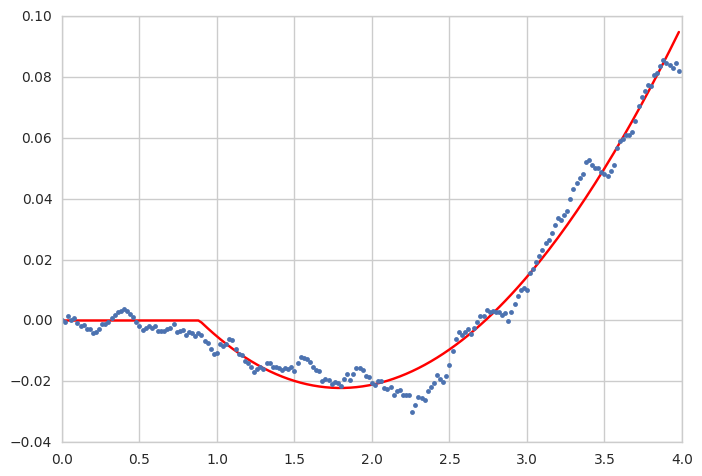

('K1 =', 16.745524491119074, '+/-', 37425.550675138926)
('k2 =', 16.78669712109939, '+/-', 37425.550918657966)
('tau_1 =', 0.21563179360056309, '+/-', 37425.550675138926)
('tau_2 =', 0.21690047910943525, '+/-', 37425.550918657966)
('theta =', 0.44827635912314351, '+/-', 37425.550918657966)
muscle
b3_r


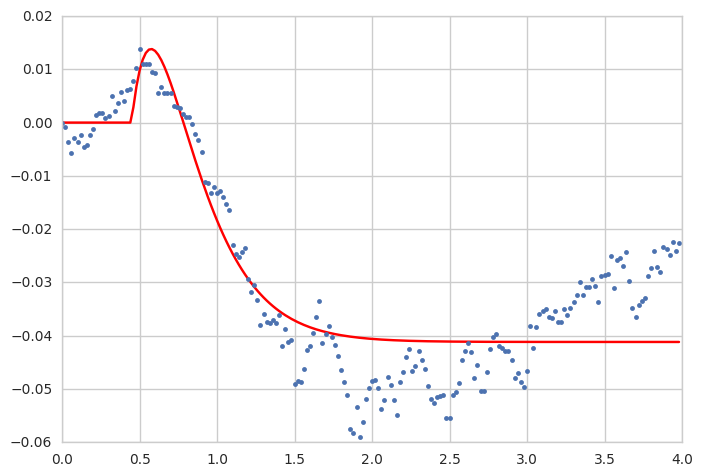

('K1 =', 0.68099057845688438, '+/-', 31.061280888180992)
('k2 =', 0.55197053557965092, '+/-', 31.106350835502148)
('tau_1 =', 1.4790532905944229, '+/-', 31.061280888180992)
('tau_2 =', 1.1989986520976863, '+/-', 31.106350835502148)
('theta =', 0.44529096762588349, '+/-', 31.106350835502148)
muscle
i1_r


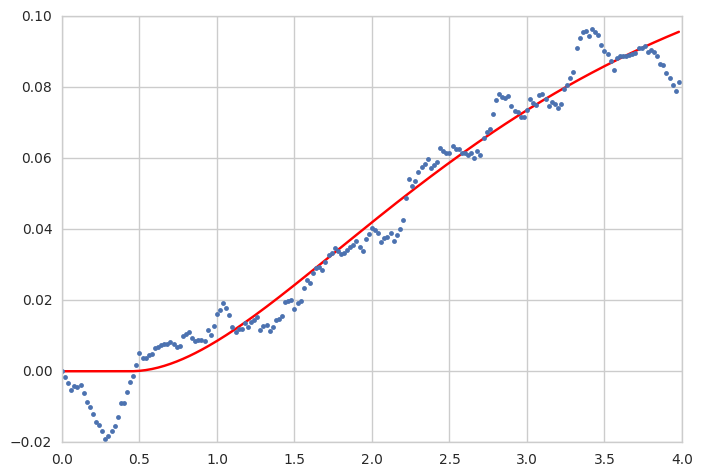

('K1 =', 0.19689216162139045, '+/-', 40411.331701213116)
('k2 =', -0.03715719970643485, '+/-', 40411.332373601748)
('tau_1 =', 0.71114216134075114, '+/-', 40411.331701213116)
('tau_2 =', 0.71114206438530525, '+/-', 40411.332373601748)
('theta =', 0.6779690688434733, '+/-', 40411.332373601748)
muscle
i2_r


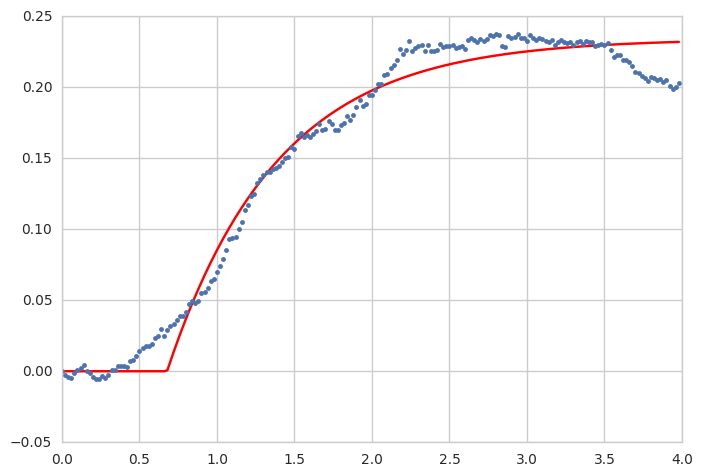

('K1 =', 0.36886385121657717, '+/-', 35.891534405300909)
('k2 =', 0.40345362905868293, '+/-', 35.890956598438763)
('tau_1 =', 0.45938258584164704, '+/-', 35.891534405300909)
('tau_2 =', 0.50214976983336823, '+/-', 35.890956598438763)
('theta =', 0.0060346391506268396, '+/-', 35.890956598438763)
muscle
iii1_r


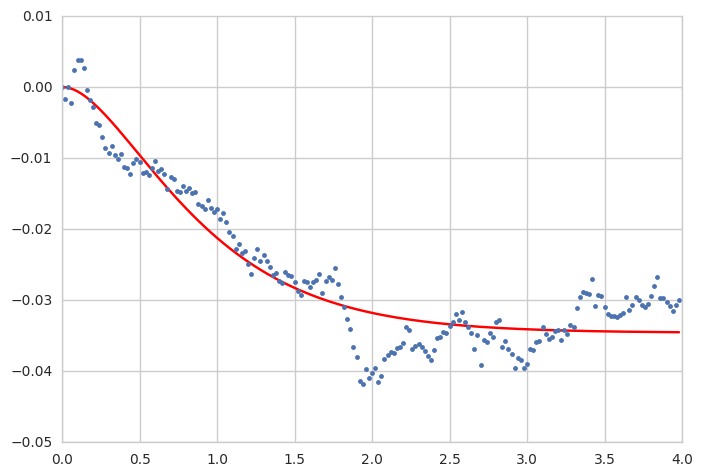

('K1 =', 2.3443922191614535, '+/-', 5573.824549964681)
('k2 =', 2.3700829012599733, '+/-', 5573.8243547883476)
('tau_1 =', 0.1814356945734189, '+/-', 5573.824549964681)
('tau_2 =', 0.18525661230029339, '+/-', 5573.8243547883476)
('theta =', 0.034827197977214848, '+/-', 5573.8243547883476)
muscle
iii3_r


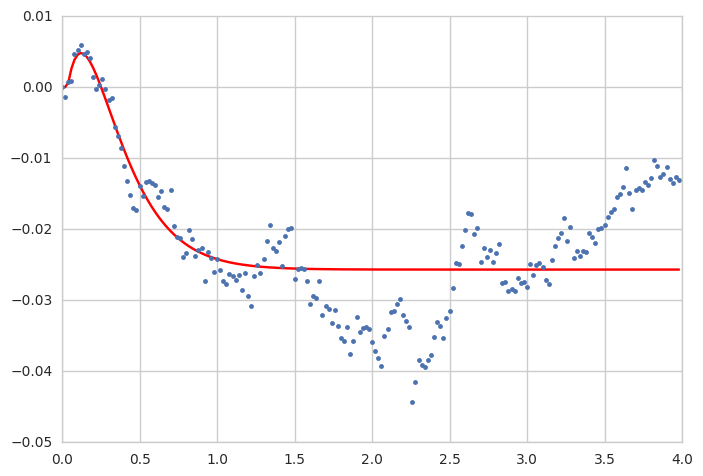

('K1 =', 2.1716353410651537, '+/-', 10767.028767269339)
('k2 =', 2.1020414390740387, '+/-', 10767.334188123394)
('tau_1 =', 2.7486086822885558, '+/-', 10767.028767269339)
('tau_2 =', 2.6097186000245522, '+/-', 10767.334188123394)
('theta =', -0.51592731249436252, '+/-', 10767.334188123394)
muscle
hg1_r


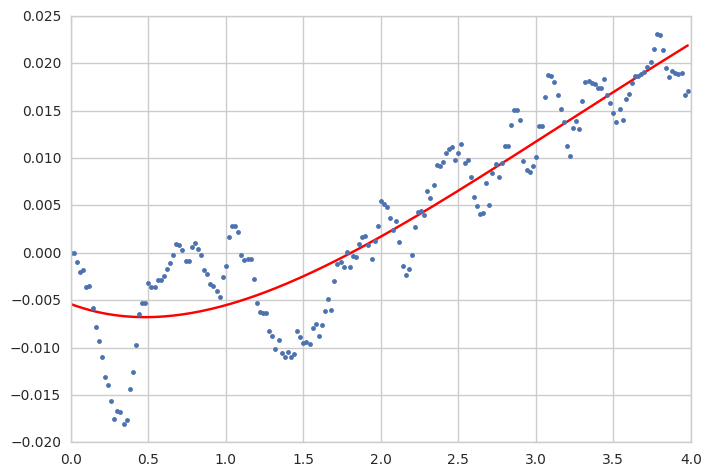

('K1 =', 0.20996824899062419, '+/-', 0.51491562088567056)
('k2 =', 0.094493798894727074, '+/-', 0.51920562642612944)
('tau_1 =', 1.1313105106999206, '+/-', 0.51491562088567056)
('tau_2 =', 0.71460058401027948, '+/-', 0.51920562642612944)
('theta =', 0.34000000439269268, '+/-', 0.51920562642612944)
muscle
hg2_r


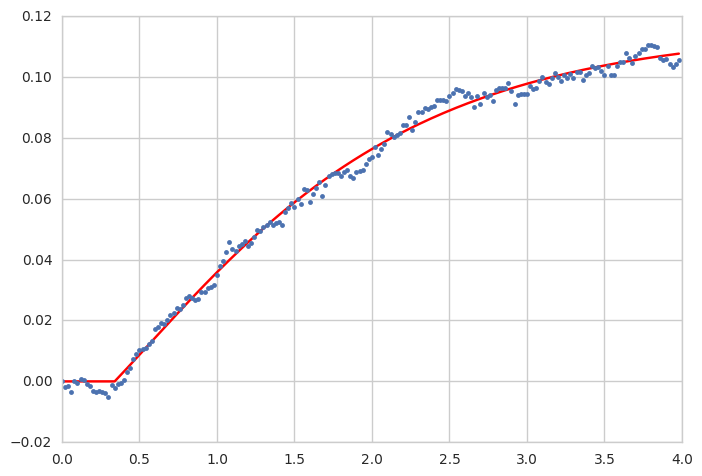

('K1 =', 429.79586206997175, '+/-', 27077.955450640296)
('k2 =', 132.23157595298764, '+/-', 28245.606687169839)
('tau_1 =', 489.96144319943818, '+/-', 27077.955450640296)
('tau_2 =', 149.91748233685175, '+/-', 28245.606687169839)
('theta =', -0.14640037328209327, '+/-', 28245.606687169839)
muscle
hg3_r


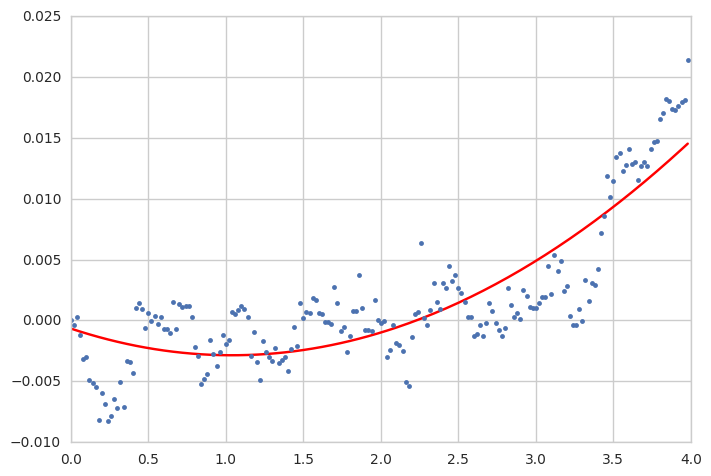

('K1 =', 0.53679364297731091, '+/-', 1040.9506535908224)
('k2 =', 0.54155587818600803, '+/-', 1040.9504898764985)
('tau_1 =', 0.19316793960515222, '+/-', 1040.9506535908224)
('tau_2 =', 0.19949616313701099, '+/-', 1040.9504898764985)
('theta =', 0.17409596298419341, '+/-', 1040.9504898764985)
muscle
hg4_r


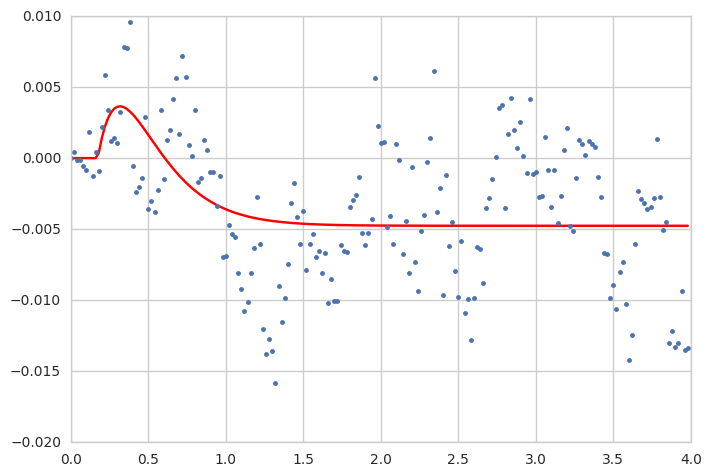

In [164]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_pu = pd.DataFrame()
stimulus = pitch_up_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_pu = stimulus_df_pu.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_pu.to_csv('pitch_up_constants_theta.csv') 

In [ ]:
stimulus_df_pu

('K1 =', 5.0608094118590046, '+/-', nan)
('k2 =', 5.0026437287793684, '+/-', nan)
('tau_1 =', 2.2990885704167301, '+/-', nan)
('tau_2 =', 2.2374962737040738, '+/-', nan)
('theta =', 0.05802647022633909, '+/-', nan)
muscle
b1_l


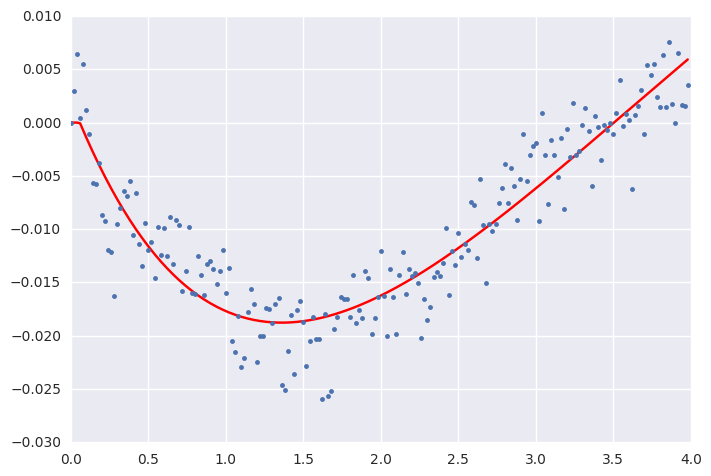

('K1 =', 12.003161322475405, '+/-', 25097.534955107796)
('k2 =', 4.8178697954125855, '+/-', 48475.535393801991)
('tau_1 =', 220.7775556076954, '+/-', 25097.534955107796)
('tau_2 =', 88.618179117982478, '+/-', 48475.535393801991)
('theta =', -5.75522923156087, '+/-', 48475.535393801991)
muscle
b2_l


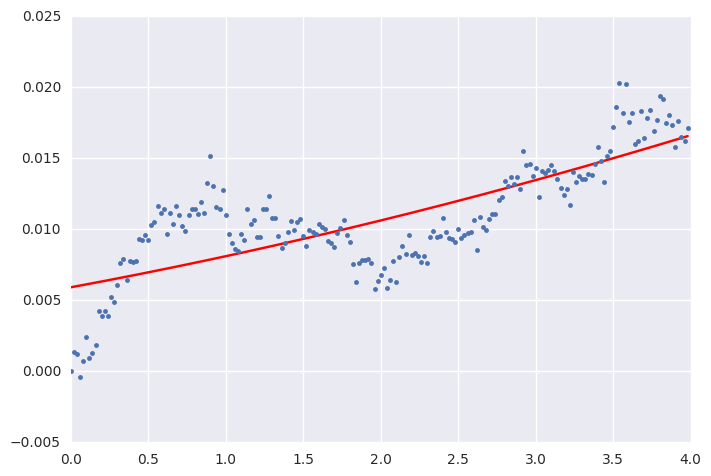

('K1 =', 1.101267153150076, '+/-', 7780.9928840081229)
('k2 =', 1.06242757322552, '+/-', 7781.8497741880346)
('tau_1 =', 3.301886369016771, '+/-', 7780.9928840081229)
('tau_2 =', 3.0740062232096381, '+/-', 7781.8497741880346)
('theta =', 0.62706364217592248, '+/-', 7781.8497741880346)
muscle
b3_l


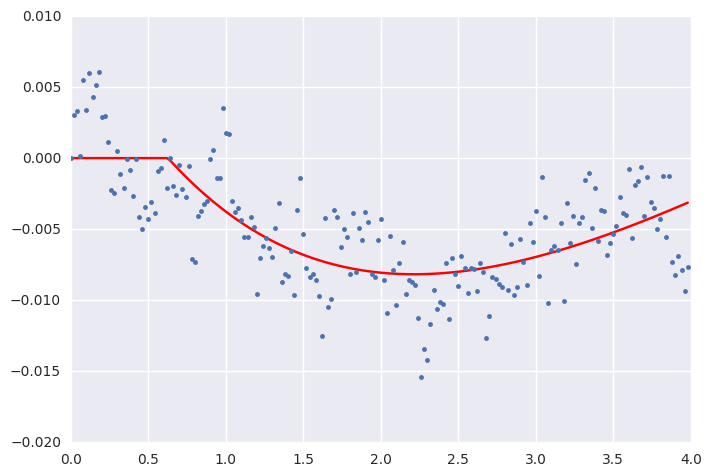

('K1 =', 0.009554577141000227, '+/-', 14323.494612439485)
('k2 =', 0.05219086656491724, '+/-', 14323.494476729154)
('tau_1 =', 0.14616287968480055, '+/-', 14323.494612439485)
('tau_2 =', 0.14625117151301317, '+/-', 14323.494476729154)
('theta =', 0.15747099434683129, '+/-', 14323.494476729154)
muscle
i1_l


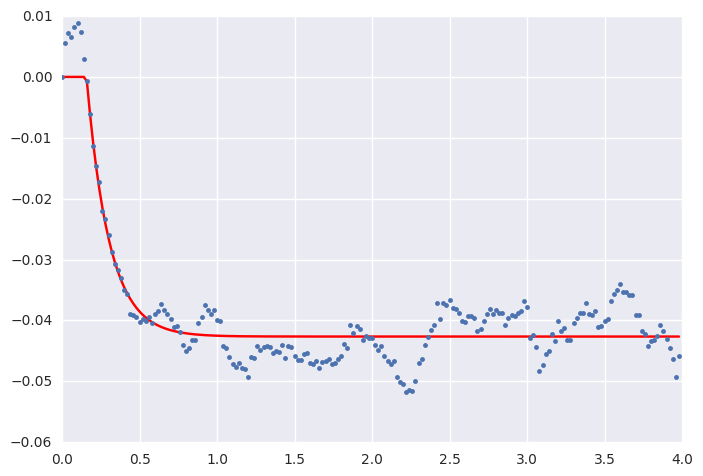

('K1 =', 0.20778115686450563, '+/-', 1.8122955981157614)
('k2 =', 0.10580903128422647, '+/-', 2.5068094681461024)
('tau_1 =', 4.6557347156246669, '+/-', 1.8122955981157614)
('tau_2 =', 1.8047082009809408, '+/-', 2.5068094681461024)
('theta =', 0.21999994747544305, '+/-', 2.5068094681461024)
muscle
i2_l


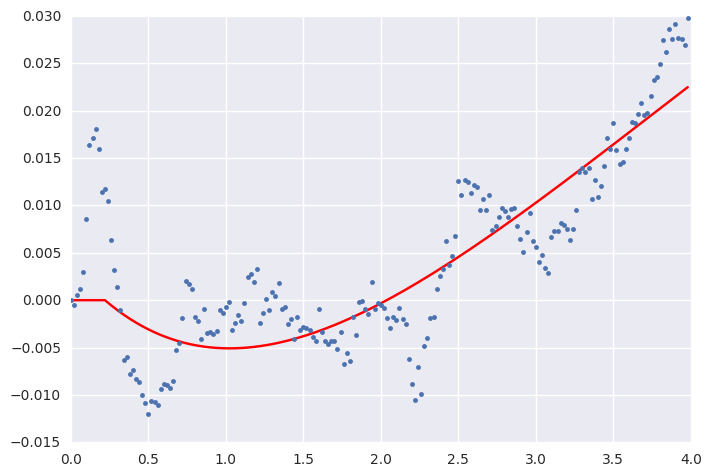

('K1 =', 0.087750894909526728, '+/-', nan)
('k2 =', 0.10296695294502727, '+/-', nan)
('tau_1 =', 0.61494721724442691, '+/-', nan)
('tau_2 =', 0.61497357285922261, '+/-', nan)
('theta =', 0.82748895884081086, '+/-', nan)
muscle
iii1_l


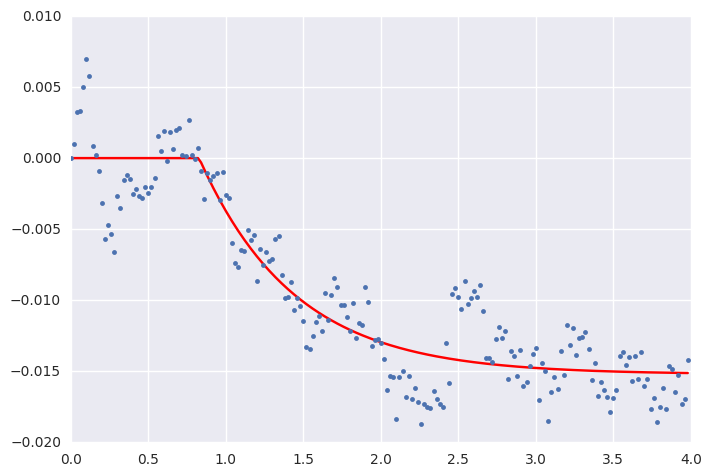

('K1 =', 0.16367195352615585, '+/-', 0.08329670516340032)
('k2 =', 0.16755780894924319, '+/-', 0.082432995492622077)
('tau_1 =', 0.33464775233372596, '+/-', 0.08329670516340032)
('tau_2 =', 0.70958200743231237, '+/-', 0.082432995492622077)
('theta =', 0.10702339169048665, '+/-', 0.082432995492622077)
muscle
iii3_l


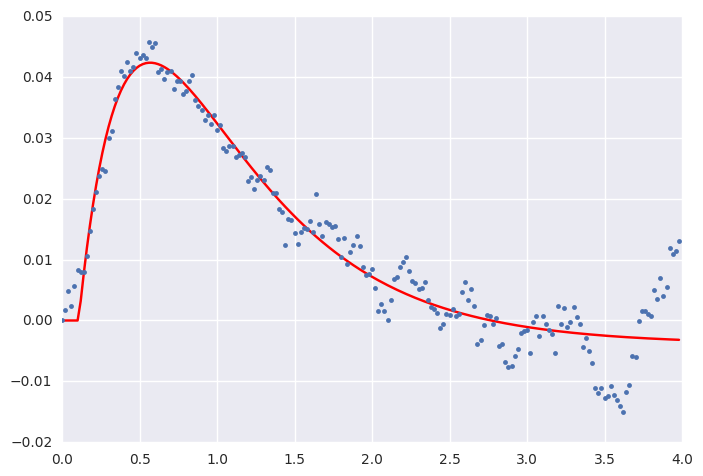

('K1 =', 0.014170309663167046, '+/-', 0.098454489182349406)
('k2 =', 0.045350151366201644, '+/-', 0.0019714628691535289)
('tau_1 =', 12.288919431304004, '+/-', 0.098454489182349406)
('tau_2 =', 0.22440605273268088, '+/-', 0.0019714628691535289)
('theta =', 0.12000002121569481, '+/-', 0.0019714628691535289)
muscle
hg1_l


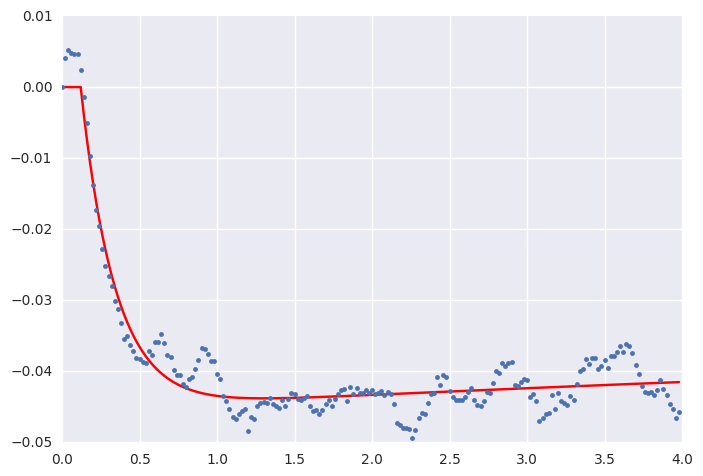

('K1 =', 1.0314233798357644, '+/-', 14364.648244820713)
('k2 =', 1.0232775415841997, '+/-', 14364.646540357346)
('tau_1 =', 0.65111925772921742, '+/-', 14364.648244820713)
('tau_2 =', 0.65948742185592979, '+/-', 14364.646540357346)
('theta =', 0.44228521804658555, '+/-', 14364.646540357346)
muscle
hg2_l


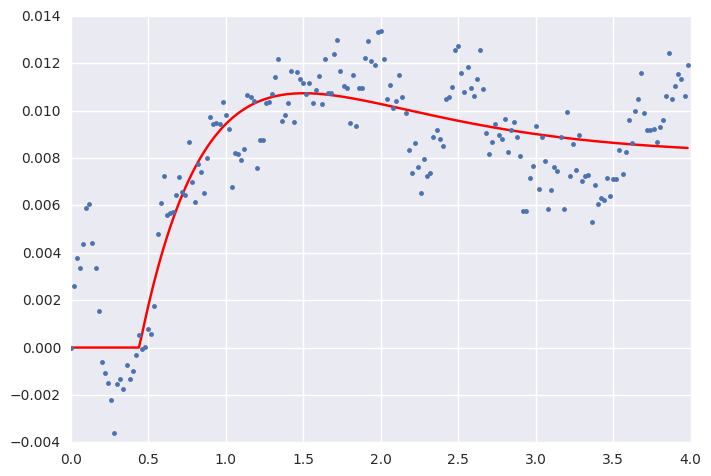

('K1 =', 0.016375308207136618, '+/-', 0.060944473130900068)
('k2 =', 0.0034668160253337253, '+/-', 0.00033675788903809962)
('tau_1 =', 19.322196459348621, '+/-', 0.060944473130900068)
('tau_2 =', 0.043733572438632233, '+/-', 0.00033675788903809962)
('theta =', 0.0074478099576223023, '+/-', 0.00033675788903809962)
muscle
hg3_l


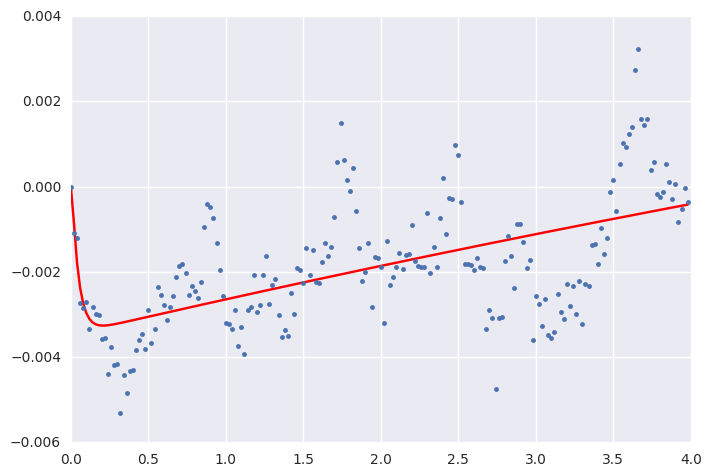

('K1 =', 20.101384417090703, '+/-', 64551.451253743973)
('k2 =', 0.16733499620293329, '+/-', 7.9010012033485024)
('tau_1 =', 901.00634143257594, '+/-', 64551.451253743973)
('tau_2 =', 4.9711543282348796, '+/-', 7.9010012033485024)
('theta =', -0.10809633848599708, '+/-', 7.9010012033485024)
muscle
hg4_l


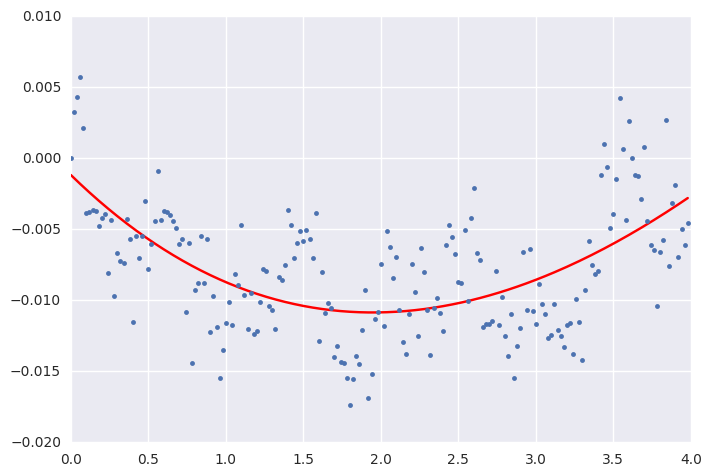

('K1 =', 8.8049608459942057, '+/-', nan)
('k2 =', 8.7913958957973062, '+/-', nan)
('tau_1 =', 1.2353388286765732, '+/-', nan)
('tau_2 =', 1.2172100554818592, '+/-', nan)
('theta =', 0.067107946527864434, '+/-', nan)
muscle
b1_r


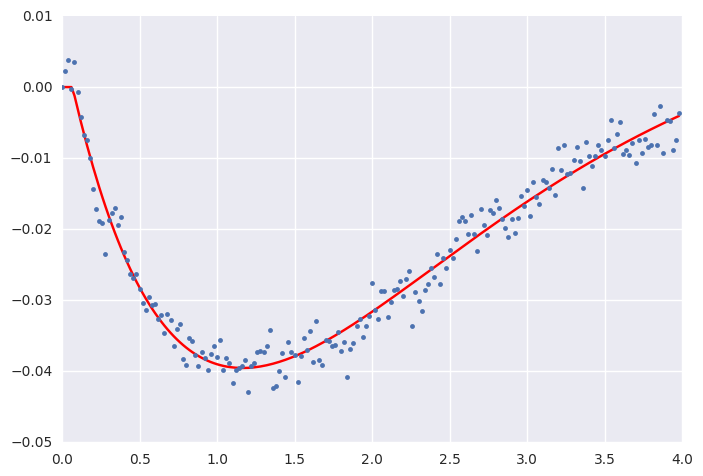

('K1 =', -1.8803521847224329, '+/-', nan)
('k2 =', -1.8854186142185134, '+/-', nan)
('tau_1 =', 0.37952979715978347, '+/-', nan)
('tau_2 =', 0.38301650289390127, '+/-', nan)
('theta =', 0.84722277042432248, '+/-', nan)
muscle
b2_r


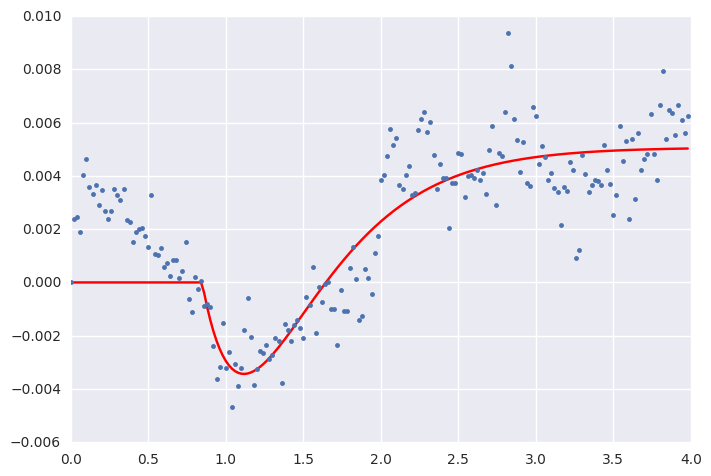

('K1 =', 5.4999826054365899, '+/-', 36239.553117026036)
('k2 =', 5.5176758970610402, '+/-', 36239.552691744146)
('tau_1 =', 0.45742876343428396, '+/-', 36239.553117026036)
('tau_2 =', 0.46123057484225771, '+/-', 36239.552691744146)
('theta =', 0.14038615779652908, '+/-', 36239.552691744146)
muscle
b3_r


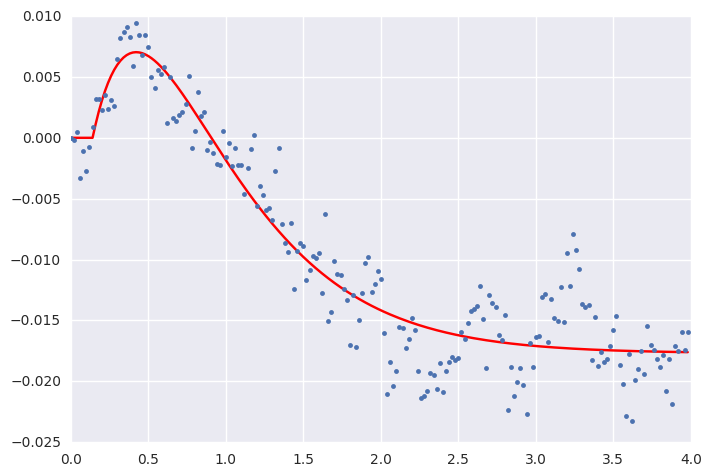

('K1 =', 0.09913859857997806, '+/-', 53.952710224229911)
('k2 =', 0.13945197222330355, '+/-', 53.949797969119182)
('tau_1 =', 0.79076835613255836, '+/-', 53.952710224229911)
('tau_2 =', 0.86943279913938731, '+/-', 53.949797969119182)
('theta =', 0.039999949476347073, '+/-', 53.949797969119182)
muscle
i1_r


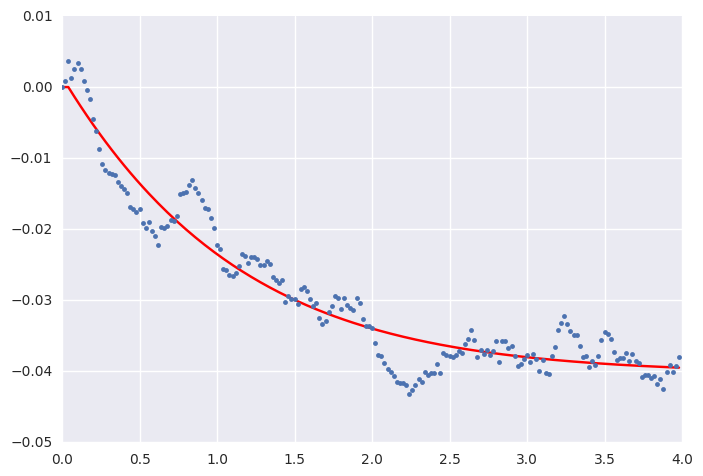

('K1 =', 7.0608729787500044, '+/-', nan)
('k2 =', 7.0896305862895037, '+/-', nan)
('tau_1 =', 0.67124886835944353, '+/-', nan)
('tau_2 =', 0.67639233444239655, '+/-', nan)
('theta =', -0.23756047554279006, '+/-', nan)
muscle
i2_r


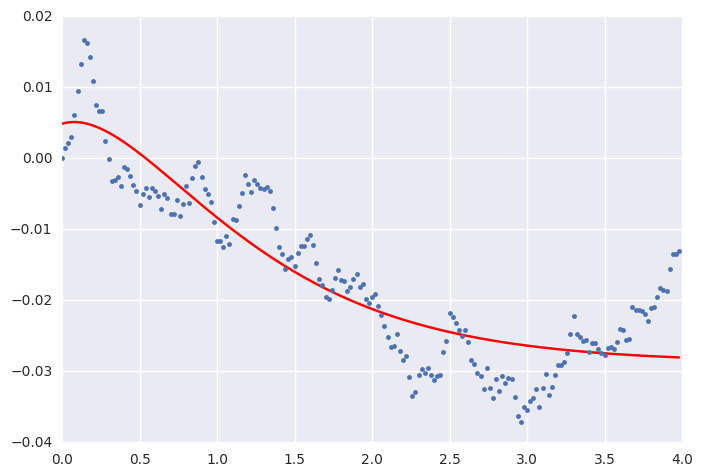

('K1 =', 2.7062344273088046, '+/-', nan)
('k2 =', 2.7023905771810193, '+/-', nan)
('tau_1 =', 0.33597194771351574, '+/-', nan)
('tau_2 =', 0.33814176129664508, '+/-', nan)
('theta =', 0.37851967881265053, '+/-', nan)
muscle
iii1_r


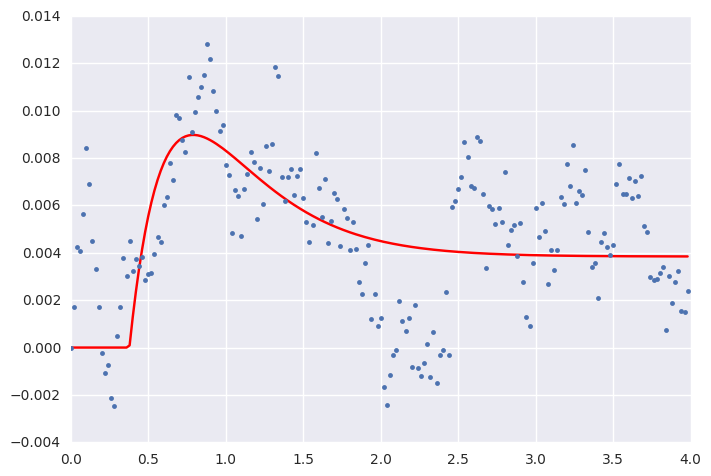

('K1 =', 0.65441708914348917, '+/-', 2358.6626414214243)
('k2 =', 0.63198044003061038, '+/-', 2358.6582911822188)
('tau_1 =', 0.9223701770726821, '+/-', 2358.6626414214243)
('tau_2 =', 0.94939782433534159, '+/-', 2358.6582911822188)
('theta =', -0.010124953397014363, '+/-', 2358.6582911822188)
muscle
iii3_r


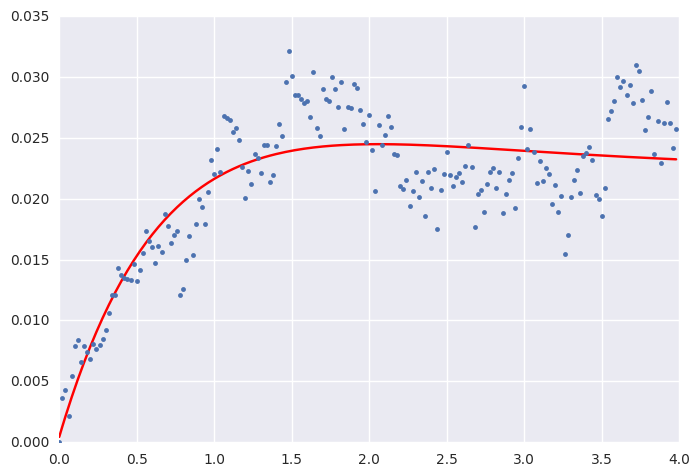

('K1 =', -0.041225171257644272, '+/-', 0.18648073507156751)
('k2 =', -0.013275375026319243, '+/-', 0.18688317522273321)
('tau_1 =', 0.58797894684188801, '+/-', 0.18648073507156751)
('tau_2 =', 0.37166561917973345, '+/-', 0.18688317522273321)
('theta =', 0.079999784190384574, '+/-', 0.18688317522273321)
muscle
hg1_r


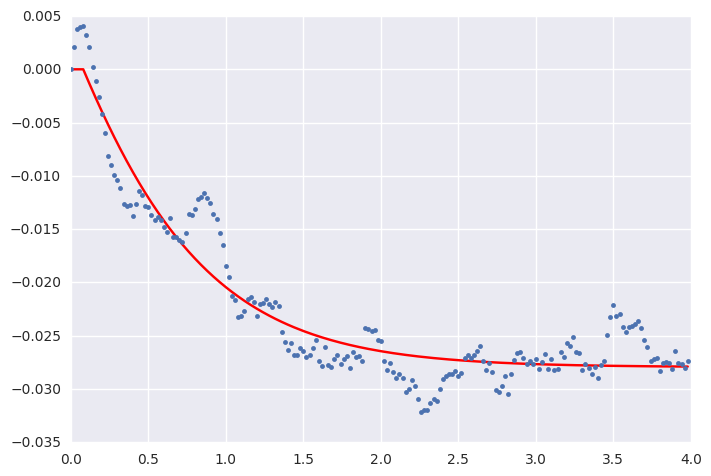

('K1 =', -1.8286807022516511, '+/-', 23216.946982004018)
('k2 =', -1.8331975332337178, '+/-', 23216.946810932321)
('tau_1 =', 0.089474130909624208, '+/-', 23216.946982004018)
('tau_2 =', 0.090507607060946196, '+/-', 23216.946810932321)
('theta =', 0.19317445675056855, '+/-', 23216.946810932321)
muscle
hg2_r


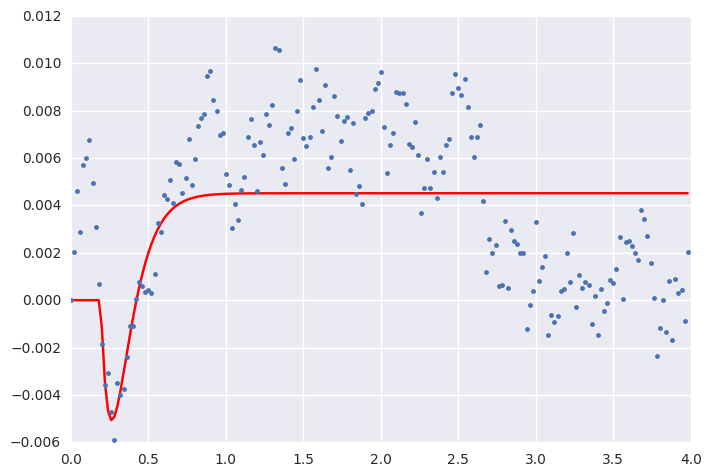

('K1 =', -3.6787968500798929, '+/-', 22930.191845420908)
('k2 =', -9.5095897273431298, '+/-', 10220.447347556383)
('tau_1 =', 107.8914877430464, '+/-', 22930.191845420908)
('tau_2 =', 287.20579388547486, '+/-', 10220.447347556383)
('theta =', -9.7800961034193445, '+/-', 10220.447347556383)
muscle
hg3_r


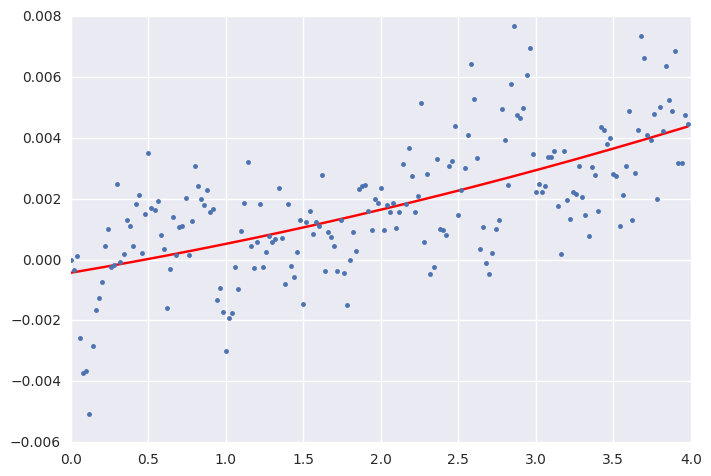

('K1 =', 0.10925109271479222, '+/-', 6.6367526948761375)
('k2 =', 0.12722895219616007, '+/-', 6.6366633452586594)
('tau_1 =', 0.19159781077002727, '+/-', 6.6367526948761375)
('tau_2 =', 0.22304776053967804, '+/-', 6.6366633452586594)
('theta =', 0.79731991543418534, '+/-', 6.6366633452586594)
muscle
hg4_r


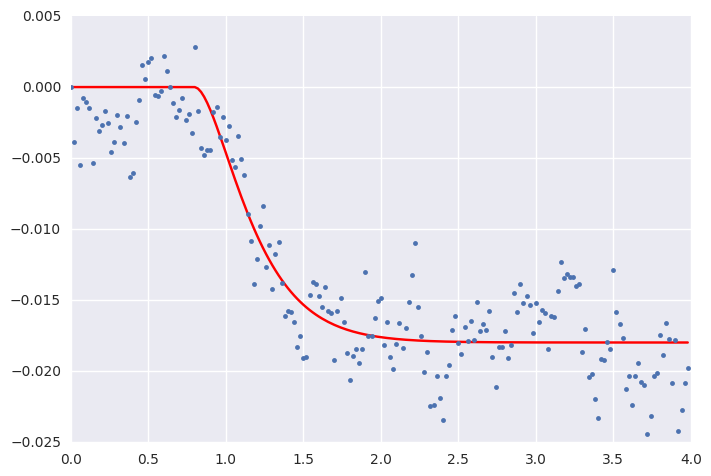

In [88]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_pd = pd.DataFrame()
stimulus = pitch_down_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_pd = stimulus_df_pd.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_pd.to_csv('pitch_down_constants_theta.csv') 

('K1 =', 64.605635746308081, '+/-', 7887.4599873190527)
('k2 =', 20.090999518091884, '+/-', 22425.599157371784)
('tau_1 =', 209.79992150522918, '+/-', 7887.4599873190527)
('tau_2 =', 63.280484551351591, '+/-', 22425.599157371784)
('theta =', -0.69713026273069978, '+/-', 22425.599157371784)
muscle
b1_l


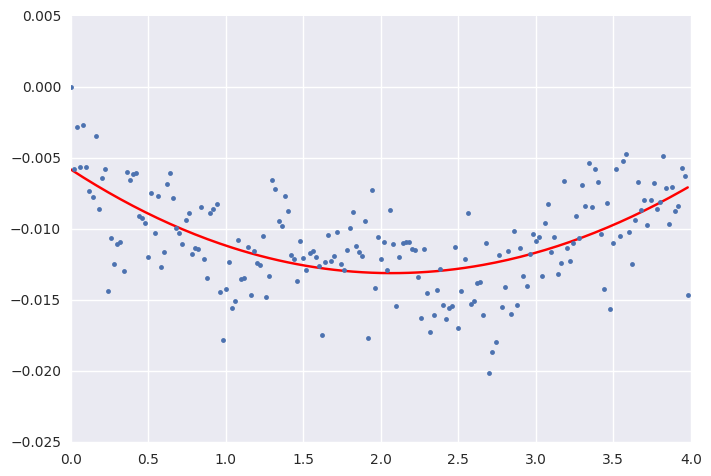

('K1 =', 2.4162167065312792, '+/-', 34699.889188910107)
('k2 =', 2.4168765740691507, '+/-', 34699.888697706599)
('tau_1 =', 0.4609030582625005, '+/-', 34699.889188910107)
('tau_2 =', 0.46413057989074147, '+/-', 34699.888697706599)
('theta =', 0.25243640336832951, '+/-', 34699.888697706599)
muscle
b2_l


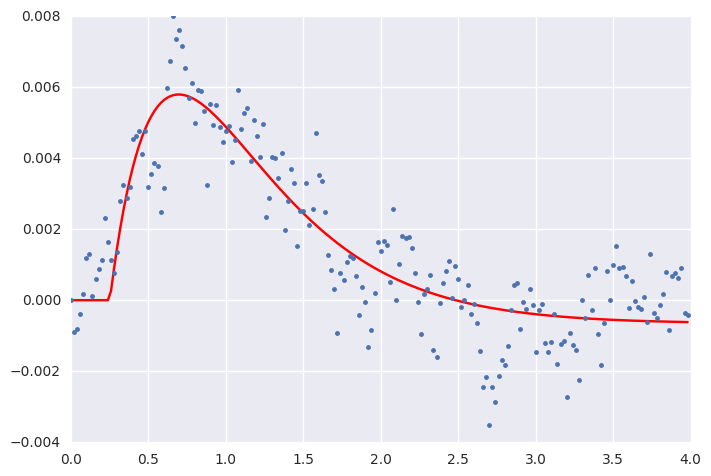

('K1 =', -0.018510850122272073, '+/-', 0.42593394115550759)
('k2 =', -0.035661717163283195, '+/-', 0.42569447857232617)
('tau_1 =', 0.34295338885025473, '+/-', 0.42593394115550759)
('tau_2 =', 0.47809044981308502, '+/-', 0.42569447857232617)
('theta =', 0.020015432403379545, '+/-', 0.42569447857232617)
muscle
b3_l


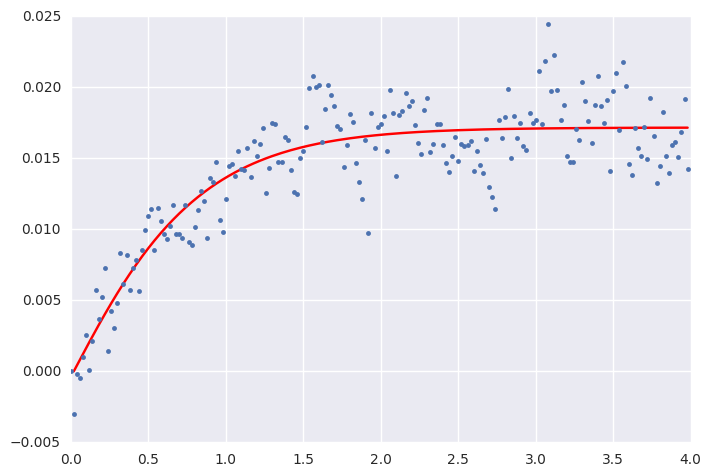

('K1 =', 0.084047611892719448, '+/-', 0.001706533345803489)
('k2 =', 0.01540245570247141, '+/-', 0.0017897226941660698)
('tau_1 =', 1.7255607592376814, '+/-', 0.001706533345803489)
('tau_2 =', 0.039914099838578639, '+/-', 0.0017897226941660698)
('theta =', 0.17265002779604377, '+/-', 0.0017897226941660698)
muscle
i1_l


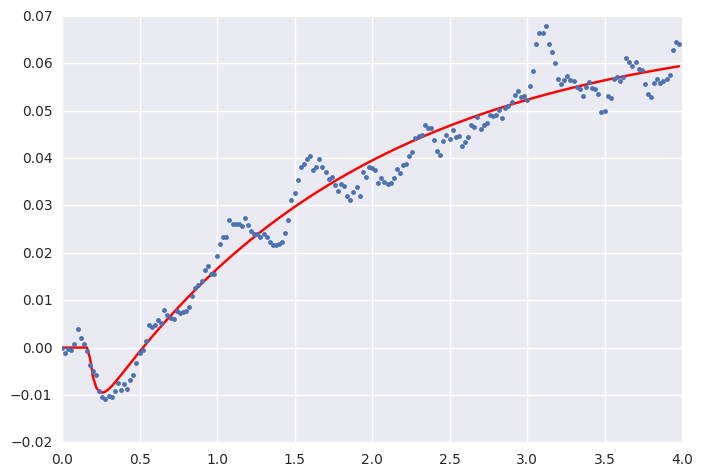

('K1 =', 0.097203743640838197, '+/-', 2152.9103827266395)
('k2 =', 0.0033108623633837861, '+/-', 2152.9101822846014)
('tau_1 =', 2.5908795690605424, '+/-', 2152.9103827266395)
('tau_2 =', 0.00045054849068734427, '+/-', 2152.9101822846014)
('theta =', 0.31979019540521436, '+/-', 2152.9101822846014)
muscle
i2_l


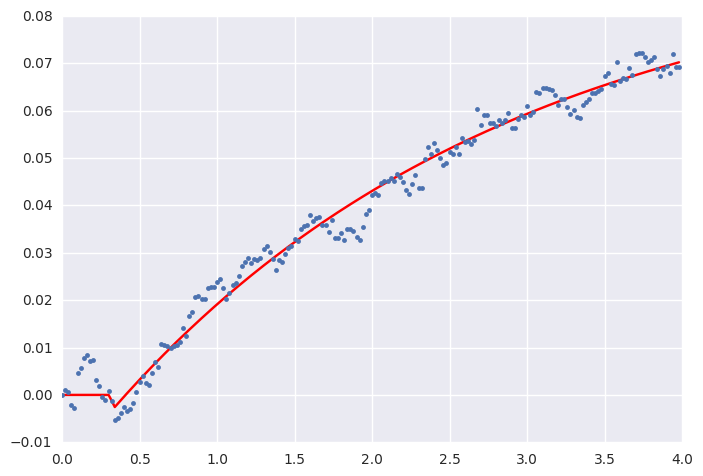

('K1 =', 319.1458420741842, '+/-', 26379.080388037695)
('k2 =', 97.114299533406665, '+/-', 24003.713470126731)
('tau_1 =', 526.13165699581612, '+/-', 26379.080388037695)
('tau_2 =', 158.7390378516663, '+/-', 24003.713470126731)
('theta =', -0.50293561625488026, '+/-', 24003.713470126731)
muscle
iii1_l


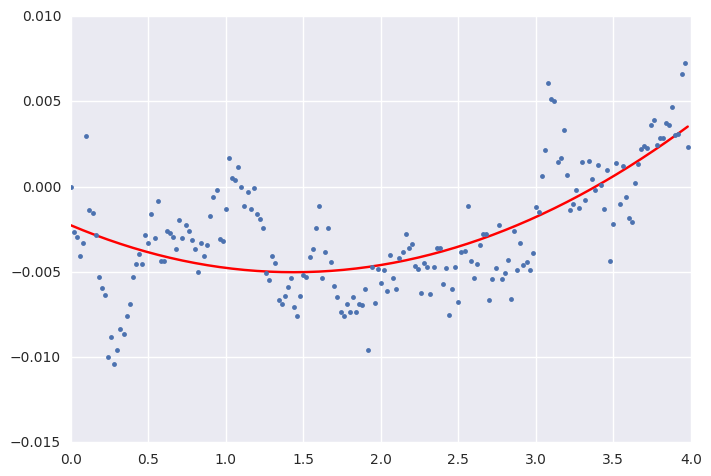

('K1 =', 0.31074349371682686, '+/-', 6.9691383143854857)
('k2 =', 0.37367503960502241, '+/-', 6.9670872105082218)
('tau_1 =', 0.60566908009337073, '+/-', 6.9691383143854857)
('tau_2 =', 0.72799749023525695, '+/-', 6.9670872105082218)
('theta =', 0.25275919571260935, '+/-', 6.9670872105082218)
muscle
iii3_l


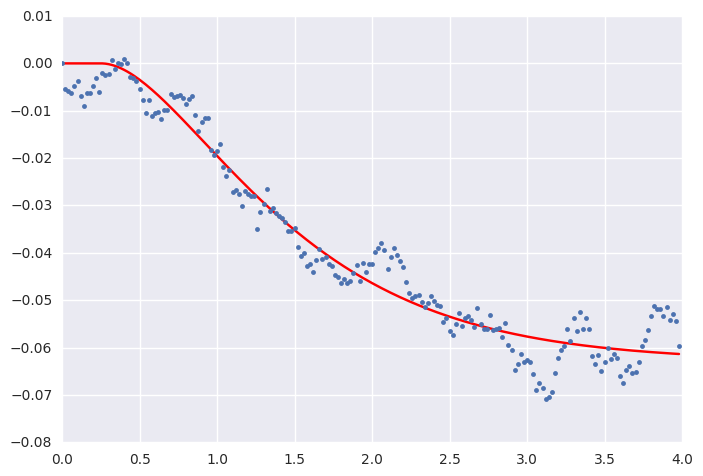

('K1 =', 0.032176156736074817, '+/-', 22.03438777364406)
('k2 =', 0.025759143890816433, '+/-', 21.70162119392165)
('tau_1 =', 0.82143984446475926, '+/-', 22.03438777364406)
('tau_2 =', 1.2325532097143819, '+/-', 21.70162119392165)
('theta =', 2.1279003392724403, '+/-', 21.70162119392165)
muscle
hg1_l


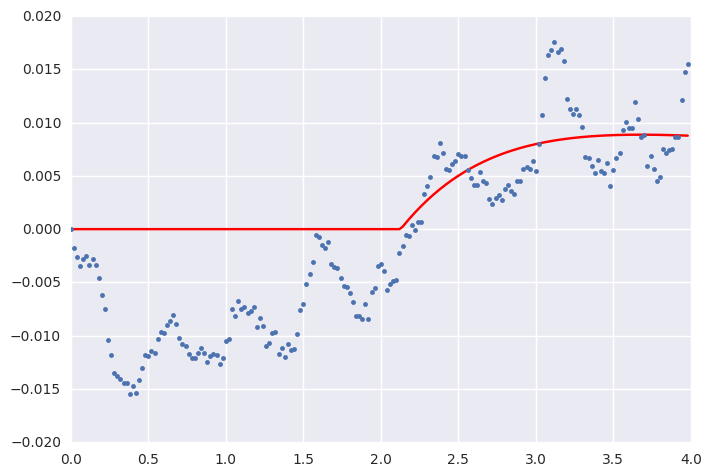

('K1 =', 0.022315116592765971, '+/-', 0.0016415871087801777)
('k2 =', 0.0060797543930929399, '+/-', 0.0016941759386553277)
('tau_1 =', 0.47439087655723383, '+/-', 0.0016415871087801777)
('tau_2 =', 0.024903656724112339, '+/-', 0.0016941759386553277)
('theta =', 0.1772597717805085, '+/-', 0.0016941759386553277)
muscle
hg2_l


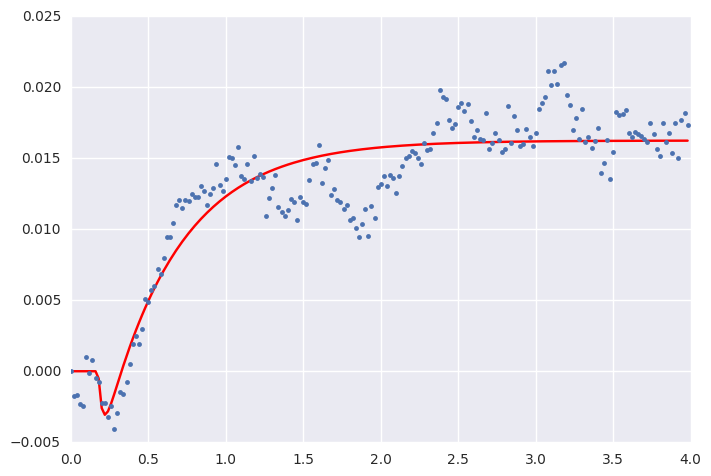

('K1 =', -0.0034448399725114788, '+/-', 0.00077006109749818568)
('k2 =', 4.7556054686869773, '+/-', 19290.331581469516)
('tau_1 =', 0.52641164970051568, '+/-', 0.00077006109749818568)
('tau_2 =', 12222.954031409439, '+/-', 19290.331581469516)
('theta =', 0.1349480338378376, '+/-', 19290.331581469516)
muscle
hg3_l


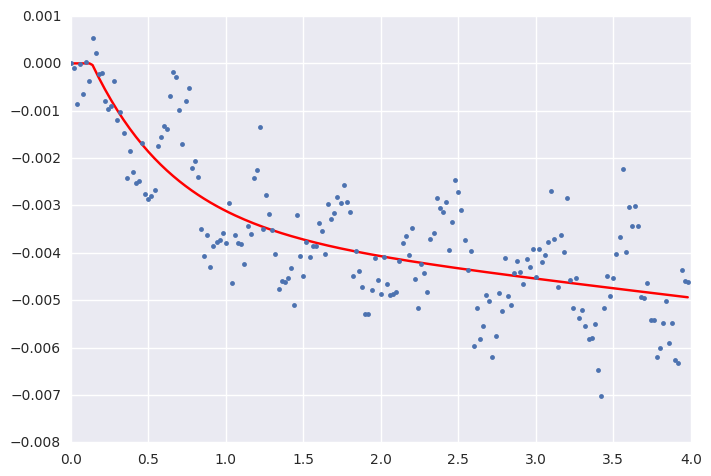

('K1 =', -0.0055218366564565103, '+/-', 7.1696509009872953)
('k2 =', 0.0066440316872633208, '+/-', 7.1696790858033461)
('tau_1 =', 0.0012122831346536459, '+/-', 7.1696509009872953)
('tau_2 =', 0.16154836238303114, '+/-', 7.1696790858033461)
('theta =', 0.019831869433818598, '+/-', 7.1696790858033461)
muscle
hg4_l


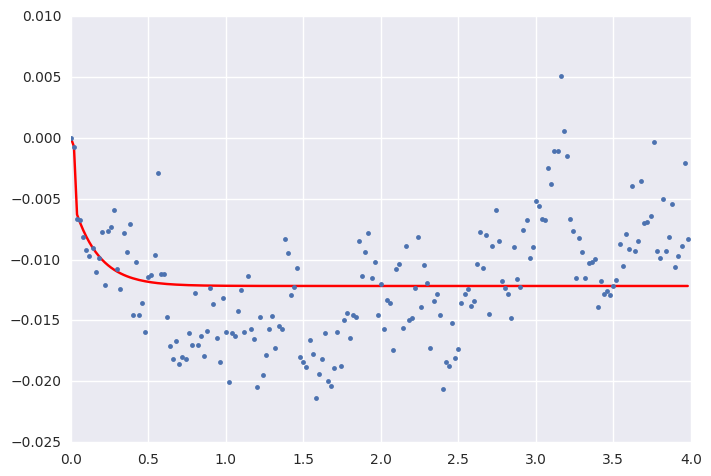

('K1 =', -0.045593928192611273, '+/-', 2297508.9371619741)
('k2 =', 0.0010447935355338931, '+/-', 16270646.681058951)
('tau_1 =', 0.12864290780214926, '+/-', 2297508.9371619741)
('tau_2 =', 2.1151104200129858, '+/-', 16270646.681058951)
('theta =', 3.9600000479215969, '+/-', 16270646.681058951)
muscle
b1_r


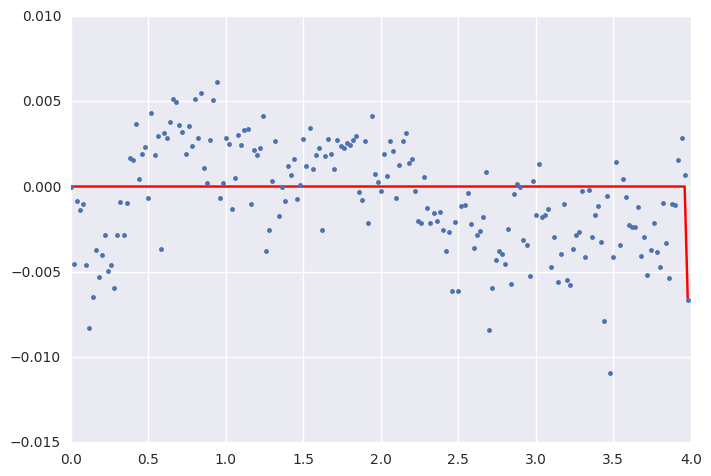

('K1 =', 0.01555680224028347, '+/-', 0.00061239720675505534)
('k2 =', 112.34282517729255, '+/-', 40361.862007997603)
('tau_1 =', 0.31923827778303293, '+/-', 0.00061239720675505534)
('tau_2 =', 35876.608776169865, '+/-', 40361.862007997603)
('theta =', 0.17874419135950026, '+/-', 40361.862007997603)
muscle
b2_r


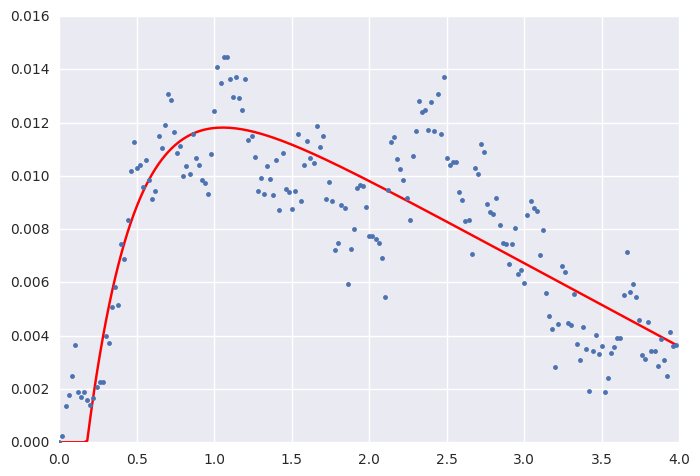

('K1 =', 0.35986143022757511, '+/-', 35.389397555096515)
('k2 =', 0.40346221368061658, '+/-', 35.384951662975595)
('tau_1 =', 0.96621303692153304, '+/-', 35.389397555096515)
('tau_2 =', 1.0831330253510949, '+/-', 35.384951662975595)
('theta =', -0.31554671292748682, '+/-', 35.384951662975595)
muscle
b3_r


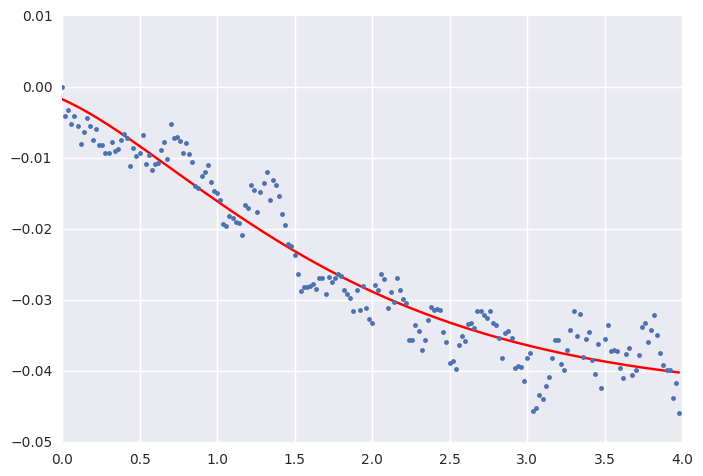

('K1 =', 0.10306938401259859, '+/-', 803.12286906364955)
('k2 =', 0.14712132515637566, '+/-', 803.12240413636152)
('tau_1 =', 0.43276152192257528, '+/-', 803.12286906364955)
('tau_2 =', 0.44669447798838507, '+/-', 803.12240413636152)
('theta =', 0.032706253745647458, '+/-', 803.12240413636152)
muscle
i1_r


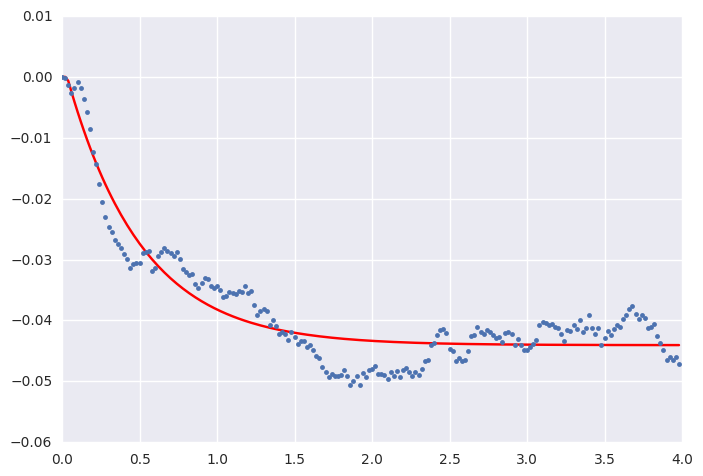

('K1 =', 0.0063702368920097287, '+/-', 1456.4182126719106)
('k2 =', 0.043375132762348161, '+/-', 1456.4182110447241)
('tau_1 =', 0.00084262624794185907, '+/-', 1456.4182126719106)
('tau_2 =', 0.57480008074448063, '+/-', 1456.4182110447241)
('theta =', 0.099655908462404574, '+/-', 1456.4182110447241)
muscle
i2_r


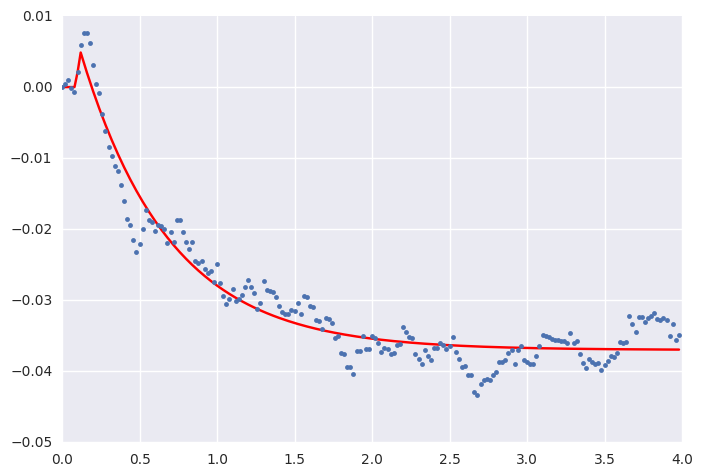

('K1 =', 261.79491003087531, '+/-', 19054.6506642473)
('k2 =', 79.92258707938548, '+/-', 21624.266795322357)
('tau_1 =', 474.20943350187895, '+/-', 19054.6506642473)
('tau_2 =', 143.4042774012041, '+/-', 21624.266795322357)
('theta =', -0.38069719937646684, '+/-', 21624.266795322357)
muscle
iii1_r


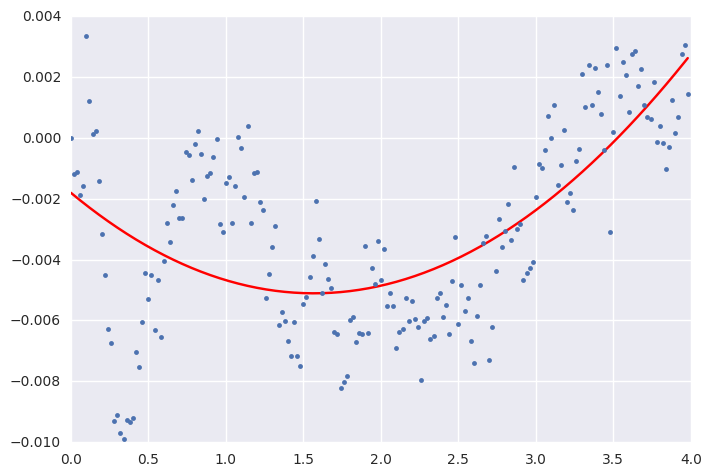

('K1 =', 55.982713593566963, '+/-', 30149.891767781166)
('k2 =', 185.71146664214149, '+/-', 18427.788351474137)
('tau_1 =', 121.49747706051174, '+/-', 30149.891767781166)
('tau_2 =', 409.68274406560062, '+/-', 18427.788351474137)
('theta =', -0.32471199193123279, '+/-', 18427.788351474137)
muscle
iii3_r


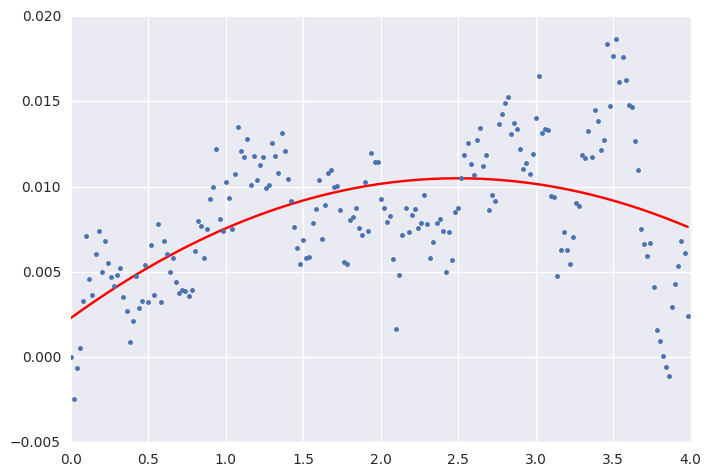

('K1 =', -0.006203207001778446, '+/-', 0.0029299091432900301)
('k2 =', 0.0152124291009769, '+/-', 0.0030616632368428822)
('tau_1 =', 0.55786899245920052, '+/-', 0.0029299091432900301)
('tau_2 =', 0.07141746106490629, '+/-', 0.0030616632368428822)
('theta =', 0.093914240659218343, '+/-', 0.0030616632368428822)
muscle
hg1_r


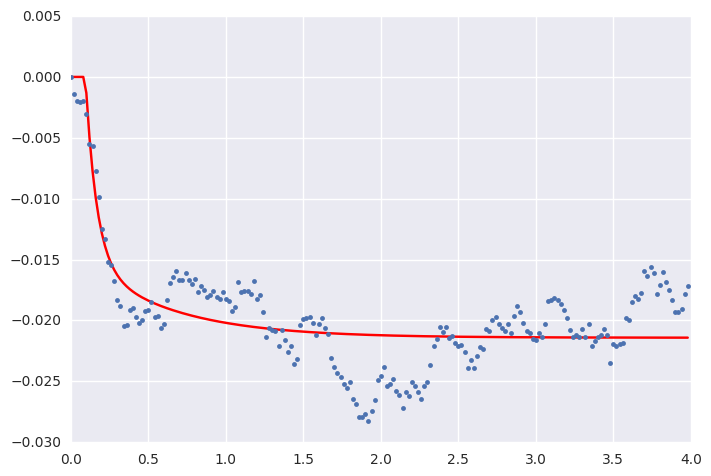

('K1 =', 0.039012193290309485, '+/-', 0.000951696116249727)
('k2 =', 0.0077097801729442382, '+/-', 0.0010528644514184772)
('tau_1 =', 1.3701950871507675, '+/-', 0.000951696116249727)
('tau_2 =', 0.014943445560122897, '+/-', 0.0010528644514184772)
('theta =', 0.17163963146152597, '+/-', 0.0010528644514184772)
muscle
hg2_r


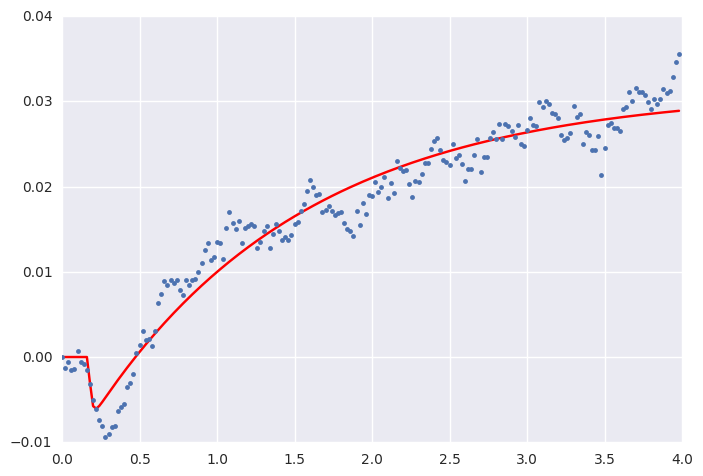

('K1 =', 94.53757763912725, '+/-', 47255.462359260571)
('k2 =', 30.487412558566444, '+/-', 35339.360457038674)
('tau_1 =', 596.79880413693411, '+/-', 47255.462359260571)
('tau_2 =', 186.1111506029211, '+/-', 35339.360457038674)
('theta =', -18.078189120025588, '+/-', 35339.360457038674)
muscle
hg3_r


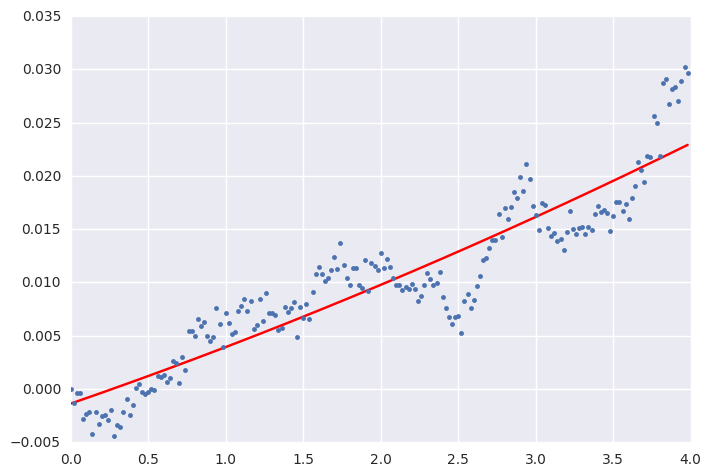

('K1 =', 0.10368369668394004, '+/-', 20.661322084246354)
('k2 =', 0.15212355516200493, '+/-', 20.677991085169165)
('tau_1 =', 1.3458368145749522, '+/-', 20.661322084246354)
('tau_2 =', 1.9744921102363955, '+/-', 20.677991085169165)
('theta =', 0.45690687476494635, '+/-', 20.677991085169165)
muscle
hg4_r


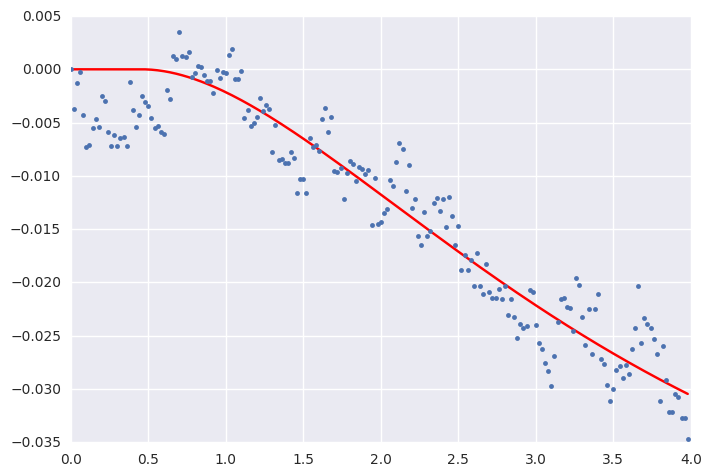

In [89]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_rcc = pd.DataFrame()
stimulus = roll_ccw_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_rcc = stimulus_df_rcc.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_rcc.to_csv('roll_ccw_constants_theta.csv') 

('K1 =', 0.018366905613901634, '+/-', 3223.8695701770621)
('k2 =', 0.00046382727571806241, '+/-', 3223.8692128929224)
('tau_1 =', 0.5585334799201932, '+/-', 3223.8695701770621)
('tau_2 =', 0.00025056316027476875, '+/-', 3223.8692128929224)
('theta =', 0.17780138632815029, '+/-', 3223.8692128929224)
muscle
b1_l


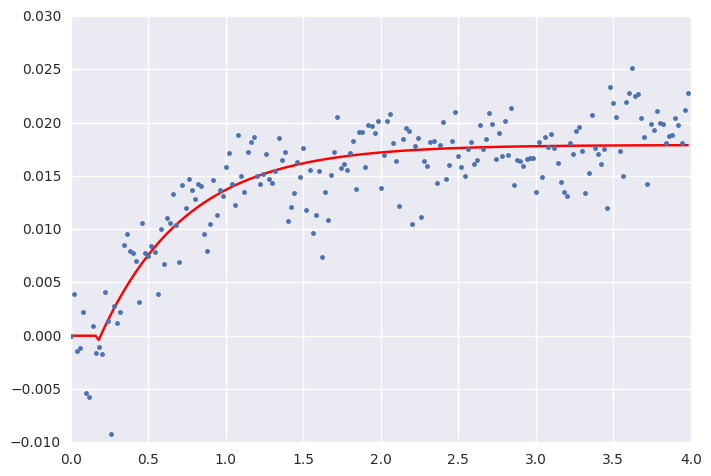

('K1 =', 0.042549630797437857, '+/-', 0.20654767989946612)
('k2 =', 0.32106189617047748, '+/-', 12.8617093094532)
('tau_1 =', 1.855363678627431, '+/-', 0.20654767989946612)
('tau_2 =', 37.853241618497485, '+/-', 12.8617093094532)
('theta =', 0.063026539445666718, '+/-', 12.8617093094532)
muscle
b2_l


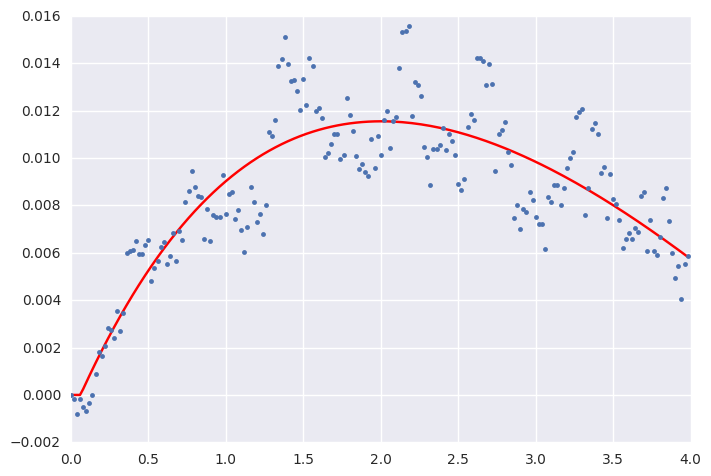

('K1 =', -0.057609127343728285, '+/-', 0.01321018941008064)
('k2 =', 0.017322802034510244, '+/-', 0.007102404134093453)
('tau_1 =', 3.5776345788244148, '+/-', 0.01321018941008064)
('tau_2 =', 0.33757850428234043, '+/-', 0.007102404134093453)
('theta =', 0.31271601234246066, '+/-', 0.007102404134093453)
muscle
b3_l


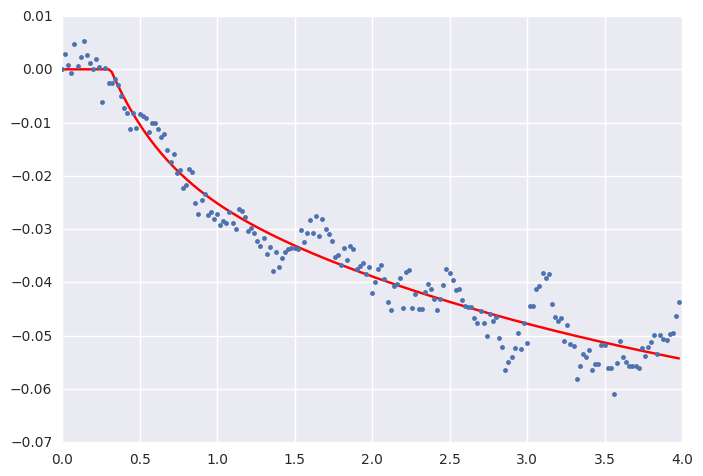

('K1 =', 1.6605000727763388, '+/-', 4616.1217460257767)
('k2 =', 1.7051148512104626, '+/-', 4616.1221855955819)
('tau_1 =', 0.39771698953791357, '+/-', 4616.1217460257767)
('tau_2 =', 0.39061952111694653, '+/-', 4616.1221855955819)
('theta =', 0.16701964881320308, '+/-', 4616.1221855955819)
muscle
i1_l


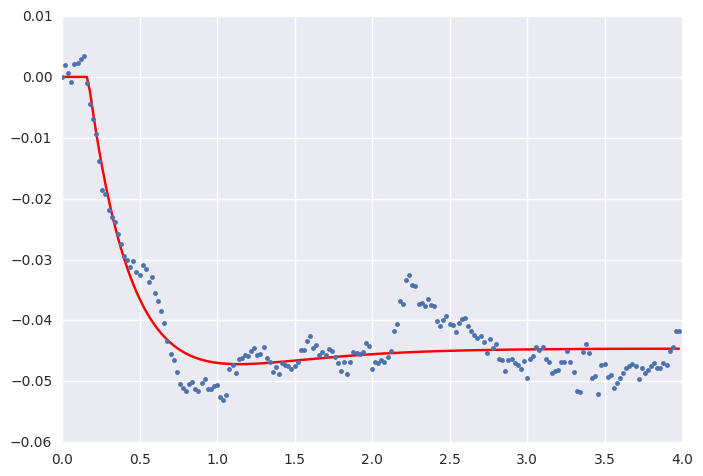

('K1 =', -0.029513374895322811, '+/-', 0.0010405196225724382)
('k2 =', 62.412689875487615, '+/-', 113608.37069119987)
('tau_1 =', 0.20845581952493811, '+/-', 0.0010405196225724382)
('tau_2 =', 30426.730550655902, '+/-', 113608.37069119987)
('theta =', 0.23508156201467886, '+/-', 113608.37069119987)
muscle
i2_l


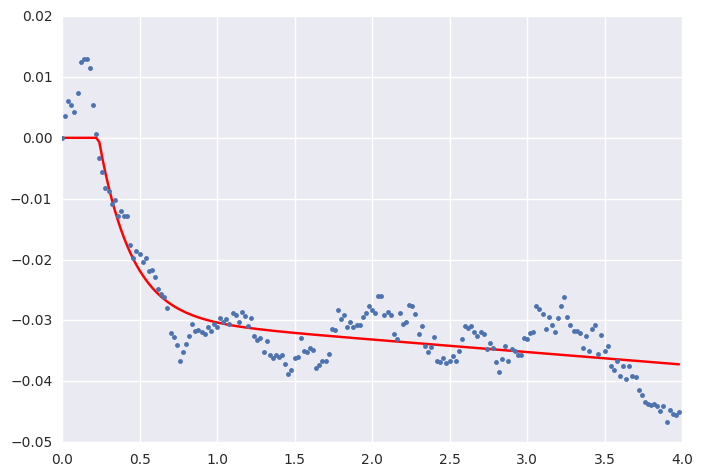

('K1 =', -0.01427568534898295, '+/-', 0.0025562751537549729)
('k2 =', -0.040617328000506103, '+/-', 0.016507068536128908)
('tau_1 =', 0.23677067636130864, '+/-', 0.0025562751537549729)
('tau_2 =', 5.1287167305250367, '+/-', 0.016507068536128908)
('theta =', 0.15332577145535864, '+/-', 0.016507068536128908)
muscle
iii1_l


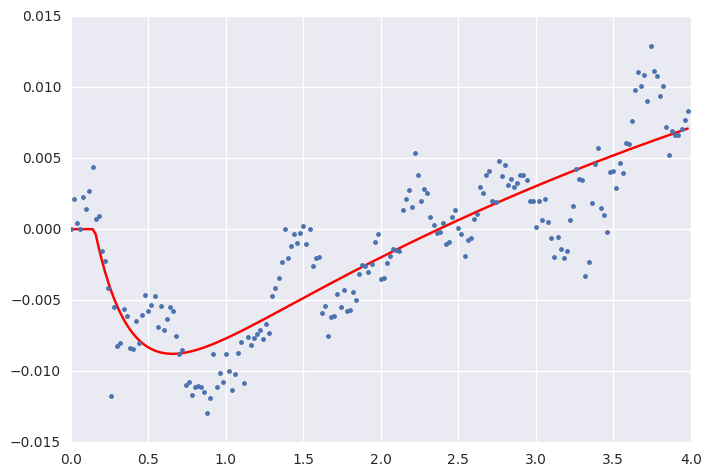

('K1 =', 0.01374289479535796, '+/-', 0.040443298257660042)
('k2 =', 0.011438000778943698, '+/-', 0.047282484488244049)
('tau_1 =', 1.6303034698589227, '+/-', 0.040443298257660042)
('tau_2 =', 0.50685188443399098, '+/-', 0.047282484488244049)
('theta =', 0.17999968838744831, '+/-', 0.047282484488244049)
muscle
iii3_l


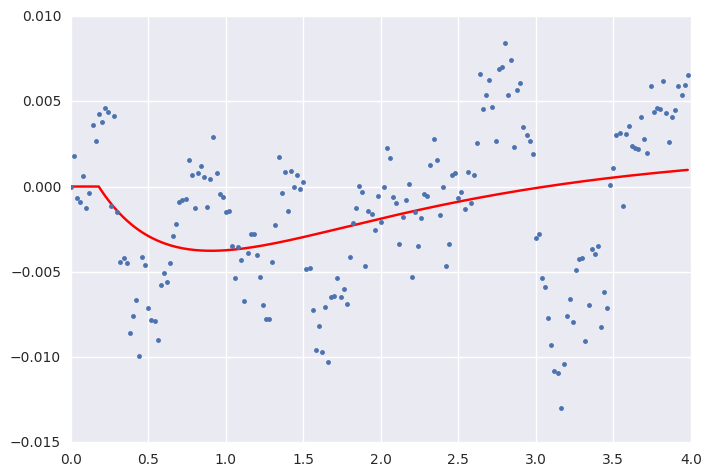

('K1 =', -0.055791487423478385, '+/-', 0.032445327381870455)
('k2 =', -0.041719575871777839, '+/-', 0.031747926350917791)
('tau_1 =', 0.33244797654685337, '+/-', 0.032445327381870455)
('tau_2 =', 0.81524636866357625, '+/-', 0.031747926350917791)
('theta =', 0.16687117628504164, '+/-', 0.031747926350917791)
muscle
hg1_l


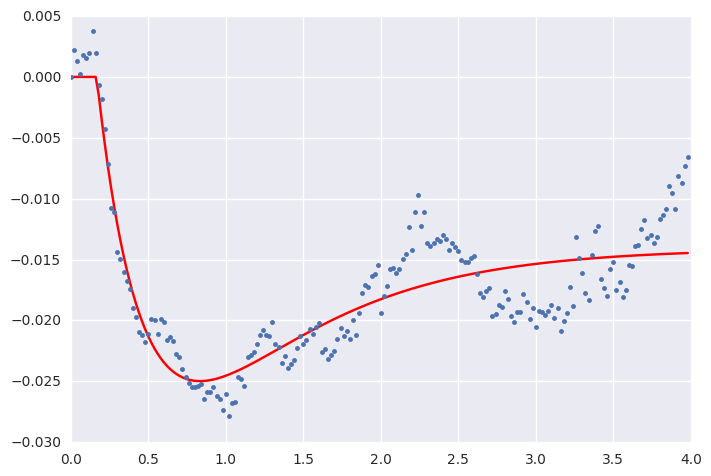

('K1 =', 0.10674738475273526, '+/-', 0.019589696124435698)
('k2 =', 0.0094180310294424054, '+/-', 0.0210293882216313)
('tau_1 =', 4.5481683559729946, '+/-', 0.019589696124435698)
('tau_2 =', 0.37974531372080461, '+/-', 0.0210293882216313)
('theta =', 0.13999970324665639, '+/-', 0.0210293882216313)
muscle
hg2_l


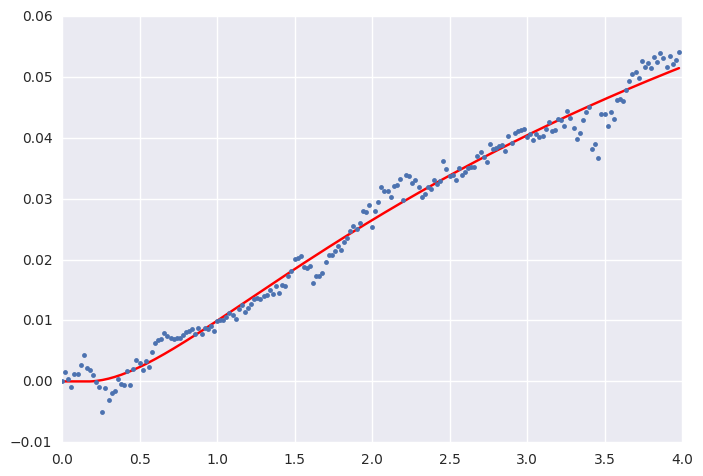

('K1 =', 774.73220682122212, '+/-', 48814.905733476662)
('k2 =', -0.018195800152706762, '+/-', 0.001406206793687333)
('tau_1 =', 34328.107914892586, '+/-', 48814.905733476662)
('tau_2 =', 0.60170023816043861, '+/-', 0.001406206793687333)
('theta =', 0.26875085323332371, '+/-', 0.001406206793687333)
muscle
hg3_l


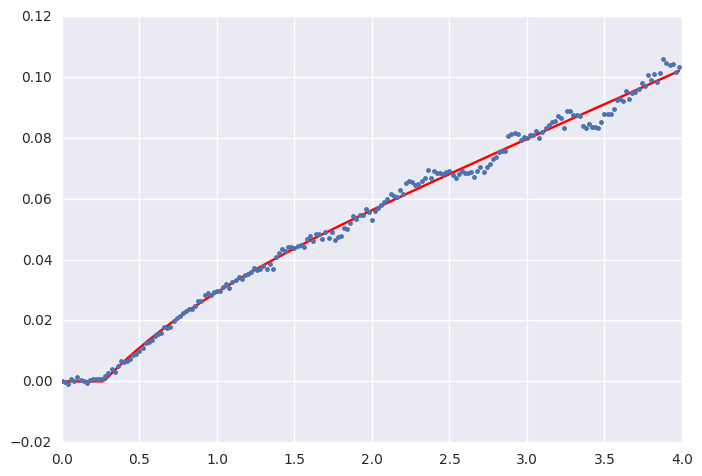

('K1 =', 0.12399972458411934, '+/-', 258.90153258183705)
('k2 =', 0.12419023509676083, '+/-', 258.88246968743437)
('tau_1 =', 1.2498762731885351, '+/-', 258.90153258183705)
('tau_2 =', 1.3734481793032791, '+/-', 258.88246968743437)
('theta =', -0.46286135590214711, '+/-', 258.88246968743437)
muscle
hg4_l


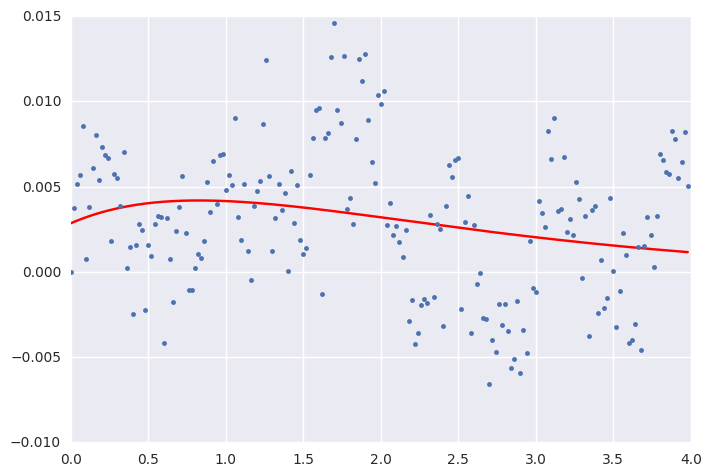

('K1 =', -0.0039117345800113324, '+/-', 0.0010170998579076599)
('k2 =', 0.020404463858696768, '+/-', 0.0013738463123403961)
('tau_1 =', 0.031312336400002069, '+/-', 0.0010170998579076599)
('tau_2 =', 1.9636251531552378, '+/-', 0.0013738463123403961)
('theta =', 0.030760617608691521, '+/-', 0.0013738463123403961)
muscle
b1_r


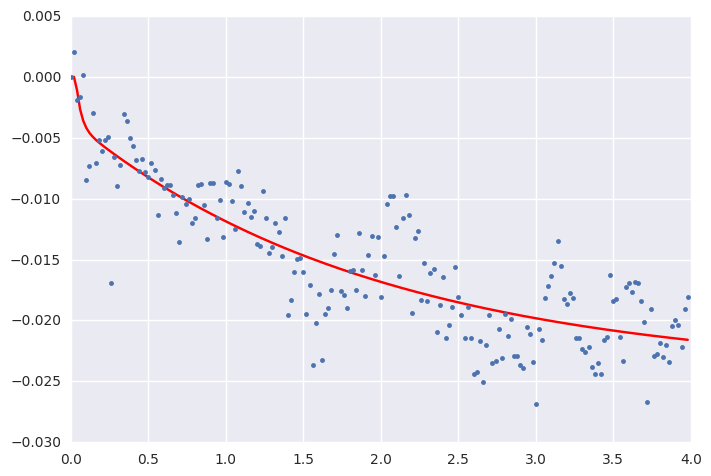

('K1 =', 0.0018080708750457598, '+/-', 0.0015816098340675829)
('k2 =', 0.026163928917087111, '+/-', 0.0015342945768747802)
('tau_1 =', 0.068207752500807475, '+/-', 0.0015816098340675829)
('tau_2 =', 1.9581426949410277, '+/-', 0.0015342945768747802)
('theta =', 0.39885870169240112, '+/-', 0.0015342945768747802)
muscle
b2_r


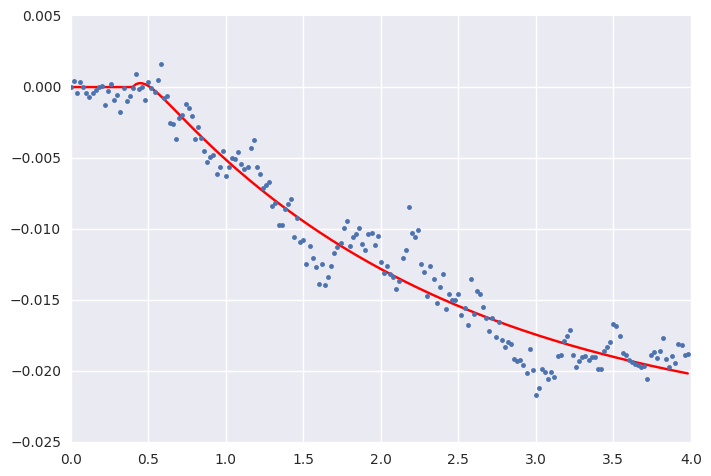

('K1 =', 0.05789687957107334, '+/-', 140583.15298796495)
('k2 =', 0.033337613849513816, '+/-', 140583.15126670181)
('tau_1 =', 2.3998463693229892, '+/-', 140583.15298796495)
('tau_2 =', 2.4002613286755277, '+/-', 140583.15126670181)
('theta =', -0.46058125739623085, '+/-', 140583.15126670181)
muscle
b3_r


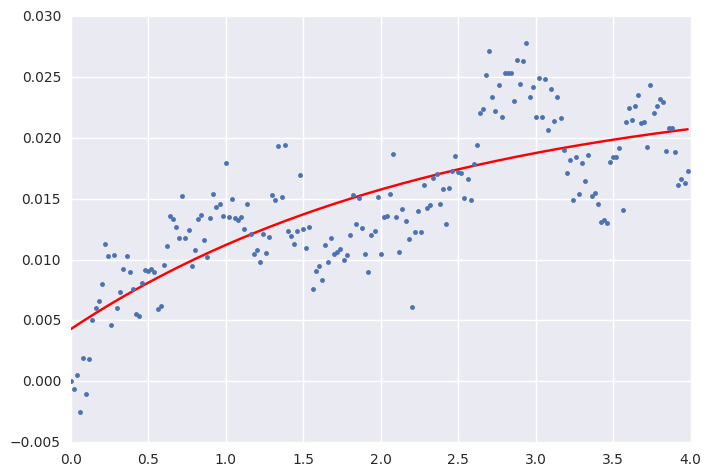

('K1 =', 12.131572608270307, '+/-', 27183.068420065563)
('k2 =', 12.028062165511971, '+/-', 27183.072087791526)
('tau_1 =', 0.84796755697920001, '+/-', 27183.068420065563)
('tau_2 =', 0.83732544269691922, '+/-', 27183.072087791526)
('theta =', 0.073828540206625021, '+/-', 27183.072087791526)
muscle
i1_r


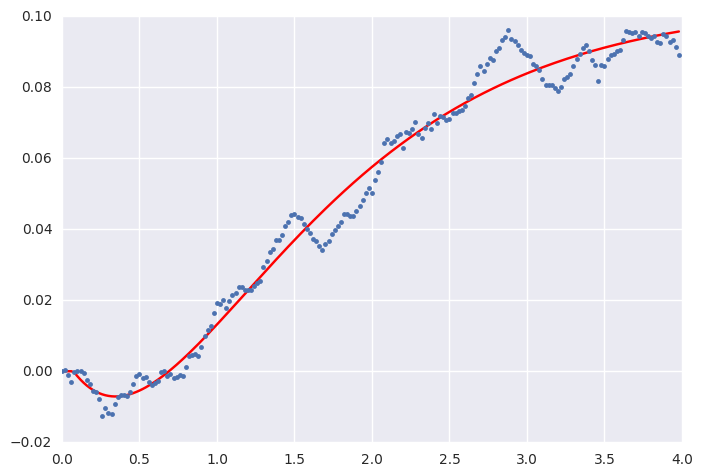

('K1 =', 0.29960312514062271, '+/-', 44052.761822993802)
('k2 =', -0.084213563737251473, '+/-', 44052.753626864469)
('tau_1 =', 4.4135508135361672, '+/-', 44052.761822993802)
('tau_2 =', 4.4126910574378453, '+/-', 44052.753626864469)
('theta =', 0.28065821637882454, '+/-', 44052.753626864469)
muscle
i2_r


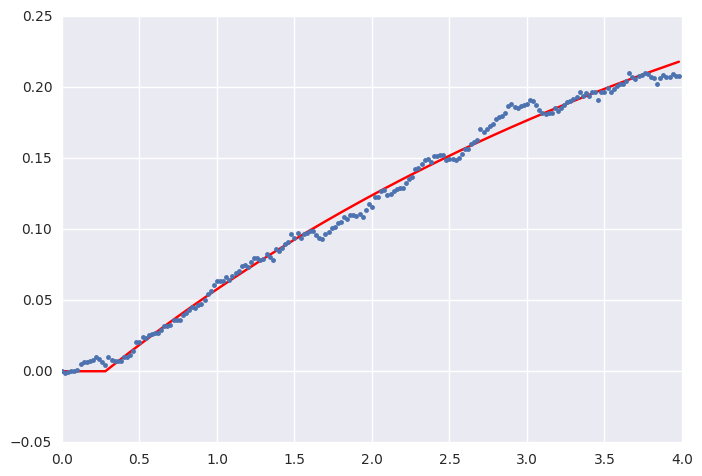

('K1 =', -0.0072613368841728584, '+/-', 0.00064505398299750005)
('k2 =', -0.018183057665939844, '+/-', 0.012651892601128287)
('tau_1 =', 0.036227143988126334, '+/-', 0.00064505398299750005)
('tau_2 =', 6.3256031706313642, '+/-', 0.012651892601128287)
('theta =', 0.15108417905054566, '+/-', 0.012651892601128287)
muscle
iii1_r


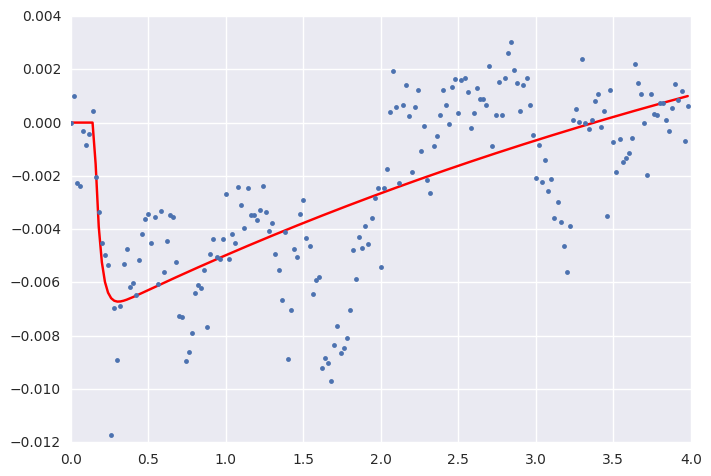

('K1 =', 0.01489984860793743, '+/-', 0.0022595064789656776)
('k2 =', 0.057881093129331485, '+/-', 0.0019733581415050595)
('tau_1 =', 0.044391311960222245, '+/-', 0.0022595064789656776)
('tau_2 =', 1.0305464147317176, '+/-', 0.0019733581415050595)
('theta =', 0.13433925022000814, '+/-', 0.0019733581415050595)
muscle
iii3_r


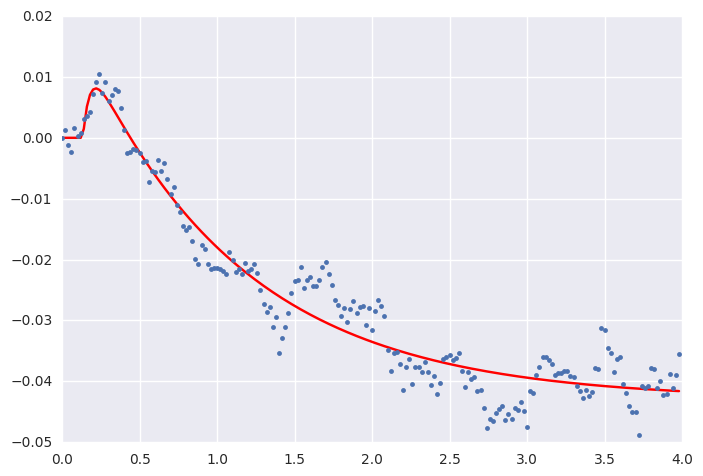

('K1 =', -0.017899623570753389, '+/-', 0.0054330087033476922)
('k2 =', -0.058341726310370705, '+/-', 0.0029455650872893266)
('tau_1 =', 0.25985594226940095, '+/-', 0.0054330087033476922)
('tau_2 =', 2.4503972685675466, '+/-', 0.0029455650872893266)
('theta =', 0.13248767309050125, '+/-', 0.0029455650872893266)
muscle
hg1_r


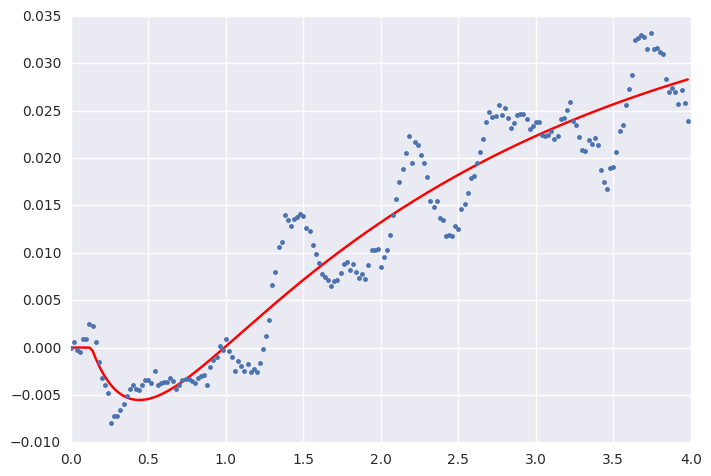

('K1 =', 0.58183297249552079, '+/-', 23.056527056169973)
('k2 =', 0.51215294531147237, '+/-', 23.0611848631487)
('tau_1 =', 1.0663840299300469, '+/-', 23.056527056169973)
('tau_2 =', 0.93880490758871582, '+/-', 23.0611848631487)
('theta =', 0.019154835457226165, '+/-', 23.0611848631487)
muscle
hg2_r


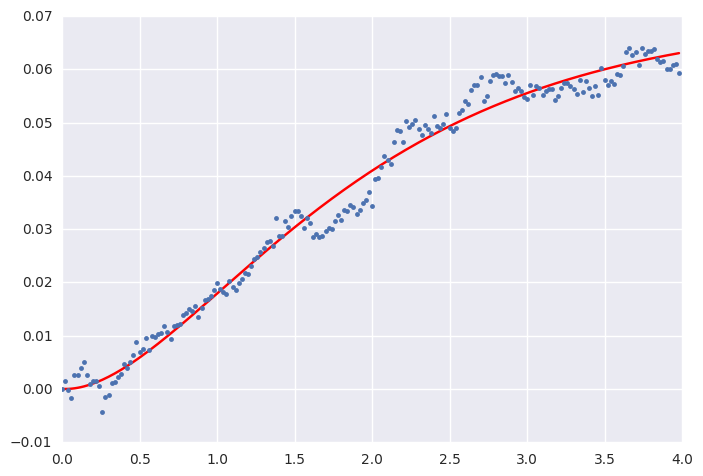

('K1 =', 0.54549166748808886, '+/-', 1717.4124419734185)
('k2 =', 0.5315125776299463, '+/-', 1717.5510931668716)
('tau_1 =', 3.0339078327335738, '+/-', 1717.4124419734185)
('tau_2 =', 2.8306144427026583, '+/-', 1717.5510931668716)
('theta =', -0.23215722801330019, '+/-', 1717.5510931668716)
muscle
hg3_r


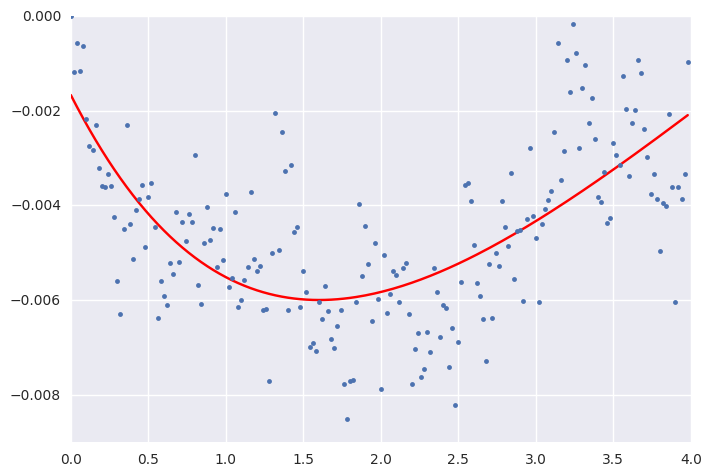

('K1 =', -0.011618277493688137, '+/-', 0.010246274497661974)
('k2 =', 0.015107752044615032, '+/-', 0.0051224753377653864)
('tau_1 =', 3.7664043526814797, '+/-', 0.010246274497661974)
('tau_2 =', 0.32366910493855749, '+/-', 0.0051224753377653864)
('theta =', 0.072950439432842698, '+/-', 0.0051224753377653864)
muscle
hg4_r


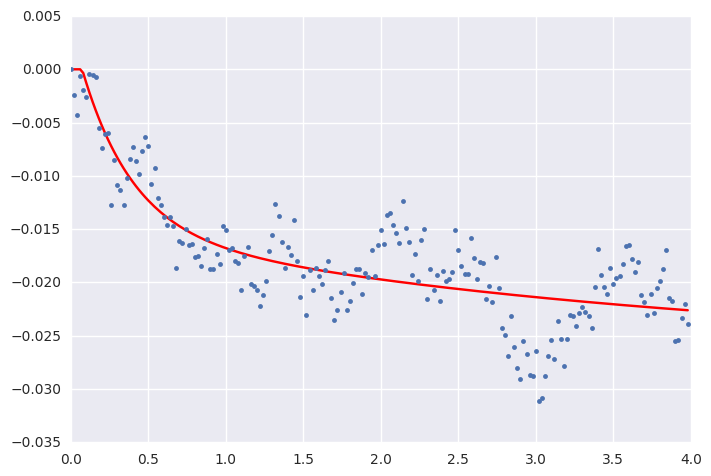

In [90]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df_rc = pd.DataFrame()
stimulus = roll_cw_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]   #from 150
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9, 0.1]), maxfev=2000000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        stimulus_df_rc = stimulus_df_rc.append(df)
        
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)
        print("theta =", popt[4], "+/-", pcov[1,1]**0.5)
        print('muscle')
        print(muscle)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3], 'theta': popt[4]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        
        #plt.errorbar(x, y, yerr=e, fmt="none")
        #xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(x, exponential_f(x, popt[0], popt[1], popt[2], popt[3], popt[4]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 4.0)
        plt.show()
        
stimulus_df_rc.to_csv('roll_cw_constants_theta.csv') 

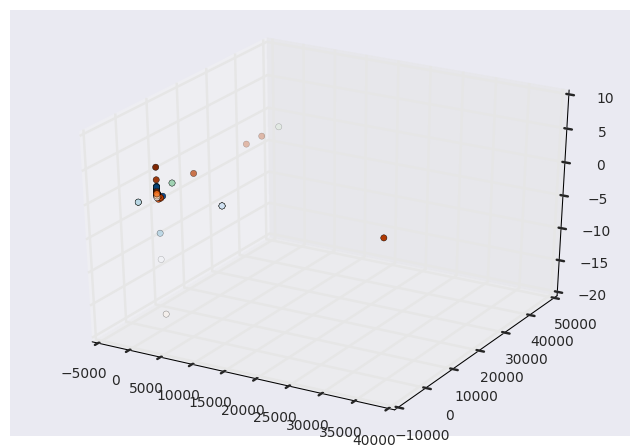

In [94]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']

zdata_yl = stimulus_df_yl['theta']
xdata_yl = stimulus_df_yl['tau1']
ydata_yl = stimulus_df_yl['tau2']
   
zdata_pu = stimulus_df_pu['theta']
xdata_pu = stimulus_df_pu['tau1']
ydata_pu = stimulus_df_pu['tau2']

zdata_pd = stimulus_df_pd['theta']
xdata_pd = stimulus_df_pd['tau1']
ydata_pd = stimulus_df_pd['tau2']

zdata_rcc = stimulus_df_rcc['theta']
xdata_rcc = stimulus_df_rcc['tau1']
ydata_rcc = stimulus_df_rcc['tau2']
  
zdata_rc = stimulus_df_rc['theta']
xdata_rc = stimulus_df_rc['tau1']
ydata_rc = stimulus_df_rc['tau2']

ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.scatter3D(xdata_yl, ydata_yl, zdata_yl, c=zdata_yl, cmap='Greens');
ax.scatter3D(xdata_pu, ydata_pu, zdata_pu, c=zdata_pu, cmap='Blues');
ax.scatter3D(xdata_pd, ydata_pd, zdata_pd, c=zdata_pd, cmap='Blues');
ax.scatter3D(xdata_rc, ydata_rc, zdata_rc, c=zdata_rc, cmap='Oranges');
ax.scatter3D(xdata_rcc, ydata_rcc, zdata_rcc, c=zdata_rcc, cmap='Oranges');
#ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

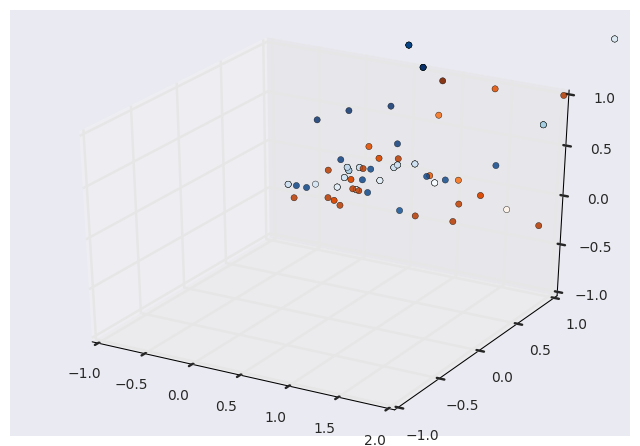

In [96]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']

zdata_yl = stimulus_df_yl['theta']
xdata_yl = stimulus_df_yl['tau1']
ydata_yl = stimulus_df_yl['tau2']
   
zdata_pu = stimulus_df_pu['theta']
xdata_pu = stimulus_df_pu['tau1']
ydata_pu = stimulus_df_pu['tau2']

zdata_pd = stimulus_df_pd['theta']
xdata_pd = stimulus_df_pd['tau1']
ydata_pd = stimulus_df_pd['tau2']

zdata_rcc = stimulus_df_rcc['theta']
xdata_rcc = stimulus_df_rcc['tau1']
ydata_rcc = stimulus_df_rcc['tau2']
  
zdata_rc = stimulus_df_rc['theta']
xdata_rc = stimulus_df_rc['tau1']
ydata_rc = stimulus_df_rc['tau2']

ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.scatter3D(xdata_yl, ydata_yl, zdata_yl, c=zdata_yl, cmap='Greens');
ax.scatter3D(xdata_pu, ydata_pu, zdata_pu, c=zdata_pu, cmap='Blues');
ax.scatter3D(xdata_pd, ydata_pd, zdata_pd, c=zdata_pd, cmap='Blues');
ax.scatter3D(xdata_rc, ydata_rc, zdata_rc, c=zdata_rc, cmap='Oranges');
ax.scatter3D(xdata_rcc, ydata_rcc, zdata_rcc, c=zdata_rcc, cmap='Oranges');
ax.set_xlim(-1, 2); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

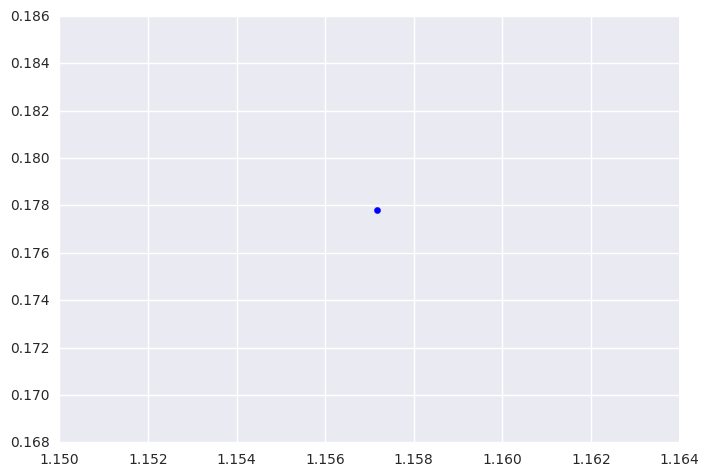

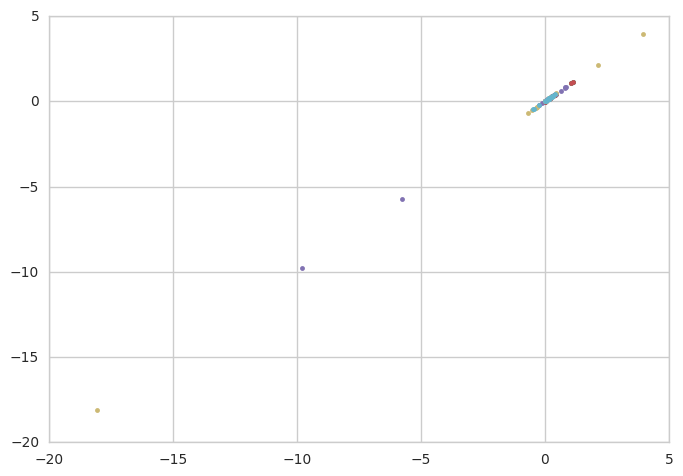

In [129]:
import seaborn as sns, matplotlib.pyplot as plt
sns.set(style="whitegrid")

#tips = sns.load_dataset("tips")

plt.plot(zdata, zdata, '.')
plt.plot(zdata_yl, zdata_yl, '.')
plt.plot(zdata_pu, zdata_pu, '.')
plt.plot(zdata_pd, zdata_pd, '.')
plt.plot(zdata_rcc, zdata_rcc, '.')
plt.plot(zdata_rc, zdata_rc, '.')

plt.show()

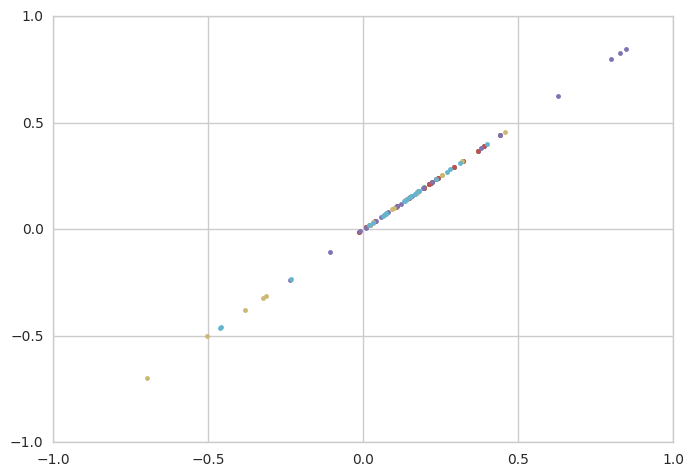

In [132]:
import seaborn as sns, matplotlib.pyplot as plt
sns.set(style="whitegrid")

#tips = sns.load_dataset("tips")

plt.plot(zdata, zdata, '.')
plt.plot(zdata_yl, zdata_yl, '.')
plt.plot(zdata_pu, zdata_pu, '.')
plt.plot(zdata_pd, zdata_pd, '.')
plt.plot(zdata_rcc, zdata_rcc, '.')
plt.plot(zdata_rc, zdata_rc, '.')

plt.xlim(-1,1)
plt.ylim(-1,1)

plt.show()

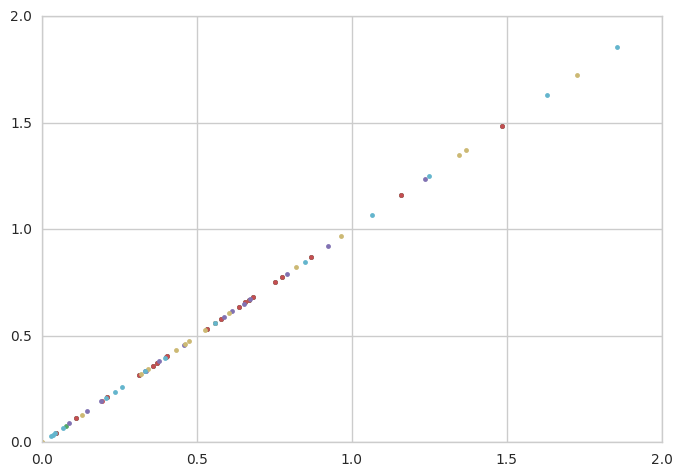

In [134]:
import seaborn as sns, matplotlib.pyplot as plt
sns.set(style="whitegrid")

#tips = sns.load_dataset("tips")

plt.plot(xdata, xdata, '.')
plt.plot(xdata_yl, xdata_yl, '.')
plt.plot(xdata_pu, xdata_pu, '.')
plt.plot(xdata_pd, xdata_pd, '.')
plt.plot(xdata_rcc, xdata_rcc, '.')
plt.plot(xdata_rc, xdata_rc, '.')

plt.xlim(0,2)
plt.ylim(0,2)

plt.show()

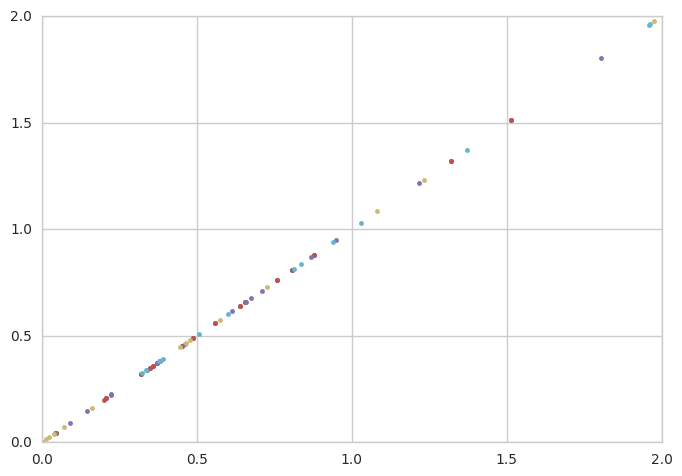

In [136]:
import seaborn as sns, matplotlib.pyplot as plt
sns.set(style="whitegrid")

#tips = sns.load_dataset("tips")

plt.plot(ydata, ydata, '.')
plt.plot(ydata_yl, ydata_yl, '.')
plt.plot(ydata_pu, ydata_pu, '.')
plt.plot(ydata_pd, ydata_pd, '.')
plt.plot(ydata_rcc, ydata_rcc, '.')
plt.plot(ydata_rc, ydata_rc, '.')

plt.xlim(0,2)
plt.ylim(0,2)

plt.show()

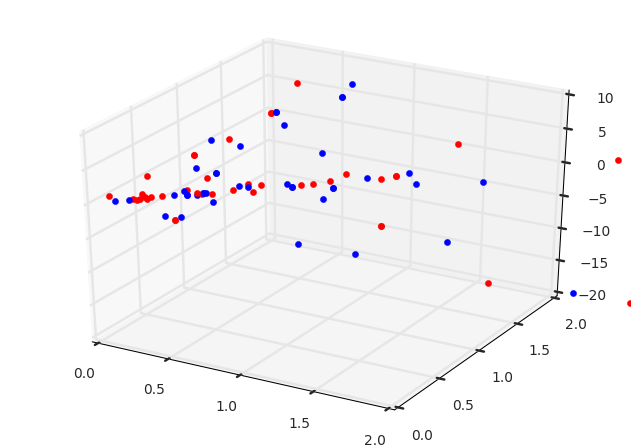

In [190]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
#muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'B', 'B', 'R')

counter = 0
#fig = plt.figure()
ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_yl.ix[counter]['tau1']
    y = stimulus_df_yl.ix[counter]['tau2']
    z = stimulus_df_yl.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pu.ix[counter]['tau1']
    y = stimulus_df_pu.ix[counter]['tau2']
    z = stimulus_df_pu.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1   
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rcc.ix[counter]['tau1']
    y = stimulus_df_rcc.ix[counter]['tau2']
    z = stimulus_df_rcc.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(0,2)
plt.ylim(0,2)
    
plt.show()
 

In [ ]:
 
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]
 
# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)
 
# Visually confirm that the list is correctly sorted by decreasing eigenvalues
 
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
 
plt.figure(4)
plt.bar(range(65), var_exp)
plt.step(range(65), cum_var_exp)
 
#contruct the projection matrix
matrix_w = np.hstack((eig_pairs[0][1].reshape(65,1),
                      eig_pairs[1][1].reshape(65,1)))
 
plt.figure(5)
plt.plot(matrix_w[:,0],'r')
plt.plot(matrix_w[:,1],'b')
 
plt.figure(6)
proj = []
proj1 = []
proj2 =[]
for i in range(len(wv_mtrx)):
    musc_proj = np.dot(wv_mtrx[i], matrix_w)
    proj.append(musc_proj[0])
    proj1.append(musc_proj[1])
    proj2.append(musc_proj)
    plt.scatter(musc_proj[0], musc_proj[1])
 
     
X = np.array(list(zip(proj, proj1)))
 
#%%
from sklearn.cluster import KMeans
 
# Number of clusters
#kmeans = KMeans(n_clusters=2)
#n_clusters=1
n_clusters=2
kmeans = KMeans(n_clusters=2)
# Fitting the input data
kmeans = kmeans.fit(X)
# Getting the cluster labels
labels = kmeans.predict(X)
# Centroid values
centroids = kmeans.cluster_centers_
 
#print(C) 
print(centroids)
 
plt.figure(7)
plt.scatter(X[:, 0], X[:, 1], c=labels)
 
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=200);
 
""" 
test3 = np.argwhere(labels=0)
 
for i in range(len(test3)):
    plt.plot(wv_mtrx[test3[i]])
"""

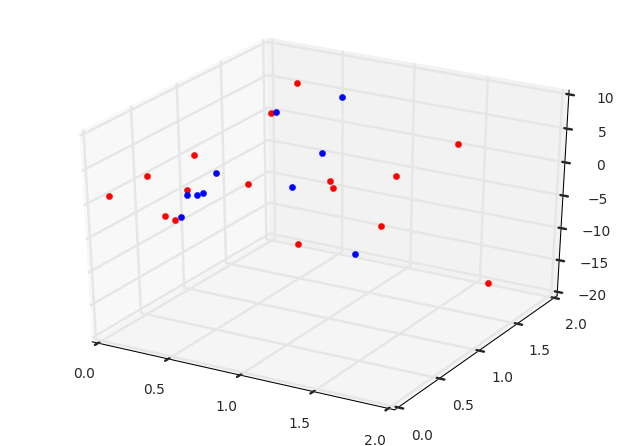

In [173]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
#fig = plt.figure()
ax = plt.axes(projection='3d')
'''
for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
 
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
'''    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0 
'''  
for muscle in muscle_list:
    x = stimulus_df_yl.ix[counter]['tau1']
    y = stimulus_df_yl.ix[counter]['tau2']
    z = stimulus_df_yl.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0

for muscle in muscle_list:
    x = stimulus_df_pu.ix[counter]['tau1']
    y = stimulus_df_pu.ix[counter]['tau2']
    z = stimulus_df_pu.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1   
    
counter = 0
'''    
for muscle in muscle_list:
    x = stimulus_df_rcc.ix[counter]['tau1']
    y = stimulus_df_rcc.ix[counter]['tau2']
    z = stimulus_df_rcc.ix[counter]['theta']
    ax.scatter3D(x, y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1

plt.xlim(0,2)
plt.ylim(0,2)
    
plt.show()
 

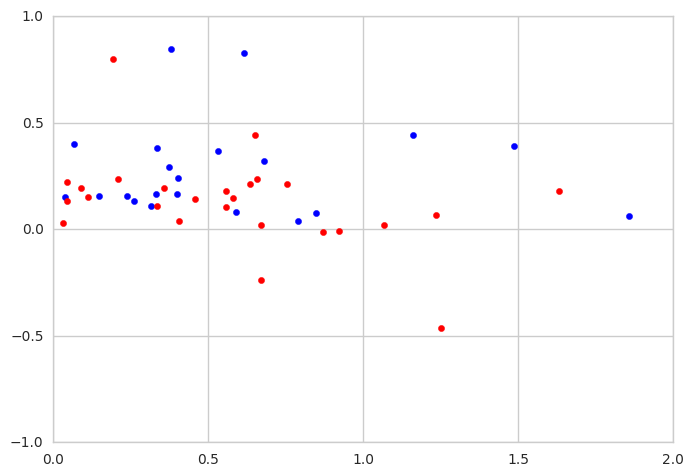

In [158]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()
#ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    plt.scatter(x, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    plt.scatter(x, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    plt.scatter(x, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(0,2)
plt.ylim(-1,1)
    
plt.show()
 

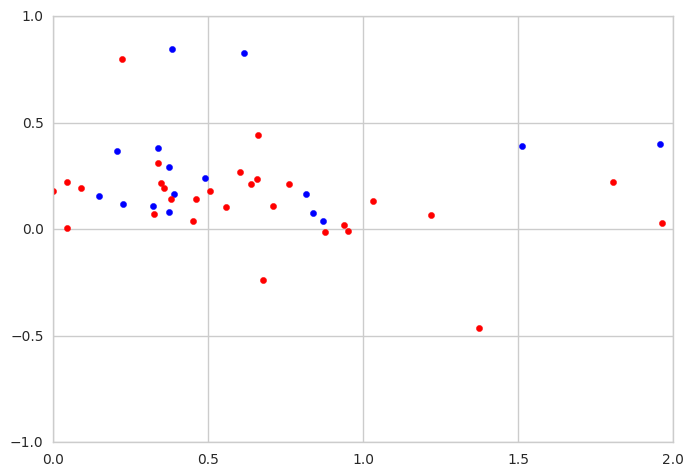

In [157]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()
#ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    plt.scatter(y, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    plt.scatter(y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    plt.scatter(y, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(0,2)
plt.ylim(-1,1)
    
plt.show()

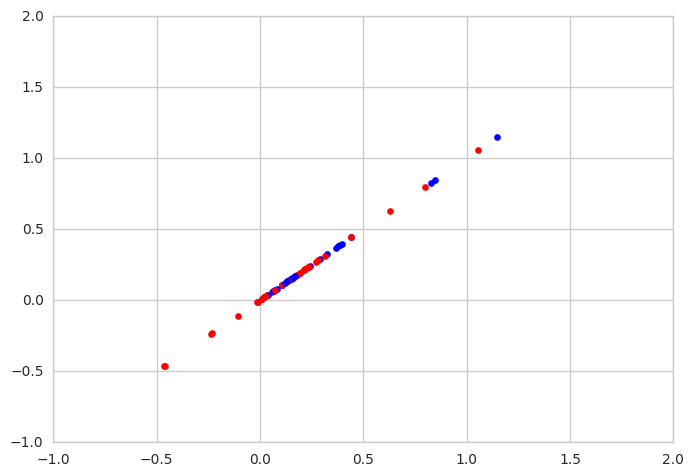

In [159]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()
#ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(-1,2)
plt.ylim(-1,2)
    
plt.show()

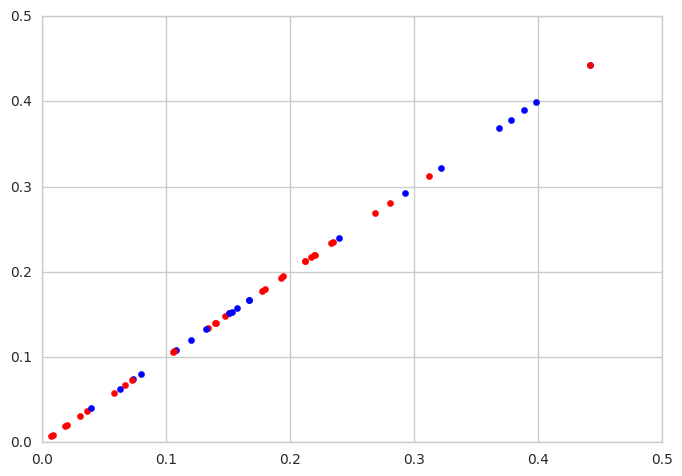

In [160]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()
#ax = plt.axes(projection='3d')

for muscle in muscle_list:
    x = stimulus_df.ix[counter]['tau1']
    y = stimulus_df.ix[counter]['tau2']
    z = stimulus_df.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter])
    counter = counter + 1

counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_pd.ix[counter]['tau1']
    y = stimulus_df_pd.ix[counter]['tau2']
    z = stimulus_df_pd.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
counter = 0
    
for muscle in muscle_list:
    x = stimulus_df_rc.ix[counter]['tau1']
    y = stimulus_df_rc.ix[counter]['tau2']
    z = stimulus_df_rc.ix[counter]['theta']
    plt.scatter(z, z, color = muscle_assign[counter], c=muscle_assign[counter],  marker='o')
    counter = counter + 1
    
plt.xlim(0,0.5)
plt.ylim(0,0.5)
    
plt.show()

In [ ]:
k means clustering 


In [44]:
stimulus_df

,K1,K2,tau1,tau2,theta
b1_l,8.424806,8.434828,0.753682,0.760107,0.212179
b2_l,0.170711,160.826793,1.158846,5041.718268,0.442338
b3_l,-0.026696,0.019087,0.044556,0.044546,0.219965
i1_l,0.566275,0.559610,0.776558,0.808586,1.146668
i2_l,0.014516,0.036724,0.210813,1.320813,1.055320
iii1_l,-0.485640,-0.634675,0.401932,0.489585,0.240000
iii3_l,-0.002948,-0.138132,0.558165,0.558111,0.105494
hg1_l,-1.910955,-1.926845,0.314055,0.321367,0.108340
hg2_l,-0.652496,-0.728606,0.404092,0.451044,0.036135
hg3_l,-0.006678,0.010464,0.668915,4.802201,0.020000


In [48]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

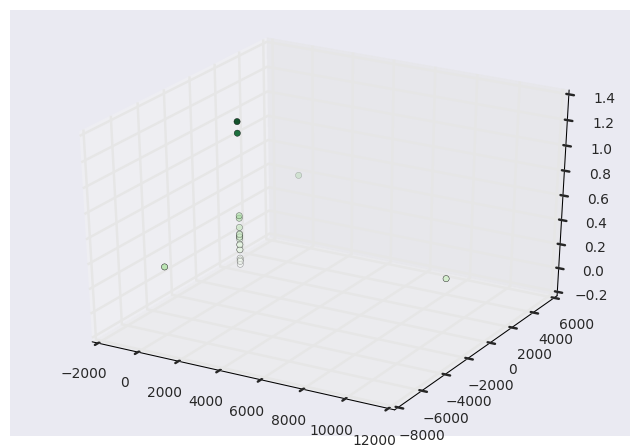

In [77]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
#ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

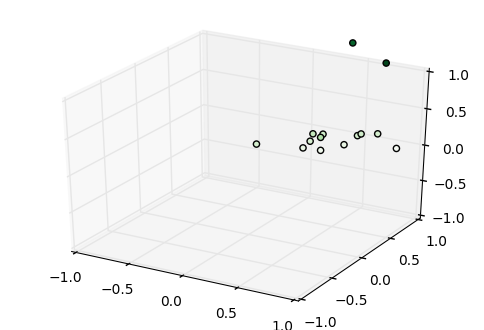

In [57]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

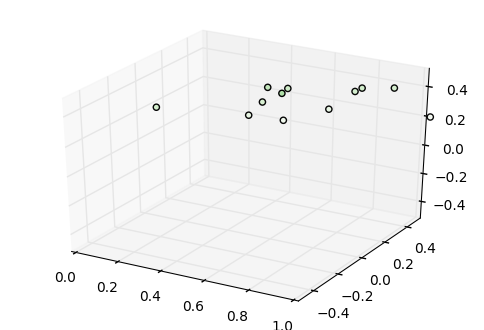

In [69]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.set_xlim(0, 1); ax.set_ylim(-0.5, 0.5); ax.set_zlim(-0.5, 0.5);

#df.apply(ax.annotate(r['x'].astype(str)+'|'+r['y'].astype(str), 
#                                       (r.x*1.02, r.y*1.02)), axis=1)
#for p in ax.scatter3D:
#ax.annotate(str(df.index()), (p.get_x() * 1.005, p.get_height() * 1.005))


plt.show()

In [75]:
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

# Create example dataframe
df = pd.DataFrame


plt.figure(figsize = (15,10))
    
# Data for three-dimensional scattered points
#zdata = stimulus_df['theta']
#xdata = stimulus_df['tau1']
#ydata = stimulus_df['tau2']
   


ax = Axes3D(fig)

# Create scatterplot. alpha controls the opacity and s controls the size.
ax = sns.scatterplot(stimulus_df.theta, stimulus_df.tau1, stimulus_df.tau2, alpha = 0.5)

#ax.set_xlim(0,6)
#ax.set_ylim(-2, 18)
ax.set_xlim(0, 1); ax.set_ylim(-0.5, 0.5); ax.set_zlim(-0.5, 0.5);



#For each point, we add a text inside the bubble
for line in range(0,df.shape[0]):
     ax.text(df.x[line], df.y[line], df.group[line], horizontalalignment='center', size='medium', color='black', weight='semibold')

NameError: name 'fig' is not defined

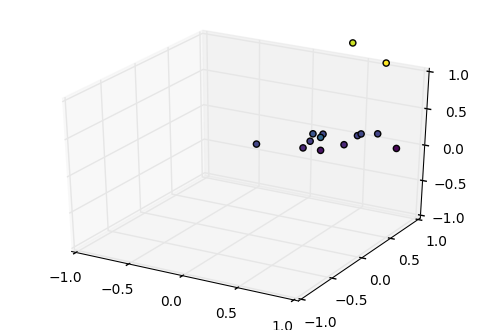

In [60]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
#zline = np.linspace(0, 15, 1000)
#xline = np.sin(zline)
#yline = np.cos(zline)
#ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = stimulus_df['theta']
xdata = stimulus_df['tau1']
ydata = stimulus_df['tau2']
   
  
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='viridis');
ax.set_xlim(-1, 1); ax.set_ylim(-1, 1); ax.set_zlim(-1, 1);
plt.show()

In [472]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = yaw_left_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('yaw_left_constants.csv') 

In [595]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,-1.985592,-2.002658,0.419115,0.422615
b2_l,94.064111,0.034988,11998.690981,0.995744
b3_l,3.386401,3.416485,2.113523,2.170805
i1_l,31.829067,32.060347,2.965705,3.044294
i2_l,45.934457,47.445231,5.519493,5.813105
iii1_l,8.769530,8.707793,0.430701,0.428868
iii3_l,10.656146,10.356165,3.738748,3.552696
hg1_l,-2.078914,-2.175515,0.496254,0.510635
hg2_l,0.137669,0.001795,2.362053,0.055395
hg3_l,592.937763,174.894306,733.928934,221.877069


In [575]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,9.343229,9.359295,1.065784,1.074239
b2_l,2394.611320,8043.843883,261.775049,885.227566
b3_l,24.327530,24.355404,0.617035,0.613712
i1_l,17.050845,17.038317,0.421732,0.420021
i2_l,1.529263,1.596258,2.865755,3.021808
iii1_l,-4952.365291,-1529.090130,578.349441,176.471239
iii3_l,0.068808,-0.068485,0.694531,0.694517
hg1_l,-5.923888,-5.940048,0.372940,0.375674
hg2_l,-14.064042,-14.140168,0.428402,0.430888
hg3_l,-0.008040,45.802124,0.757757,38944.821625


In [609]:
yaw_left_df_c = pd.read_csv('yaw_left_constants.csv')
yaw_right_df_c = pd.read_csv('yaw_right_constants.csv')
pitch_up_df_c = pd.read_csv('pitch_up_constants.csv')
pitch_down_df_c = pd.read_csv('pitch_down_constants.csv')
roll_cw_df_c = pd.read_csv('roll_cw_constants.csv')
roll_ccw_df_c = pd.read_csv('roll_ccw_constants.csv')

In [612]:
yaw_left_df_c .ix[2]

Unnamed: 0         b3_l
K1            0.0517189
K2              61.9298
tau1           0.607986
tau2            9085.66
Name: 2, dtype: object

In [613]:
muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')

In [ ]:

muscle_list = ('b1_l', 'b2_l', 'b3_l', 'i1_l', 'i2_l', 'iii1_l', 'iii3_l', 'hg1_l', 'hg2_l', 'hg3_l', 'hg4_l', 'b1_r', 'b2_r', 'b3_r', 'i1_r', 'i2_r', 'iii1_r', 'iii3_r', 'hg1_r', 'hg2_r', 'hg3_r', 'hg4_r')
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

counter = 0
fig = plt.figure()

for muscle in muscle_list:
    x = yaw_left_df_c.ix[counter]['tau1']
    y = yaw_left_df_c.ix[counter]['tau2']
    plt.scatter(x, y, color = muscle_assign[counter])
    counter = counter + 1
    
plt.show()
 


In [619]:
muscle_assign = ('R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'B', 'R', 'R', 'R')

In [620]:
yaw_left_df_c .ix[2]['K1']

0.051718873994800005

In [491]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = pitch_up_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('pitch_up_constants.csv') 

In [492]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,0.205235,0.185215,0.327820,0.361908
b2_l,46.700512,28.162824,33.071208,19.747714
b3_l,9.361362,9.401952,0.198410,0.199852
i1_l,12.656147,12.590547,1.132028,1.112830
i2_l,46.550533,46.430883,0.614470,0.611863
iii1_l,258.586391,0.052470,18732.329418,1.377377
iii3_l,2.413915,2.396302,0.115434,0.114352
hg1_l,599.261508,0.046442,40022.609971,0.433032
hg2_l,0.114192,0.015395,3.018998,0.277060
hg3_l,0.026808,0.009287,2.834748,0.152392


In [485]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = pitch_down_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('pitch_down_constants.csv') 

In [486]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = roll_cw_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('roll_cw_constants.csv') 

In [488]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,0.025318,0.007358,0.568736,0.064545
b2_l,0.894813,0.976394,4.418486,5.149921
b3_l,0.008012,0.065276,0.053992,1.516629
i1_l,0.687177,0.731370,0.666405,0.639275
i2_l,0.106482,0.140602,0.119202,0.223458
iii1_l,-0.023645,-0.038926,0.541919,2.594354
iii3_l,-0.006539,-21.920181,0.592670,10591.506433
hg1_l,-4.310735,-4.298330,0.770281,0.777466
hg2_l,0.110436,0.013462,4.485289,0.442811
hg3_l,0.210948,0.006153,5.675533,0.077954


In [489]:
#stimulus_df = pd.DataFrame({'K1':0,'K2': 0, 'tau1': 0, 'tau2': 0},
#                  index=[0])
stimulus_df = pd.DataFrame()
stimulus = roll_ccw_df

for muscle in muscle_list: 
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.1,0.1,0.25,0.9]), maxfev=200000)
        
        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        stimulus_df = stimulus_df.append(df)
        '''
        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        '''
stimulus_df.to_csv('roll_ccw_constants.csv') 

In [490]:
stimulus_df

,K1,K2,tau1,tau2
b1_l,0.012009,0.023367,0.183740,0.183723
b2_l,2.677458,2.678640,0.678072,0.681881
b3_l,-0.669515,-0.686639,0.396503,0.402516
i1_l,0.109209,-0.055562,8.084913,8.087457
i2_l,0.115459,0.013369,3.025123,0.219073
iii1_l,0.643082,0.645505,0.202292,0.198750
iii3_l,9.451668,9.516070,0.745320,0.751404
hg1_l,2.960754,2.947005,0.903509,0.886478
hg2_l,0.027460,0.010930,0.573293,0.098697
hg3_l,-0.003980,4.137972,0.835042,17606.683234


('K1 =', 562.21322257154168, '+/-', 19784097.590519726)
('k2 =', -608.28125837615016, '+/-', 18882888.306884415)
('tau_1 =', 56506.299055044408, '+/-', 19784097.590519726)
('tau_2 =', 53937.179906925347, '+/-', 18882888.306884415)


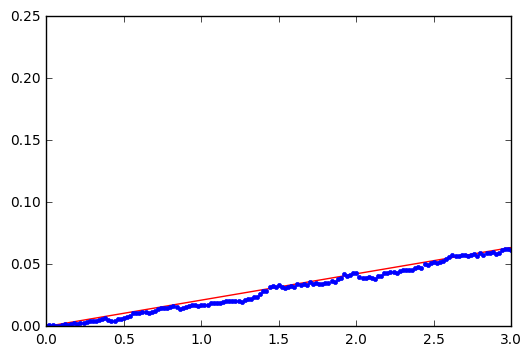

In [566]:
        stimulus = yaw_left_df
        muscle = 'hg3_l'
        
        times = np.arange(350)*0.02
        colors = times[150:350]
        x1 = times[150:350]
        x=x1-x1[0]
        muscle_choice = stimulus[muscle]
        y = muscle_choice[150:350]-muscle_choice[150]
        
        popt, pcov = curve_fit(exponential_f, x, y, p0=np.asarray([0.01,0.07,0.25,0.9]), maxfev=20000)

        print("K1 =", popt[0], "+/-", pcov[0,0]**0.5)
        print("k2 =", popt[1], "+/-", pcov[1,1]**0.5)
        print("tau_1 =", popt[2], "+/-", pcov[0,0]**0.5)
        print("tau_2 =", popt[3], "+/-", pcov[1,1]**0.5)

        df =pd.DataFrame({'K1': popt[0],'K2': popt[1], 'tau1': popt[2], 'tau2': popt[3]},
                  index=[muscle])
        #df =pd.DataFrame
    
        df_1.append(df)
        #plt.errorbar(x, y, yerr=e, fmt="none")
        xfine = np.linspace(0.01, 10., 200)  # define values to plot the function for
        plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
        plt.plot(x, y, '.')
        plt.xlim(0, 3)
        plt.show()
        

,K1,K2,tau1,tau2
hg4_r,-0.024967,250.059794,0.298686,20268.66756


In [513]:
#from thllib import flylib as flb
from matplotlib import pyplot as plt
import numpy as np
import scipy
#from thllib import util
import figurefirst as fifi
import scipy.signal
import local_project_functions as lpf
from IPython.display import SVG,display
import networkx as nx


import flylib as flb
#from thllib import flylib as flb
import flylib as flb
from matplotlib import pyplot as plt
import numpy as np
import scipy
from flylib import util
import figurefirst as fifi
import scipy.signal
import local_project_functions as lpf
from IPython.display import SVG,display
import pandas as pd
import networkx as nx

from scipy.stats import norm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt

In [495]:
#yaw_right_data_avgs = 


yr_b1l = np.median(yaw_right_df['b1_l'][150:350])
yr_b2l =  np.median(yaw_right_df['b2_l'][150:350])
yr_b3l =  np.median(yaw_right_df['b3_l'][150:350])
yr_i1l =  np.median(yaw_right_df['i1_l'][150:350])
yr_i2l =  np.median(yaw_right_df['i2_l'][150:350])
yr_iii1l =  np.median(yaw_right_df['iii1_l'][150:350])
yr_iii3l =  np.median(yaw_right_df['iii3_l'][150:350])
yr_hg1l =  np.median(yaw_right_df['hg1_l'][150:350])
yr_hg2l =  np.median(yaw_right_df['hg2_l'][150:350])
yr_hg3l =  np.median(yaw_right_df['hg3_l'][150:350])
yr_hg4l =  np.median(yaw_right_df['hg4_l'][150:350])
yr_b1r =  np.median(yaw_right_df['b1_r'][150:350])
yr_b2r =  np.median(yaw_right_df['b2_r'][150:350])
yr_b3r =  np.median(yaw_right_df['b3_r'][150:350])
yr_i1r =  np.median(yaw_right_df['i1_r'][150:350])
yr_i2r =  np.median(yaw_right_df['i2_r'][150:350])
yr_iii1r =  np.median(yaw_right_df['iii1_r'][150:350])
yr_iii3r =  np.median(yaw_right_df['iii3_r'][150:350])
yr_hg1r =  np.median(yaw_right_df['hg1_r'][150:350])
yr_hg2r =  np.median(yaw_right_df['hg2_r'][150:350])
yr_hg3r =  np.median(yaw_right_df['hg3_r'][150:350])
yr_hg4r =  np.median(yaw_right_df['hg4_r'][150:350])


yl_b1l = np.median(yaw_left_df['b1_l'][150:350])
yl_b2l =  np.median(yaw_left_df['b2_l'][150:350])
yl_b3l =  np.median(yaw_left_df['b3_l'][150:350])
yl_i1l =  np.median(yaw_left_df['i1_l'][150:350])
yl_i2l =  np.median(yaw_left_df['i2_l'][150:350])
yl_iii1l =  np.median(yaw_left_df['iii1_l'][150:350])
yl_iii3l =  np.median(yaw_left_df['iii3_l'][150:350])
yl_hg1l =  np.median(yaw_left_df['hg1_l'][150:350])
yl_hg2l =  np.median(yaw_left_df['hg2_l'][150:350])
yl_hg3l =  np.median(yaw_left_df['hg3_l'][150:350])
yl_hg4l =  np.median(yaw_left_df['hg4_l'][150:350])
yl_b1r =  np.median(yaw_left_df['b1_r'][150:350])
yl_b2r =  np.median(yaw_left_df['b2_r'][150:350])
yl_b3r =  np.median(yaw_left_df['b3_r'][150:350])
yl_i1r =  np.median(yaw_left_df['i1_r'][150:350])
yl_i2r =  np.median(yaw_left_df['i2_r'][150:350])
yl_iii1r =  np.median(yaw_left_df['iii1_r'][150:350])
yl_iii3r =  np.median(yaw_left_df['iii3_r'][150:350])
yl_hg1r =  np.median(yaw_left_df['hg1_r'][150:350])
yl_hg2r =  np.median(yaw_left_df['hg2_r'][150:350])
yl_hg3r =  np.median(yaw_left_df['hg3_r'][150:350])
yl_hg4r =  np.median(yaw_left_df['hg4_r'][150:350])



pu_b1l = np.median(pitch_up_df['b1_l'][150:350])
pu_b2l =  np.median(pitch_up_df['b2_l'][150:350])
pu_b3l =  np.median(pitch_up_df['b3_l'][150:350])
pu_i1l =  np.median(pitch_up_df['i1_l'][150:350])
pu_i2l =  np.median(pitch_up_df['i2_l'][150:350])
pu_iii1l =  np.median(pitch_up_df['iii1_l'][150:350])
pu_iii3l =  np.median(pitch_up_df['iii3_l'][150:350])
pu_hg1l =  np.median(pitch_up_df['hg1_l'][150:350])
pu_hg2l =  np.median(pitch_up_df['hg2_l'][150:350])
pu_hg3l =  np.median(pitch_up_df['hg3_l'][150:350])
pu_hg4l =  np.median(pitch_up_df['hg4_l'][150:350])
pu_b1r =  np.median(pitch_up_df['b1_r'][150:350])
pu_b2r =  np.median(pitch_up_df['b2_r'][150:350])
pu_b3r =  np.median(pitch_up_df['b3_r'][150:350])
pu_i1r =  np.median(pitch_up_df['i1_r'][150:350])
pu_i2r =  np.median(pitch_up_df['i2_r'][150:350])
pu_iii1r =  np.median(pitch_up_df['iii1_r'][150:350])
pu_iii3r =  np.median(pitch_up_df['iii3_r'][150:350])
pu_hg1r =  np.median(pitch_up_df['hg1_r'][150:350])
pu_hg2r =  np.median(pitch_up_df['hg2_r'][150:350])
pu_hg3r =  np.median(pitch_up_df['hg3_r'][150:350])
pu_hg4r =  np.median(pitch_up_df['hg4_r'][150:350])



pd_b1l = np.median(pitch_down_df['b1_l'][150:350])
pd_b2l =  np.median(pitch_down_df['b2_l'][150:350])
pd_b3l =  np.median(pitch_down_df['b3_l'][150:350])
pd_i1l =  np.median(pitch_down_df['i1_l'][150:350])
pd_i2l =  np.median(pitch_down_df['i2_l'][150:350])
pd_iii1l =  np.median(pitch_down_df['iii1_l'][150:350])
pd_iii3l =  np.median(pitch_down_df['iii3_l'][150:350])
pd_hg1l =  np.median(pitch_down_df['hg1_l'][150:350])
pd_hg2l =  np.median(pitch_down_df['hg2_l'][150:350])
pd_hg3l =  np.median(pitch_down_df['hg3_l'][150:350])
pd_hg4l =  np.median(pitch_down_df['hg4_l'][150:350])
pd_b1r =  np.median(pitch_down_df['b1_r'][150:350])
pd_b2r =  np.median(pitch_down_df['b2_r'][150:350])
pd_b3r =  np.median(pitch_down_df['b3_r'][150:350])
pd_i1r =  np.median(pitch_down_df['i1_r'][150:350])
pd_i2r =  np.median(pitch_down_df['i2_r'][150:350])
pd_iii1r =  np.median(pitch_down_df['iii1_r'][150:350])
pd_iii3r =  np.median(pitch_down_df['iii3_r'][150:350])
pd_hg1r =  np.median(pitch_down_df['hg1_r'][150:350])
pd_hg2r =  np.median(pitch_down_df['hg2_r'][150:350])
pd_hg3r =  np.median(pitch_down_df['hg3_r'][150:350])
pd_hg4r =  np.median(pitch_down_df['hg4_r'][150:350])




rc_b1l = np.median(roll_cw_df['b1_l'][150:350])
rc_b2l =  np.median(roll_cw_df['b2_l'][150:350])
rc_b3l =  np.median(roll_cw_df['b3_l'][150:350])
rc_i1l =  np.median(roll_cw_df['i1_l'][150:350])
rc_i2l =  np.median(roll_cw_df['i2_l'][150:350])
rc_iii1l =  np.median(roll_cw_df['iii1_l'][150:350])
rc_iii3l =  np.median(roll_cw_df['iii3_l'][150:350])
rc_hg1l =  np.median(roll_cw_df['hg1_l'][150:350])
rc_hg2l =  np.median(roll_cw_df['hg2_l'][150:350])
rc_hg3l =  np.median(roll_cw_df['hg3_l'][150:350])
rc_hg4l =  np.median(roll_cw_df['hg4_l'][150:350])
rc_b1r =  np.median(roll_cw_df['b1_r'][150:350])
rc_b2r =  np.median(roll_cw_df['b2_r'][150:350])
rc_b3r =  np.median(roll_cw_df['b3_r'][150:350])
rc_i1r =  np.median(roll_cw_df['i1_r'][150:350])
rc_i2r =  np.median(roll_cw_df['i2_r'][150:350])
rc_iii1r =  np.median(roll_cw_df['iii1_r'][150:350])
rc_iii3r =  np.median(roll_cw_df['iii3_r'][150:350])
rc_hg1r =  np.median(roll_cw_df['hg1_r'][150:350])
rc_hg2r =  np.median(roll_cw_df['hg2_r'][150:350])
rc_hg3r =  np.median(roll_cw_df['hg3_r'][150:350])
rc_hg4r =  np.median(roll_cw_df['hg4_r'][150:350])



rcc_b1l = np.median(roll_ccw_df['b1_l'][150:350])
rcc_b2l =  np.median(roll_ccw_df['b2_l'][150:350])
rcc_b3l =  np.median(roll_ccw_df['b3_l'][150:350])
rcc_i1l =  np.median(roll_ccw_df['i1_l'][150:350])
rcc_i2l =  np.median(roll_ccw_df['i2_l'][150:350])
rcc_iii1l =  np.median(roll_ccw_df['iii1_l'][150:350])
rcc_iii3l =  np.median(roll_ccw_df['iii3_l'][150:350])
rcc_hg1l =  np.median(roll_ccw_df['hg1_l'][150:350])
rcc_hg2l =  np.median(roll_ccw_df['hg2_l'][150:350])
rcc_hg3l =  np.median(roll_ccw_df['hg3_l'][150:350])
rcc_hg4l =  np.median(roll_ccw_df['hg4_l'][150:350])
rcc_b1r =  np.median(roll_ccw_df['b1_r'][150:350])
rcc_b2r =  np.median(roll_ccw_df['b2_r'][150:350])
rcc_b3r =  np.median(roll_ccw_df['b3_r'][150:350])
rcc_i1r =  np.median(roll_ccw_df['i1_r'][150:350])
rcc_i2r =  np.median(roll_ccw_df['i2_r'][150:350])
rcc_iii1r =  np.median(roll_ccw_df['iii1_r'][150:350])
rcc_iii3r =  np.median(roll_ccw_df['iii3_r'][150:350])
rcc_hg1r =  np.median(roll_ccw_df['hg1_r'][150:350])
rcc_hg2r =  np.median(roll_ccw_df['hg2_r'][150:350])
rcc_hg3r =  np.median(roll_ccw_df['hg3_r'][150:350])
rcc_hg4r =  np.median(roll_ccw_df['hg4_r'][150:350])


In [496]:

all_yr_b1l = np.median(yaw_right_df['b1_l'][0:500])
all_yr_b2l =  np.median(yaw_right_df['b2_l'][0:500])
all_yr_b3l =  np.median(yaw_right_df['b3_l'][0:500])
all_yr_i1l =  np.median(yaw_right_df['i1_l'][0:500])
all_yr_i2l =  np.median(yaw_right_df['i2_l'][0:500])
all_yr_iii1l =  np.median(yaw_right_df['iii1_l'][0:500])
all_yr_iii3l =  np.median(yaw_right_df['iii3_l'][0:500])
all_yr_hg1l =  np.median(yaw_right_df['hg1_l'][0:500])
all_yr_hg2l =  np.median(yaw_right_df['hg2_l'][0:500])
all_yr_hg3l =  np.median(yaw_right_df['hg3_l'][0:500])
all_yr_hg4l =  np.median(yaw_right_df['hg4_l'][0:500])
all_yr_b1r =  np.median(yaw_right_df['b1_r'][0:500])
all_yr_b2r =  np.median(yaw_right_df['b2_r'][0:500])
all_yr_b3r =  np.median(yaw_right_df['b3_r'][0:500])
all_yr_i1r =  np.median(yaw_right_df['i1_r'][0:500])
all_yr_i2r =  np.median(yaw_right_df['i2_r'][0:500])
all_yr_iii1r =  np.median(yaw_right_df['iii1_r'][0:500])
all_yr_iii3r =  np.median(yaw_right_df['iii3_r'][0:500])
all_yr_hg1r =  np.median(yaw_right_df['hg1_r'][0:500])
all_yr_hg2r =  np.median(yaw_right_df['hg2_r'][0:500])
all_yr_hg3r =  np.median(yaw_right_df['hg3_r'][0:500])
all_yr_hg4r =  np.median(yaw_right_df['hg4_r'][0:500])


all_yl_b1l = np.median(yaw_left_df['b1_l'][0:500])
all_yl_b2l =  np.median(yaw_left_df['b2_l'][0:500])
all_yl_b3l =  np.median(yaw_left_df['b3_l'][0:500])
all_yl_i1l =  np.median(yaw_left_df['i1_l'][0:500])
all_yl_i2l =  np.median(yaw_left_df['i2_l'][0:500])
all_yl_iii1l =  np.median(yaw_left_df['iii1_l'][0:500])
all_yl_iii3l =  np.median(yaw_left_df['iii3_l'][0:500])
all_yl_hg1l =  np.median(yaw_left_df['hg1_l'][0:500])
all_yl_hg2l =  np.median(yaw_left_df['hg2_l'][0:500])
all_yl_hg3l =  np.median(yaw_left_df['hg3_l'][0:500])
all_yl_hg4l =  np.median(yaw_left_df['hg4_l'][0:500])
all_yl_b1r =  np.median(yaw_left_df['b1_r'][0:500])
vyl_b2r =  np.median(yaw_left_df['b2_r'][0:500])
all_yl_b3r =  np.median(yaw_left_df['b3_r'][0:500])
all_yl_i1r =  np.median(yaw_left_df['i1_r'][0:500])
all_yl_i2r =  np.median(yaw_left_df['i2_r'][0:500])
all_yl_iii1r =  np.median(yaw_left_df['iii1_r'][0:500])
all_yl_iii3r =  np.median(yaw_left_df['iii3_r'][0:500])
all_yl_hg1r =  np.median(yaw_left_df['hg1_r'][0:500])
all_yl_hg2r =  np.median(yaw_left_df['hg2_r'][0:500])
all_yl_hg3r =  np.median(yaw_left_df['hg3_r'][0:500])
all_yl_hg4r =  np.median(yaw_left_df['hg4_r'][0:500])



all_pu_b1l = np.median(pitch_up_df['b1_l'][0:500])
all_pu_b2l =  np.median(pitch_up_df['b2_l'][0:500])
all_pu_b3l =  np.median(pitch_up_df['b3_l'][0:500])
all_pu_i1l =  np.median(pitch_up_df['i1_l'][0:500])
all_pu_i2l =  np.median(pitch_up_df['i2_l'][0:500])
all_pu_iii1l =  np.median(pitch_up_df['iii1_l'][0:500])
all_pu_iii3l =  np.median(pitch_up_df['iii3_l'][0:500])
all_pu_hg1l =  np.median(pitch_up_df['hg1_l'][0:500])
all_pu_hg2l =  np.median(pitch_up_df['hg2_l'][0:500])
all_pu_hg3l =  np.median(pitch_up_df['hg3_l'][0:500])
all_pu_hg4l =  np.median(pitch_up_df['hg4_l'][0:500])
all_pu_b1r =  np.median(pitch_up_df['b1_r'][0:500])
all_pu_b2r =  np.median(pitch_up_df['b2_r'][0:500])
all_pu_b3r =  np.median(pitch_up_df['b3_r'][0:500])
all_pu_i1r =  np.median(pitch_up_df['i1_r'][0:500])
all_pu_i2r =  np.median(pitch_up_df['i2_r'][0:500])
all_pu_iii1r =  np.median(pitch_up_df['iii1_r'][0:500])
all_pu_iii3r =  np.median(pitch_up_df['iii3_r'][0:500])
all_pu_hg1r =  np.median(pitch_up_df['hg1_r'][0:500])
all_pu_hg2r =  np.median(pitch_up_df['hg2_r'][0:500])
all_pu_hg3r =  np.median(pitch_up_df['hg3_r'][0:500])
all_pu_hg4r =  np.median(pitch_up_df['hg4_r'][0:500])



all_pd_b1l = np.median(pitch_down_df['b1_l'][0:500])
all_pd_b2l =  np.median(pitch_down_df['b2_l'][0:500])
all_pd_b3l =  np.median(pitch_down_df['b3_l'][0:500])
all_pd_i1l =  np.median(pitch_down_df['i1_l'][0:500])
all_pd_i2l =  np.median(pitch_down_df['i2_l'][0:500])
all_pd_iii1l =  np.median(pitch_down_df['iii1_l'][0:500])
all_pd_iii3l =  np.median(pitch_down_df['iii3_l'][0:500])
all_pd_hg1l =  np.median(pitch_down_df['hg1_l'][0:500])
all_pd_hg2l =  np.median(pitch_down_df['hg2_l'][0:500])
all_pd_hg3l =  np.median(pitch_down_df['hg3_l'][0:500])
all_pd_hg4l =  np.median(pitch_down_df['hg4_l'][0:500])
all_pd_b1r =  np.median(pitch_down_df['b1_r'][0:500])
all_pd_b2r =  np.median(pitch_down_df['b2_r'][0:500])
all_pd_b3r =  np.median(pitch_down_df['b3_r'][0:500])
all_pd_i1r =  np.median(pitch_down_df['i1_r'][0:500])
all_pd_i2r =  np.median(pitch_down_df['i2_r'][0:500])
all_pd_iii1r =  np.median(pitch_down_df['iii1_r'][0:500])
all_pd_iii3r =  np.median(pitch_down_df['iii3_r'][0:500])
all_pd_hg1r =  np.median(pitch_down_df['hg1_r'][0:500])
all_pd_hg2r =  np.median(pitch_down_df['hg2_r'][0:500])
all_pd_hg3r =  np.median(pitch_down_df['hg3_r'][0:500])
all_pd_hg4r =  np.median(pitch_down_df['hg4_r'][0:500])




all_rc_b1l = np.median(roll_cw_df['b1_l'][0:500])
all_rc_b2l =  np.median(roll_cw_df['b2_l'][0:500])
all_rc_b3l =  np.median(roll_cw_df['b3_l'][0:500])
all_rc_i1l =  np.median(roll_cw_df['i1_l'][0:500])
all_rc_i2l =  np.median(roll_cw_df['i2_l'][0:500])
all_rc_iii1l =  np.median(roll_cw_df['iii1_l'][0:500])
all_rc_iii3l =  np.median(roll_cw_df['iii3_l'][0:500])
all_rc_hg1l =  np.median(roll_cw_df['hg1_l'][0:500])
all_rc_hg2l =  np.median(roll_cw_df['hg2_l'][0:500])
all_rc_hg3l =  np.median(roll_cw_df['hg3_l'][0:500])
all_rc_hg4l =  np.median(roll_cw_df['hg4_l'][0:500])
all_rc_b1r =  np.median(roll_cw_df['b1_r'][0:500])
all_rc_b2r =  np.median(roll_cw_df['b2_r'][0:500])
all_rc_b3r =  np.median(roll_cw_df['b3_r'][0:500])
all_rc_i1r =  np.median(roll_cw_df['i1_r'][0:500])
all_rc_i2r =  np.median(roll_cw_df['i2_r'][0:500])
all_rc_iii1r =  np.median(roll_cw_df['iii1_r'][0:500])
all_rc_iii3r =  np.median(roll_cw_df['iii3_r'][0:500])
all_rc_hg1r =  np.median(roll_cw_df['hg1_r'][0:500])
all_rc_hg2r =  np.median(roll_cw_df['hg2_r'][0:500])
all_rc_hg3r =  np.median(roll_cw_df['hg3_r'][0:500])
all_rc_hg4r =  np.median(roll_cw_df['hg4_r'][0:500])



all_rcc_b1l = np.median(roll_ccw_df['b1_l'][0:500])
all_rcc_b2l =  np.median(roll_ccw_df['b2_l'][0:500])
all_rcc_b3l =  np.median(roll_ccw_df['b3_l'][0:500])
all_rcc_i1l =  np.median(roll_ccw_df['i1_l'][0:500])
all_rcc_i2l =  np.median(roll_ccw_df['i2_l'][0:500])
all_rcc_iii1l =  np.median(roll_ccw_df['iii1_l'][0:500])
all_rcc_iii3l =  np.median(roll_ccw_df['iii3_l'][0:500])
all_rcc_hg1l =  np.median(roll_ccw_df['hg1_l'][0:500])
all_rcc_hg2l =  np.median(roll_ccw_df['hg2_l'][0:500])
all_rcc_hg3l =  np.median(roll_ccw_df['hg3_l'][0:500])
all_rcc_hg4l =  np.median(roll_ccw_df['hg4_l'][0:500])
all_rcc_b1r =  np.median(roll_ccw_df['b1_r'][0:500])
all_rcc_b2r =  np.median(roll_ccw_df['b2_r'][0:500])
all_rcc_b3r =  np.median(roll_ccw_df['b3_r'][0:500])
all_rcc_i1r =  np.median(roll_ccw_df['i1_r'][0:500])
all_rcc_i2r =  np.median(roll_ccw_df['i2_r'][0:500])
all_rcc_iii1r =  np.median(roll_ccw_df['iii1_r'][0:500])
all_rcc_iii3r =  np.median(roll_ccw_df['iii3_r'][0:500])
all_rcc_hg1r =  np.median(roll_ccw_df['hg1_r'][0:500])
all_rcc_hg2r =  np.median(roll_ccw_df['hg2_r'][0:500])
all_rcc_hg3r =  np.median(roll_ccw_df['hg3_r'][0:500])
all_rcc_hg4r =  np.median(roll_ccw_df['hg4_r'][0:500])


In [497]:
grand_mean_b1l = np.median([yr_b1l, yl_b1l, pu_b1l, pd_b1l, rc_b1l, rcc_b1l])
grand_mean_b2l = np.median([yr_b2l, yl_b2l, pu_b2l, pd_b2l, rc_b2l, rcc_b2l])
grand_mean_b3l = np.median([yr_b3l, yl_b3l, pu_b3l, pd_b3l, rc_b3l, rcc_b3l])
grand_mean_i1l = np.median([yr_i1l, yl_i1l, pu_i1l, pd_i1l, rc_i1l, rcc_i1l])
grand_mean_i2l = np.median([yr_i2l, yl_i2l, pu_i2l, pd_i2l, rc_i2l, rcc_i2l])
grand_mean_iii1l = np.median([yr_iii1l, yl_iii1l, pu_iii1l, pd_iii1l, rc_iii1l, rcc_iii1l])
grand_mean_iii3l = np.median([yr_iii3l, yl_iii3l, pu_iii3l, pd_iii3l, rc_iii3l, rcc_iii3l])
grand_mean_hg1l = np.median([yr_hg1l, yl_hg1l, pu_hg1l, pd_hg1l, rc_hg1l, rcc_hg1l])
grand_mean_hg2l = np.median([yr_hg2l, yl_hg2l, pu_hg2l, pd_hg2l, rc_hg2l, rcc_hg2l])
grand_mean_hg3l = np.median([yr_hg3l, yl_hg3l, pu_hg3l, pd_hg3l, rc_hg3l, rcc_hg3l])
grand_mean_hg4l = np.median([yr_hg4l, yl_hg4l, pu_hg4l, pd_hg4l, rc_hg4l, rcc_hg4l])
grand_mean_b1r = np.median([yr_b1r, yr_b1r, pu_b1r, pd_b1r, rc_b1r, rcc_b1r])
grand_mean_b2r = np.median([yr_b2r, yr_b2r, pu_b2r, pd_b2r, rc_b2r, rcc_b2r])
grand_mean_b3r = np.median([yr_b3r, yr_b3r, pu_b3r, pd_b3r, rc_b3r, rcc_b3r])
grand_mean_i1r = np.median([yr_i1r, yr_i1r, pu_i1r, pd_i1r, rc_i1r, rcc_i1r])
grand_mean_i2r = np.median([yr_i2r, yr_i2r, pu_i2r, pd_i2r, rc_i2r, rcc_i2r])
grand_mean_iii1r = np.median([yr_iii1r, yr_iii1r, pu_iii1r, pd_iii1r, rc_iii1r, rcc_iii1r])
grand_mean_iii3r = np.median([yr_iii3r, yr_iii3r, pu_iii3r, pd_iii3r, rc_iii3r, rcc_iii3r])
grand_mean_hg1r = np.median([yr_hg1r, yr_hg1r, pu_hg1r, pd_hg1r, rc_hg1r, rcc_hg1r])
grand_mean_hg2r = np.median([yr_hg2r, yr_hg2r, pu_hg2r, pd_hg2r, rc_hg2r, rcc_hg2r])
grand_mean_hg3r = np.median([yr_hg3r, yr_hg3r, pu_hg3r, pd_hg3r, rc_hg3r, rcc_hg3r])
grand_mean_hg4r = np.median([yr_hg4r, yr_hg4r, pu_hg4r, pd_hg4r, rc_hg4r, rcc_hg4r])

In [498]:
all_grand_mean_b1l = np.median([all_yr_b1l, all_yl_b1l, all_pu_b1l, all_pd_b1l, all_rc_b1l, all_rcc_b1l])
all_grand_mean_b2l = np.median([all_yr_b2l, all_yl_b2l, all_pu_b2l, all_pd_b2l, all_rc_b2l, all_rcc_b2l])
all_grand_mean_b3l = np.median([all_yr_b3l, all_yl_b3l, all_pu_b3l, all_pd_b3l, all_rc_b3l, all_rcc_b3l])
all_grand_mean_i1l = np.median([all_yr_i1l, all_yl_i1l, all_pu_i1l, all_pd_i1l, all_rc_i1l, all_rcc_i1l])
all_grand_mean_i2l = np.median([all_yr_i2l, all_yl_i2l, all_pu_i2l, all_pd_i2l, all_rc_i2l, all_rcc_i2l])
all_grand_mean_iii1l = np.median([all_yr_iii1l, all_yl_iii1l, all_pu_iii1l, all_pd_iii1l, all_rc_iii1l, all_rcc_iii1l])
all_grand_mean_iii3l = np.median([all_yr_iii3l, all_yl_iii3l, all_pu_iii3l, all_pd_iii3l, all_rc_iii3l, all_rcc_iii3l])
all_grand_mean_hg1l = np.median([all_yr_hg1l, all_yl_hg1l, all_pu_hg1l, all_pd_hg1l, all_rc_hg1l, all_rcc_hg1l])
all_grand_mean_hg2l = np.median([all_yr_hg2l, all_yl_hg2l, all_pu_hg2l, all_pd_hg2l, all_rc_hg2l, all_rcc_hg2l])
all_grand_mean_hg3l = np.median([all_yr_hg3l, all_yl_hg3l, all_pu_hg3l, all_pd_hg3l, all_rc_hg3l, all_rcc_hg3l])
all_grand_mean_hg4l = np.median([all_yr_hg4l, all_yl_hg4l, all_pu_hg4l, all_pd_hg4l, all_rc_hg4l, all_rcc_hg4l])
all_grand_mean_b1r = np.median([all_yr_b1r, all_yr_b1r, all_pu_b1r, all_pd_b1r, all_rc_b1r, all_rcc_b1r])
all_grand_mean_b2r = np.median([all_yr_b2r, all_yr_b2r, all_pu_b2r, all_pd_b2r, all_rc_b2r, all_rcc_b2r])
all_grand_mean_b3r = np.median([all_yr_b3r, all_yr_b3r, all_pu_b3r, all_pd_b3r, all_rc_b3r, all_rcc_b3r])
all_grand_mean_i1r = np.median([all_yr_i1r, all_yr_i1r, all_pu_i1r, all_pd_i1r, all_rc_i1r, all_rcc_i1r])
all_grand_mean_i2r = np.median([all_yr_i2r, all_yr_i2r, all_pu_i2r, all_pd_i2r, all_rc_i2r, all_rcc_i2r])
all_grand_mean_iii1r = np.median([all_yr_iii1r, all_yr_iii1r, all_pu_iii1r, all_pd_iii1r, all_rc_iii1r, all_rcc_iii1r])
all_grand_mean_iii3r = np.median([all_yr_iii3r, all_yr_iii3r, all_pu_iii3r, all_pd_iii3r, all_rc_iii3r, all_rcc_iii3r])
all_grand_mean_hg1r = np.median([all_yr_hg1r, all_yr_hg1r, all_pu_hg1r, all_pd_hg1r, all_rc_hg1r, all_rcc_hg1r])
all_grand_mean_hg2r = np.median([all_yr_hg2r, all_yr_hg2r, all_pu_hg2r, all_pd_hg2r, all_rc_hg2r, all_rcc_hg2r])
all_grand_mean_hg3r = np.median([all_yr_hg3r, all_yr_hg3r, all_pu_hg3r, all_pd_hg3r, all_rc_hg3r, all_rcc_hg3r])
all_grand_mean_hg4r = np.median([all_yr_hg4r, all_yr_hg4r, all_pu_hg4r, all_pd_hg4r, all_rc_hg4r, all_rcc_hg4r])

In [499]:
yr_data = ([yr_b1l, yr_b2l, yr_b3l, yr_i1l, yr_i2l, yr_iii1l, yr_iii3l, yr_hg1l, yr_hg2l, yr_hg3l, yr_hg4l], 
           [yr_b1r, yr_b2r, yr_b3r, yr_i1r, yr_i2r, yr_iii1r, yr_iii3r, yr_hg1r, yr_hg2r, yr_hg3r, yr_hg4r])

In [500]:
yl_data = ([yl_b1l, yl_b2l, yl_b3l, yl_i1l, yl_i2l, yl_iii1l, yl_iii3l, yl_hg1l, yl_hg2l, yl_hg3l, yl_hg4l], 
           [yl_b1r, yl_b2r, yl_b3r, yl_i1r, yl_i2r, yl_iii1r, yl_iii3r, yl_hg1r, yl_hg2r, yl_hg3r, yl_hg4r])

In [501]:
pu_data = ([pu_b1l, pu_b2l, pu_b3l, pu_i1l, pu_i2l, pu_iii1l, pu_iii3l, pu_hg1l, pu_hg2l, pu_hg3l, pu_hg4l], 
           [pu_b1r, pu_b2r, pu_b3r, pu_i1r, pu_i2r, pu_iii1r, pu_iii3r, pu_hg1r, pu_hg2r, pu_hg3r, pu_hg4r])

In [502]:
pd_data = ([pd_b1l, pd_b2l, pd_b3l, pd_i1l, pd_i2l, pd_iii1l, pd_iii3l, pd_hg1l, pd_hg2l, pd_hg3l, pd_hg4l], 
           [pd_b1r, pd_b2r, pd_b3r, pd_i1r, pd_i2r, pd_iii1r, pd_iii3r, pd_hg1r, pd_hg2r, pd_hg3r, pd_hg4r])

In [503]:
rc_data = ([rc_b1l, rc_b2l, rc_b3l, rc_i1l, rc_i2l, rc_iii1l, rc_iii3l, rc_hg1l, rc_hg2l, rc_hg3l, rc_hg4l], 
           [rc_b1r, rc_b2r, rc_b3r, rc_i1r, rc_i2r, rc_iii1r, rc_iii3r, rc_hg1r, rc_hg2r, rc_hg3r, rc_hg4r])

In [504]:
rcc_data = ([rcc_b1l, rcc_b2l, rcc_b3l, rcc_i1l, rcc_i2l, rcc_iii1l, rcc_iii3l, rcc_hg1l, rcc_hg2l, rcc_hg3l, rcc_hg4l], 
           [rcc_b1r, rcc_b2r, rcc_b3r, rcc_i1r, rcc_i2r, rcc_iii1r, rcc_iii3r, rcc_hg1r, rcc_hg2r, rcc_hg3r, rcc_hg4r])

In [505]:
grand_mean_data = ([grand_mean_b1l, grand_mean_b2l, grand_mean_b3l, grand_mean_i1l, grand_mean_i2l, grand_mean_iii1l, grand_mean_iii3l, grand_mean_hg1l, grand_mean_hg2l, grand_mean_hg3l, grand_mean_hg4l], 
           [grand_mean_b1r, grand_mean_b2r, grand_mean_b3r, grand_mean_i1r, grand_mean_i2r, grand_mean_iii1r, grand_mean_iii3r, grand_mean_hg1r, grand_mean_hg2r, grand_mean_hg3r, grand_mean_hg4r])

In [506]:

all_grand_mean_data = ([all_grand_mean_b1l, all_grand_mean_b2l, all_grand_mean_b3l, all_grand_mean_i1l, all_grand_mean_i2l, all_grand_mean_iii1l, all_grand_mean_iii3l, all_grand_mean_hg1l, all_grand_mean_hg2l, all_grand_mean_hg3l, all_grand_mean_hg4l], 
           [all_grand_mean_b1r, all_grand_mean_b2r, all_grand_mean_b3r, all_grand_mean_i1r, all_grand_mean_i2r, all_grand_mean_iii1r, all_grand_mean_iii3r, all_grand_mean_hg1r, all_grand_mean_hg2r, all_grand_mean_hg3r, all_grand_mean_hg4r])

In [509]:
yr_data_diff = np.subtract(yr_data, all_grand_mean_data)
yl_data_diff = np.subtract(yl_data, all_grand_mean_data)
pu_data_diff = np.subtract(pu_data, all_grand_mean_data)
pd_data_diff = np.subtract(pd_data, all_grand_mean_data)
rc_data_diff = np.subtract(rc_data, all_grand_mean_data)
rcc_data_diff = np.subtract(rcc_data, all_grand_mean_data)

In [511]:
def rad_to_deg (rad):
    r_deg = np.rad2deg(((rad)/10) *2*np.pi)
    return r_deg

In [550]:
### now do saccade portion to be incorporated in later




from matplotlib.animation import FuncAnimation

import figurefirst as fifi
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd
from scipy import ndimage


layout = fifi.FigureLayout('layouts/paper_figure_7_new_data_10.svg',make_mplfigures = True)


times_preshift = np.arange(500)*0.02
times = times_preshift - times_preshift[150]
colors = times[150:350]

layout.axes['averaged_activity_reg'].matshow(grand_mean_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)

layout.axes['averaged_activity_yaw_r'].matshow(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_yaw_l'].matshow(yl_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_pitch_up'].matshow(pu_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_pitch_down'].matshow(pd_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_roll_cw'].matshow(rc_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_roll_ccw'].matshow(rcc_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)

layout.axes['averaged_activity_yaw_r_dif'].matshow(yr_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.3, vmax = 0.3)
layout.axes['averaged_activity_yaw_l_dif'].matshow(yl_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_pitch_up_dif'].matshow(pu_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_pitch_down_dif'].matshow(pd_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_roll_cw_dif'].matshow(rc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_roll_ccw_dif'].matshow(rcc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)

'''
#layout.axes['activity_scale_bar'].plot.colorbar(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
#layout.axes['diff_scale_bar'].plot.colorbar(rcc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
img = plt.colorbar(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
img = img[:,::-1]
img[:,0] = np.array([0,0,0,0])
#rimg = ndimage.rotate(img, 90)

layout.axes['diff_scale_bar'].imshow(img,
              interpolation = 'nearest',
              #aspect = 'auto',
              extent= (0,1,0.1,1.0))
              
              
'''


layout.axes['yaw_r_lmr_lw'].plot(times,rad_to_deg(yaw_right_df['mean']),clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lw'].set_ybound(-2,14)
layout.axes['yaw_r_lmr_lw'].set_yticks([0, 14])

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 1) + yaw_right_df['b1_l'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['yaw_r_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['yaw_r_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['yaw_r_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['yaw_r_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['yaw_r_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['yaw_r_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['yaw_r_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['yaw_r_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['yaw_r_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['yaw_r_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['yaw_r_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['yaw_l_lmr_lw'].plot(times,rad_to_deg(yaw_left_df['mean']),clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lw'].set_ybound(-14,2)
layout.axes['yaw_l_lmr_lw'].set_yticks([-14, 0])

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['yaw_l_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['yaw_l_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['yaw_l_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['yaw_l_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['yaw_l_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['yaw_l_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['yaw_l_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['yaw_l_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['yaw_l_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['yaw_l_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['yaw_l_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['pitch_up_lmr_lw'].plot(times,rad_to_deg(pitch_up_df['mean']),clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lw'].set_ybound(72,80)
layout.axes['pitch_up_lmr_lw'].set_yticks([72, 80])

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['pitch_up_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['pitch_up_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['pitch_up_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['pitch_up_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['pitch_up_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['pitch_up_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['pitch_up_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['pitch_up_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['pitch_up_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['pitch_up_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['pitch_up_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_r'],clip_on = False,color = 'r')


layout.axes['pitch_down_lmr_lw'].plot(times,rad_to_deg(pitch_down_df['mean']),clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lw'].set_ybound(72,80)
layout.axes['pitch_down_lmr_lw'].set_yticks([72, 80])

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['pitch_down_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['pitch_down_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['pitch_down_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['pitch_down_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['pitch_down_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['pitch_down_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['pitch_down_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['pitch_down_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['pitch_down_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['pitch_down_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['pitch_down_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['roll_cw_lmr_lw'].plot(times,rad_to_deg(roll_cw_df['mean']),clip_on = False,color = 'k')
layout.axes['roll_cw_lmr_lw'].set_ybound(-2,5)
layout.axes['roll_cw_lmr_lw'].set_yticks([-2, 5])

#layout.axes['roll_cw_lmr_lw'].plot(times,roll_cw_df['mean'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb1'].plot(times,roll_cw_df['b1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['roll_cw_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['roll_cw_lmr_lb2'].plot(times,roll_cw_df['b2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['roll_cw_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['roll_cw_lmr_lb3'].plot(times,roll_cw_df['b3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['roll_cw_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['roll_cw_lmr_li1'].plot(times,roll_cw_df['i1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['roll_cw_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['roll_cw_lmr_li2'].plot(times,roll_cw_df['i2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['roll_cw_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['roll_cw_lmr_liii1'].plot(times,roll_cw_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['roll_cw_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['roll_cw_lmr_liii3'].plot(times,roll_cw_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['roll_cw_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['roll_cw_lmr_lhg1'].plot(times,roll_cw_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['roll_cw_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['roll_cw_lmr_lhg2'].plot(times,roll_cw_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['roll_cw_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['roll_cw_lmr_lhg3'].plot(times,roll_cw_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['roll_cw_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['roll_cw_lmr_lhg4'].plot(times,roll_cw_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['roll_cw_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['roll_cw_lmr_lw'].plot(times,roll_cw_df['mean'],clip_on = False,color = 'k')
layout.axes['roll_cw_lmr_lb1'].plot(times,roll_cw_df['b1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lb2'].plot(times,roll_cw_df['b2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lb3'].plot(times,roll_cw_df['b3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_li1'].plot(times,roll_cw_df['i1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_li2'].plot(times,roll_cw_df['i2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_liii1'].plot(times,roll_cw_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_liii3'].plot(times,roll_cw_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg1'].plot(times,roll_cw_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg2'].plot(times,roll_cw_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg3'].plot(times,roll_cw_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg4'].plot(times,roll_cw_df['hg4_r'],clip_on = False,color = 'r')



layout.axes['roll_ccw_lmr_lw'].plot(times,rad_to_deg(roll_ccw_df['mean']),clip_on = False,color = 'k')
layout.axes['roll_ccw_lmr_lw'].set_ybound(-5,2)
layout.axes['roll_ccw_lmr_lw'].set_yticks([-5, 2])


#layout.axes['roll_ccw_lmr_lw'].plot(times,roll_ccw_df['mean'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb1'].plot(times,roll_ccw_df['b1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['roll_ccw_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['roll_ccw_lmr_lb2'].plot(times,roll_ccw_df['b2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['roll_ccw_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['roll_ccw_lmr_lb3'].plot(times,roll_ccw_df['b3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['roll_ccw_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['roll_ccw_lmr_li1'].plot(times,roll_ccw_df['i1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['roll_ccw_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['roll_ccw_lmr_li2'].plot(times,roll_ccw_df['i2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['roll_ccw_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['roll_ccw_lmr_liii1'].plot(times,roll_ccw_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['roll_ccw_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['roll_ccw_lmr_liii3'].plot(times,roll_ccw_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['roll_ccw_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['roll_ccw_lmr_lhg1'].plot(times,roll_ccw_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['roll_ccw_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['roll_ccw_lmr_lhg2'].plot(times,roll_ccw_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['roll_ccw_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['roll_ccw_lmr_lhg3'].plot(times,roll_ccw_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['roll_ccw_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['roll_ccw_lmr_lhg4'].plot(times,roll_ccw_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['roll_ccw_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['roll_ccw_lmr_lw'].plot(times,roll_ccw_df['mean'],clip_on = False,color = 'k')
layout.axes['roll_ccw_lmr_lb1'].plot(times,roll_ccw_df['b1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lb2'].plot(times,roll_ccw_df['b2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lb3'].plot(times,roll_ccw_df['b3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_li1'].plot(times,roll_ccw_df['i1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_li2'].plot(times,roll_ccw_df['i2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_liii1'].plot(times,roll_ccw_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_liii3'].plot(times,roll_ccw_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg1'].plot(times,roll_ccw_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg2'].plot(times,roll_ccw_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg3'].plot(times,roll_ccw_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg4'].plot(times,roll_ccw_df['hg4_r'],clip_on = False,color = 'r')



fifi.mpl_functions.set_spines(layout)
layout.save('figure_07_v16.svg')
plt.close('all')
display(SVG('figure_07_v16.svg'))

yaw_left_constants = pd.read_csv('yaw_left_constants.csv')
yaw_right_constants = pd.read_csv('yaw_right_constants.csv')
pitch_up_constants = pd.read_csv('pitch_up_constants.csv')
pitch_down_constants = pd.read_csv('pitch_down_constants.csv')
roll_cw_constants = pd.read_csv('roll_cw_constants.csv')
roll_ccw_constants = pd.read_csv('roll_ccw_constants.csv')

times = np.arange(350)*0.02
x1 = times[150:350]
x=x1-x1[0]

def exponential_f(t, K1, K2, tau1, tau2):
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))
    
def exponential_fit(t, parameters):
    K1 = parameters[0]
    K2 = parameters[1]
    tau1= parameters[2]
    tau2 = parameters[3]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))
    #K1*(1-math.e**(-t/tau1)) - K2*(math.e**((t)/tau2))


xfine = np.linspace(0.01, 10., 100)  # define values to plot the function for
plt.plot(xfine, exponential_f(xfine, popt[0], popt[1], popt[2], popt[3]), 'r-')
plt.show()

In [518]:
yaw_left_constants = pd.read_csv('yaw_left_constants.csv')
yaw_right_constants = pd.read_csv('yaw_right_constants.csv')
pitch_up_constants = pd.read_csv('pitch_up_constants.csv')
pitch_down_constants = pd.read_csv('pitch_down_constants.csv')
roll_cw_constants = pd.read_csv('roll_cw_constants.csv')
roll_ccw_constants = pd.read_csv('roll_ccw_constants.csv')


In [555]:
def get_fit(t, dataframe, row):
    b1_l =dataframe.iloc[row]
    k1 = b1_l[1]
    k2 = b1_l[2]
    tau1 = b1_l[3]
    tau2 = b1_l[4]
    return K1*(1-math.e**(-t/tau1)) - K2*(1-math.e**(-(t)/tau2))

In [567]:
#xfine = np.linspace(0.01, 10., 200)

In [576]:
yaw_right_constants.iloc[1]

Unnamed: 0       b2_l
K1            2394.61
K2            8043.84
tau1          261.775
tau2          885.228
Name: 1, dtype: object

In [570]:
yaw_right_constants

,Unnamed: 0,K1,K2,tau1,tau2
0,b1_l,9.343229,9.359295,1.065784,1.074239
1,b2_l,2394.611320,8043.843883,261.775049,885.227566
2,b3_l,24.327530,24.355404,0.617035,0.613712
3,i1_l,17.050845,17.038317,0.421732,0.420021
4,i2_l,1.529263,1.596258,2.865755,3.021808
5,iii1_l,-4952.365291,-1529.090130,578.349441,176.471239
6,iii3_l,0.068808,-0.068485,0.694531,0.694517
7,hg1_l,-5.923888,-5.940048,0.372940,0.375674
8,hg2_l,-14.064042,-14.140168,0.428402,0.430888
9,hg3_l,-0.008040,45.802124,0.757757,38944.821625


In [577]:

### use green and orange for the traces 


from matplotlib.animation import FuncAnimation

import figurefirst as fifi
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np; np.random.seed(0)
import pandas as pd
from scipy import ndimage


layout = fifi.FigureLayout('layouts/paper_figure_7_new_data_10.svg',make_mplfigures = True)


times_preshift = np.arange(500)*0.02
times = times_preshift - times_preshift[150]
colors = times[150:350]

layout.axes['averaged_activity_reg'].matshow(grand_mean_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)

layout.axes['averaged_activity_yaw_r'].matshow(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_yaw_l'].matshow(yl_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_pitch_up'].matshow(pu_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_pitch_down'].matshow(pd_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_roll_cw'].matshow(rc_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
layout.axes['averaged_activity_roll_ccw'].matshow(rcc_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)

layout.axes['averaged_activity_yaw_r_dif'].matshow(yr_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.3, vmax = 0.3)
layout.axes['averaged_activity_yaw_l_dif'].matshow(yl_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_pitch_up_dif'].matshow(pu_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_pitch_down_dif'].matshow(pd_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_roll_cw_dif'].matshow(rc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
layout.axes['averaged_activity_roll_ccw_dif'].matshow(rcc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)

'''
#layout.axes['activity_scale_bar'].plot.colorbar(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
#layout.axes['diff_scale_bar'].plot.colorbar(rcc_data_diff_a, cmap=plt.cm.RdBu, vmin =-0.2, vmax = 0.2)
img = plt.colorbar(yr_data, cmap=plt.cm.Blues, vmin =0, vmax = 1)
img = img[:,::-1]
img[:,0] = np.array([0,0,0,0])
#rimg = ndimage.rotate(img, 90)

layout.axes['diff_scale_bar'].imshow(img,
              interpolation = 'nearest',
              #aspect = 'auto',
              extent= (0,1,0.1,1.0))
              
              
'''


layout.axes['yaw_r_lmr_lw'].plot(times,rad_to_deg(yaw_right_df['mean']),clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lw'].set_ybound(-2,14)
layout.axes['yaw_r_lmr_lw'].set_yticks([0, 14])

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['yaw_r_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['yaw_r_lmr_lb1'].plot(times[150:350], get_fit(times[150:350] ,yaw_right_constants, 0) + yaw_right_df['b1_l'][150], clip_on = False,color = 'green')
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['yaw_r_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['yaw_r_lmr_lb2'].plot(times[150:350], get_fit(times[150:350] ,yaw_right_constants, 1) + yaw_right_df['b2_l'][150], clip_on = False,color = 'green')
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['yaw_r_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['yaw_r_lmr_lb3'].plot(times[150:350], get_fit(times[150:350] ,yaw_right_constants, 2) + yaw_right_df['b3_l'][150], clip_on = False,color = 'green')
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['yaw_r_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['yaw_r_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['yaw_r_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['yaw_r_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['yaw_r_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['yaw_r_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['yaw_r_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['yaw_r_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['yaw_r_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['yaw_r_lmr_lw'].plot(times,yaw_right_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_r_lmr_lb1'].plot(times,yaw_right_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 11) + yaw_right_df['b1_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lb2'].plot(times,yaw_right_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb2'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 12) + yaw_right_df['b2_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lb3'].plot(times,yaw_right_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lb3'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 13) + yaw_right_df['b3_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_li1'].plot(times,yaw_right_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 14) + yaw_right_df['i1_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_li2'].plot(times,yaw_right_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_li2'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 15) + yaw_right_df['i2_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_liii1'].plot(times,yaw_right_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 16) + yaw_right_df['iii1_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_liii3'].plot(times,yaw_right_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_liii3'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 17) + yaw_right_df['iii3_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lhg1'].plot(times,yaw_right_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg1'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 18) + yaw_right_df['hg1_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lhg2'].plot(times,yaw_right_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg2'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 19) + yaw_right_df['hg2_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lhg3'].plot(times,yaw_right_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg3'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 20) + yaw_right_df['hg3_r'][150], clip_on = False,color = 'orange')
layout.axes['yaw_r_lmr_lhg4'].plot(times,yaw_right_df['hg4_r'],clip_on = False,color = 'r')
layout.axes['yaw_r_lmr_lhg4'].plot(times[150:350], get_fit(times[150:350],yaw_right_constants, 21) + yaw_right_df['hg4_r'][150], clip_on = False,color = 'orange')





layout.axes['yaw_l_lmr_lw'].plot(times,rad_to_deg(yaw_left_df['mean']),clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lw'].set_ybound(-14,2)
layout.axes['yaw_l_lmr_lw'].set_yticks([-14, 0])

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['yaw_l_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['yaw_l_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['yaw_l_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['yaw_l_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['yaw_l_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['yaw_l_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['yaw_l_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['yaw_l_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['yaw_l_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['yaw_l_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['yaw_l_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['yaw_l_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['yaw_l_lmr_lw'].plot(times,yaw_left_df['mean'],clip_on = False,color = 'k')
layout.axes['yaw_l_lmr_lb1'].plot(times,yaw_left_df['b1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb2'].plot(times,yaw_left_df['b2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lb3'].plot(times,yaw_left_df['b3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li1'].plot(times,yaw_left_df['i1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_li2'].plot(times,yaw_left_df['i2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii1'].plot(times,yaw_left_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_liii3'].plot(times,yaw_left_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg1'].plot(times,yaw_left_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg2'].plot(times,yaw_left_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg3'].plot(times,yaw_left_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['yaw_l_lmr_lhg4'].plot(times,yaw_left_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['pitch_up_lmr_lw'].plot(times,rad_to_deg(pitch_up_df['mean']),clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lw'].set_ybound(72,80)
layout.axes['pitch_up_lmr_lw'].set_yticks([72, 80])

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['pitch_up_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['pitch_up_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['pitch_up_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['pitch_up_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['pitch_up_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['pitch_up_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['pitch_up_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['pitch_up_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['pitch_up_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['pitch_up_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['pitch_up_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['pitch_up_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['pitch_up_lmr_lw'].plot(times,pitch_up_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_up_lmr_lb1'].plot(times,pitch_up_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb2'].plot(times,pitch_up_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lb3'].plot(times,pitch_up_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li1'].plot(times,pitch_up_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_li2'].plot(times,pitch_up_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii1'].plot(times,pitch_up_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_liii3'].plot(times,pitch_up_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg1'].plot(times,pitch_up_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg2'].plot(times,pitch_up_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg3'].plot(times,pitch_up_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_up_lmr_lhg4'].plot(times,pitch_up_df['hg4_r'],clip_on = False,color = 'r')


layout.axes['pitch_down_lmr_lw'].plot(times,rad_to_deg(pitch_down_df['mean']),clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lw'].set_ybound(72,80)
layout.axes['pitch_down_lmr_lw'].set_yticks([72, 80])

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['pitch_down_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['pitch_down_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['pitch_down_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['pitch_down_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['pitch_down_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['pitch_down_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['pitch_down_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['pitch_down_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['pitch_down_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['pitch_down_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['pitch_down_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['pitch_down_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['pitch_down_lmr_lw'].plot(times,pitch_down_df['mean'],clip_on = False,color = 'k')
layout.axes['pitch_down_lmr_lb1'].plot(times,pitch_down_df['b1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb2'].plot(times,pitch_down_df['b2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lb3'].plot(times,pitch_down_df['b3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li1'].plot(times,pitch_down_df['i1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_li2'].plot(times,pitch_down_df['i2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii1'].plot(times,pitch_down_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_liii3'].plot(times,pitch_down_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg1'].plot(times,pitch_down_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg2'].plot(times,pitch_down_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg3'].plot(times,pitch_down_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['pitch_down_lmr_lhg4'].plot(times,pitch_down_df['hg4_r'],clip_on = False,color = 'r')




layout.axes['roll_cw_lmr_lw'].plot(times,rad_to_deg(roll_cw_df['mean']),clip_on = False,color = 'k')
layout.axes['roll_cw_lmr_lw'].set_ybound(-2,5)
layout.axes['roll_cw_lmr_lw'].set_yticks([-2, 5])

#layout.axes['roll_cw_lmr_lw'].plot(times,roll_cw_df['mean'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb1'].plot(times,roll_cw_df['b1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['roll_cw_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['roll_cw_lmr_lb2'].plot(times,roll_cw_df['b2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['roll_cw_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['roll_cw_lmr_lb3'].plot(times,roll_cw_df['b3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['roll_cw_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['roll_cw_lmr_li1'].plot(times,roll_cw_df['i1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['roll_cw_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['roll_cw_lmr_li2'].plot(times,roll_cw_df['i2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['roll_cw_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['roll_cw_lmr_liii1'].plot(times,roll_cw_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['roll_cw_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['roll_cw_lmr_liii3'].plot(times,roll_cw_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['roll_cw_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['roll_cw_lmr_lhg1'].plot(times,roll_cw_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['roll_cw_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['roll_cw_lmr_lhg2'].plot(times,roll_cw_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['roll_cw_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['roll_cw_lmr_lhg3'].plot(times,roll_cw_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['roll_cw_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['roll_cw_lmr_lhg4'].plot(times,roll_cw_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['roll_cw_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['roll_cw_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['roll_cw_lmr_lw'].plot(times,roll_cw_df['mean'],clip_on = False,color = 'k')
layout.axes['roll_cw_lmr_lb1'].plot(times,roll_cw_df['b1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lb2'].plot(times,roll_cw_df['b2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lb3'].plot(times,roll_cw_df['b3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_li1'].plot(times,roll_cw_df['i1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_li2'].plot(times,roll_cw_df['i2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_liii1'].plot(times,roll_cw_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_liii3'].plot(times,roll_cw_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg1'].plot(times,roll_cw_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg2'].plot(times,roll_cw_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg3'].plot(times,roll_cw_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['roll_cw_lmr_lhg4'].plot(times,roll_cw_df['hg4_r'],clip_on = False,color = 'r')



layout.axes['roll_ccw_lmr_lw'].plot(times,rad_to_deg(roll_ccw_df['mean']),clip_on = False,color = 'k')
layout.axes['roll_ccw_lmr_lw'].set_ybound(-5,2)
layout.axes['roll_ccw_lmr_lw'].set_yticks([-5, 2])


#layout.axes['roll_ccw_lmr_lw'].plot(times,roll_ccw_df['mean'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb1'].plot(times,roll_ccw_df['b1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb1'].set_ybound(0.3,0.7)
layout.axes['roll_ccw_lmr_lb1'].set_yticks([0.3,0.7])
layout.axes['roll_ccw_lmr_lb2'].plot(times,roll_ccw_df['b2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb2'].set_ybound(0.0,0.3)
layout.axes['roll_ccw_lmr_lb2'].set_yticks([0.0,0.3])
layout.axes['roll_ccw_lmr_lb3'].plot(times,roll_ccw_df['b3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lb3'].set_ybound(0.2,0.65)
layout.axes['roll_ccw_lmr_lb3'].set_yticks([0.2,0.65])
layout.axes['roll_ccw_lmr_li1'].plot(times,roll_ccw_df['i1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_li1'].set_ybound(0.1,0.65)
layout.axes['roll_ccw_lmr_li1'].set_yticks([0.1,0.65])
layout.axes['roll_ccw_lmr_li2'].plot(times,roll_ccw_df['i2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_li2'].set_ybound(0.15,0.55)
layout.axes['roll_ccw_lmr_li2'].set_yticks([0.15,0.55])
layout.axes['roll_ccw_lmr_liii1'].plot(times,roll_ccw_df['iii1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_liii1'].set_ybound(0.1,0.35)
layout.axes['roll_ccw_lmr_liii1'].set_yticks([0.1,0.35])
layout.axes['roll_ccw_lmr_liii3'].plot(times,roll_ccw_df['iii3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_liii3'].set_ybound(0.0,0.75)
layout.axes['roll_ccw_lmr_liii3'].set_yticks([0.0,0.75])
layout.axes['roll_ccw_lmr_lhg1'].plot(times,roll_ccw_df['hg1_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg1'].set_ybound(0.15,0.35)
layout.axes['roll_ccw_lmr_lhg1'].set_yticks([0.15,0.35])
layout.axes['roll_ccw_lmr_lhg2'].plot(times,roll_ccw_df['hg2_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg2'].set_ybound(0.1,0.4)
layout.axes['roll_ccw_lmr_lhg2'].set_yticks([0.1,0.4])
layout.axes['roll_ccw_lmr_lhg3'].plot(times,roll_ccw_df['hg3_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg3'].set_ybound(0.1,0.22)
layout.axes['roll_ccw_lmr_lhg3'].set_yticks([0.1,0.2])
layout.axes['roll_ccw_lmr_lhg4'].plot(times,roll_ccw_df['hg4_l'],clip_on = False,color = 'b')
layout.axes['roll_ccw_lmr_lhg4'].set_ybound(0.05,0.25)
layout.axes['roll_ccw_lmr_lhg4'].set_yticks([0.05,0.25])

#layout.axes['roll_ccw_lmr_lw'].plot(times,roll_ccw_df['mean'],clip_on = False,color = 'k')
layout.axes['roll_ccw_lmr_lb1'].plot(times,roll_ccw_df['b1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lb2'].plot(times,roll_ccw_df['b2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lb3'].plot(times,roll_ccw_df['b3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_li1'].plot(times,roll_ccw_df['i1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_li2'].plot(times,roll_ccw_df['i2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_liii1'].plot(times,roll_ccw_df['iii1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_liii3'].plot(times,roll_ccw_df['iii3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg1'].plot(times,roll_ccw_df['hg1_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg2'].plot(times,roll_ccw_df['hg2_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg3'].plot(times,roll_ccw_df['hg3_r'],clip_on = False,color = 'r')
layout.axes['roll_ccw_lmr_lhg4'].plot(times,roll_ccw_df['hg4_r'],clip_on = False,color = 'r')



fifi.mpl_functions.set_spines(layout)
layout.save('figure_07_v18.svg')
plt.close('all')
display(SVG('figure_07_v18.svg'))

In [583]:
times_preshift
times[150]
times[350]

4.0

In [ ]:
### put together tables